In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# **Dataset**

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Main Work/Arabic Language/IADD.csv')

<ipython-input-3-3025c01c5e46>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Main Work/Arabic Language/IADD.csv')


In [ ]:
df.isnull().sum()

,0
Sentence,0
Region,0
DataSource,0
Country,16441


In [ ]:
df

,Sentence,Region,DataSource,Country
0,: وش فيك تسألني إذا كنت غالي؟ غالي وتسوى من ...,GLF,DART,NaN
1,روان بن حسين مستحيل ما ادز شي بسناب حتى لو ما...,GLF,DART,NaN
2,: ما نسيتك بالدعا والأرض جفاف، وشلون أبنساك و...,GLF,DART,NaN
3,: فارس_البقميk_محب أطيب من الطيب واصل الطيب ...,GLF,DART,NaN
4,شوفو والله ابوها كشخه وصغير احس واضحه الفلوس م...,GLF,DART,NaN
...,...,...,...,...
135799,وترا الناس تغيرت ولايهم نظرة المجتمع مادام الو...,general,AOC,NaN
135800,متأثر ياربيع بالكرتون,general,AOC,NaN
135801,مبروك للاتحاد والاهلي وهاردلك للباقين,general,AOC,NaN
135802,هههههههوووووووووووووووووووووووهههههااااااااااا...,general,AOC,NaN


In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df['Region'].value_counts()

,count
Region,
LEV,84978
MGH,28378
GLF,6639
EGY,4591
general,2459
IRQ,212


In [ ]:
df = df.rename(columns={'Sentence': 'sentence', 'Region': 'label'})

In [ ]:
df['label'].value_counts()

,count
label,
LEV,84978
MGH,28378
GLF,6639
EGY,4591
general,2459
IRQ,212


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import roc_auc_score, balanced_accuracy_score
from imblearn.metrics import geometric_mean_score
import re


In [ ]:
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

In [ ]:
from sklearn.preprocessing import LabelEncoder
le_x= LabelEncoder()
import numpy as np
import time # Import the time module to access its functions

In [ ]:
df

,sentence,label,DataSource,Country
0,: وش فيك تسألني إذا كنت غالي؟ غالي وتسوى من ...,GLF,DART,NaN
1,روان بن حسين مستحيل ما ادز شي بسناب حتى لو ما...,GLF,DART,NaN
2,: ما نسيتك بالدعا والأرض جفاف، وشلون أبنساك و...,GLF,DART,NaN
3,: فارس_البقميk_محب أطيب من الطيب واصل الطيب ...,GLF,DART,NaN
4,شوفو والله ابوها كشخه وصغير احس واضحه الفلوس م...,GLF,DART,NaN
...,...,...,...,...
135799,وترا الناس تغيرت ولايهم نظرة المجتمع مادام الو...,general,AOC,NaN
135800,متأثر ياربيع بالكرتون,general,AOC,NaN
135801,مبروك للاتحاد والاهلي وهاردلك للباقين,general,AOC,NaN
135802,هههههههوووووووووووووووووووووووهههههااااااااااا...,general,AOC,NaN


In [ ]:
df['label'] = le_x.fit_transform(df.label)

In [ ]:
label_mapping = dict(zip(le_x.classes_, le_x.transform(le_x.classes_)))
print(label_mapping)

{'EGY': 0, 'GLF': 1, 'IRQ': 2, 'LEV': 3, 'MGH': 4, 'general': 5}


In [ ]:
labels = list(label_mapping.keys())

In [ ]:
labels

['EGY', 'GLF', 'IRQ', 'LEV', 'MGH', 'general']

In [ ]:
df

,sentence,label,DataSource,Country
0,: وش فيك تسألني إذا كنت غالي؟ غالي وتسوى من ...,1,DART,NaN
1,روان بن حسين مستحيل ما ادز شي بسناب حتى لو ما...,1,DART,NaN
2,: ما نسيتك بالدعا والأرض جفاف، وشلون أبنساك و...,1,DART,NaN
3,: فارس_البقميk_محب أطيب من الطيب واصل الطيب ...,1,DART,NaN
4,شوفو والله ابوها كشخه وصغير احس واضحه الفلوس م...,1,DART,NaN
...,...,...,...,...
135799,وترا الناس تغيرت ولايهم نظرة المجتمع مادام الو...,5,AOC,NaN
135800,متأثر ياربيع بالكرتون,5,AOC,NaN
135801,مبروك للاتحاد والاهلي وهاردلك للباقين,5,AOC,NaN
135802,هههههههوووووووووووووووووووووووهههههااااااااااا...,5,AOC,NaN


In [ ]:
# from sklearn.preprocessing import LabelEncoder
# le_x = LabelEncoder()
# df['label']=le_x.fit_transform(df.label)

# Data Preprocessing

In [ ]:
punctuation_chars = "?,।!;:"

def remove_punctuation(text):
    if isinstance(text, str):
        return ''.join(char for char in text if char not in punctuation_chars)
    elif isinstance(text, float):
        return ''.join(char for char in str(text) if char not in punctuation_chars)
    else:
        return text

df['sentence'] = df['sentence'].apply(remove_punctuation)

In [ ]:
import re
df['sentence'] = df['sentence'].apply(lambda x: re.sub(r"[^\w\s]", "", x))

In [ ]:
df['sentence'] = df['sentence'].apply(lambda x: " ".join(x.split()))

In [ ]:
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(df['sentence'])
y = df['label']


# **Plot**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-44-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-44-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


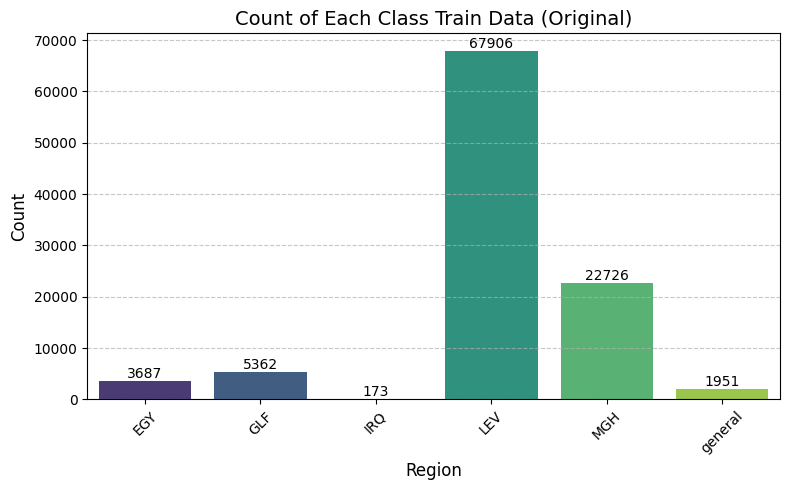

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data (Original)")

# ML Models

## Multinomial NB- 85.36%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8535674996071035
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.41      0.55       904
           1       0.69      0.36      0.47      1277
           2       0.00      0.00      0.00        39
           3       0.84      0.98      0.91     17072
           4       0.92      0.74      0.82      5652
           5       0.00      0.00      0.00       508

    accuracy                           0.85     25452
   macro avg       0.55      0.41      0.46     25452
weighted avg       0.84      0.85      0.83     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.8535674996071035
Precision: 0.8352
Recall for : 0.8536
F1 Score:  0.8335
AUC Score: 0.9583
Balanced Accuracy: 0.4148
G-mean Score: 0.7986
pf Score: 0.0666
Bal Score :  0.8862622410216909


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


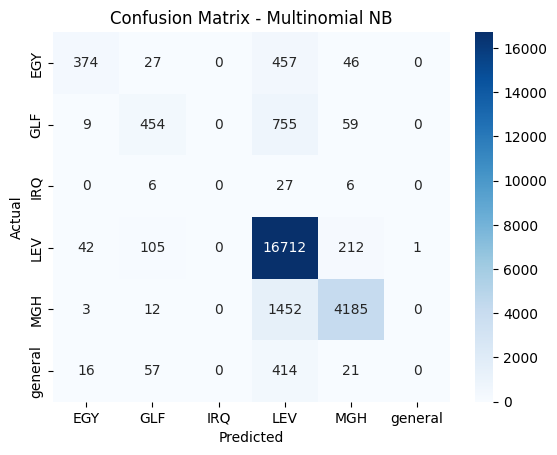

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -83.93%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8393446487505893
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.37      0.48       904
           1       0.54      0.20      0.29      1277
           2       0.29      0.05      0.09        39
           3       0.86      0.94      0.90     17072
           4       0.81      0.82      0.82      5652
           5       0.14      0.02      0.03       508

    accuracy                           0.84     25452
   macro avg       0.56      0.40      0.44     25452
weighted avg       0.81      0.84      0.82     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 24.96 seconds
Accuracy: 0.8393446487505893
Precision: 0.8134
Recall for : 0.8393
F1 Score:  0.8185
AUC Score: 0.9144
Balanced Accuracy: 0.4016
G-mean Score: 0.8094
pf Score: 0.0634
Bal Score :  0.8778824709024146


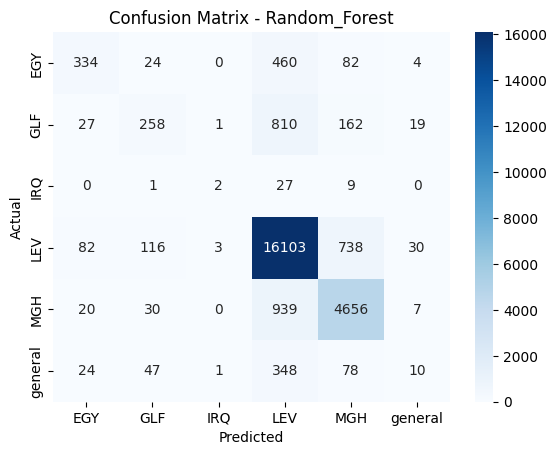

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 80.63%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8062627691340563
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.42      0.56       904
           1       0.75      0.27      0.40      1277
           2       0.17      0.03      0.04        39
           3       0.79      0.99      0.88     17072
           4       0.95      0.52      0.67      5652
           5       0.38      0.01      0.02       508

    accuracy                           0.81     25452
   macro avg       0.64      0.37      0.43     25452
weighted avg       0.81      0.81      0.78     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 139.31 seconds
Accuracy: 0.8062627691340563
Precision: 0.8132
Recall for : 0.8063
F1 Score:  0.7765
AUC Score: 0.9266
Balanced Accuracy: 0.3724
G-mean Score: 0.7142
pf Score: 0.0935
Bal Score :  0.8478854126298727


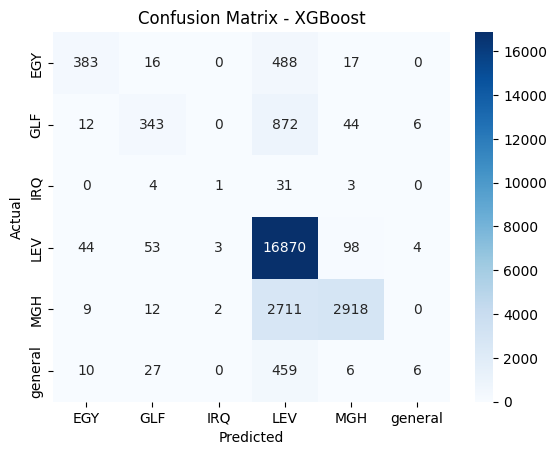

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 81.21%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.812077636335062
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.38      0.43       904
           1       0.36      0.24      0.29      1277
           2       0.14      0.08      0.10        39
           3       0.87      0.90      0.88     17072
           4       0.78      0.81      0.79      5652
           5       0.12      0.05      0.07       508

    accuracy                           0.81     25452
   macro avg       0.46      0.41      0.43     25452
weighted avg       0.79      0.81      0.80     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 33.19 seconds
Accuracy: 0.812077636335062
Precision: 0.7932
Recall for : 0.8121
F1 Score:  0.8014
AUC Score: 0.8196
Balanced Accuracy: 0.4115
G-mean Score: 0.8035
pf Score: 0.0655
Bal Score :  0.8592825895182681


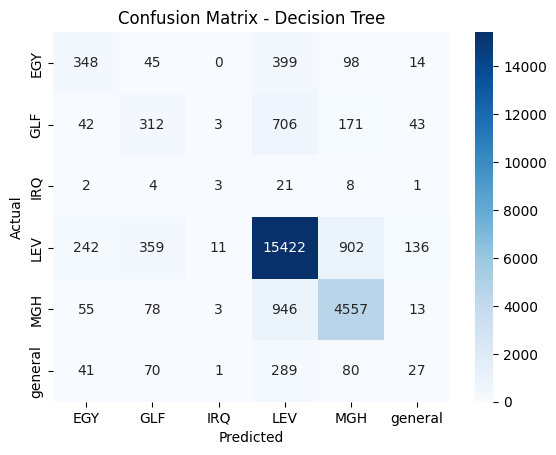

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 32.29%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.32288228822882287
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.01      0.02       904
           1       0.46      0.03      0.06      1277
           2       0.00      0.00      0.00        39
           3       0.78      0.17      0.28     17072
           4       0.24      0.92      0.38      5652
           5       0.80      0.01      0.02       508

    accuracy                           0.32     25452
   macro avg       0.51      0.19      0.13     25452
weighted avg       0.64      0.32      0.28     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.32288228822882287
Precision: 0.6429
Recall for : 0.3229
F1 Score:  0.2797
AUC Score: 0.6932
Balanced Accuracy: 0.1906
G-mean Score: 0.4918
pf Score: 0.1547
Bal Score :  0.5088707268082033


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## LightGBM Model -83.91%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 4.213749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188514
[LightGBM] [Info] Number of data points in the train set: 101805, number of used features: 4995
[LightGBM] [Info] Start training from score -3.318246
[LightGBM] [Info] Start training from score -2.943722
[LightGBM] [Info] Start training from score -6.377523
[LightGBM] [Info] Start training from score -0.404935
[LightGBM] [Info] Start training from score -1.499550
[LightGBM] [Info] Start training from score -3.954717


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8391482005343391
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.49      0.61       904
           1       0.76      0.36      0.49      1277
           2       0.35      0.15      0.21        39
           3       0.82      0.98      0.90     17072
           4       0.94      0.64      0.77      5652
           5       0.41      0.03      0.05       508

    accuracy                           0.84     25452
   macro avg       0.68      0.44      0.50     25452
weighted avg       0.84      0.84      0.82     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 63.56 seconds
Accuracy: 0.8391482005343391
Precision: 0.8371
Recall for : 0.8391
F1 Score:  0.8190
AUC Score: 0.9480
Balanced Accuracy: 0.4433
G-mean Score: 0.7721
pf Score: 0.0751
Bal Score :  0.8744780850438949


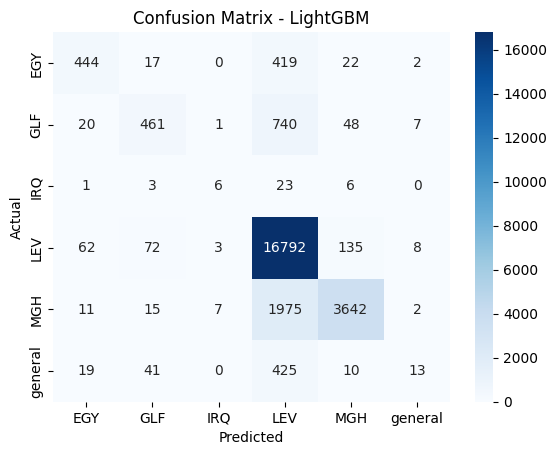

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 88.06%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8805594845198805
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.48      0.60       904
           1       0.70      0.43      0.53      1277
           2       1.00      0.05      0.10        39
           3       0.90      0.96      0.93     17072
           4       0.87      0.89      0.88      5652
           5       0.50      0.01      0.03       508

    accuracy                           0.88     25452
   macro avg       0.79      0.47      0.51     25452
weighted avg       0.87      0.88      0.87     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')


cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))
fp = np.sum(cm, axis=0) - np.diag(cm)
fn = np.sum(cm, axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)

import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time


print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)

Training time: 7.35 seconds
Accuracy: 0.8805594845198805
Precision: 0.8681
Recall for : 0.8806
F1 Score:  0.8651
AUC Score: 0.9667
Balanced Accuracy: 0.4696
G-mean Score: 0.8584
pf Score: 0.0471
Bal Score :  0.9092154157403366


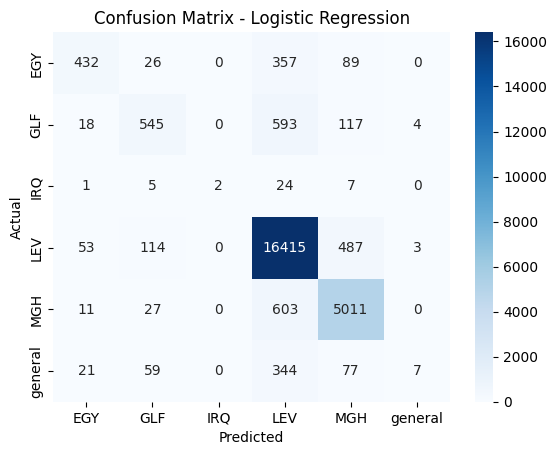

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 83.13%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8313295615275813
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.51      0.53       904
           1       0.50      0.52      0.51      1277
           2       0.00      0.00      0.00        39
           3       0.96      0.85      0.90     17072
           4       0.71      0.96      0.82      5652
           5       0.16      0.08      0.10       508

    accuracy                           0.83     25452
   macro avg       0.48      0.49      0.48     25452
weighted avg       0.85      0.83      0.83     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.06 seconds
Accuracy: 0.8313295615275813
Precision: 0.8463
Recall for : 0.8313
F1 Score:  0.8321
AUC Score: 0.9537
Balanced Accuracy: 0.4884
G-mean Score: 0.8743
pf Score: 0.0415
Bal Score :  0.877170220047757


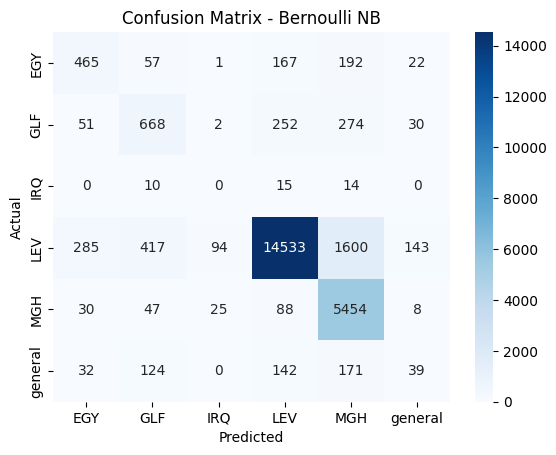

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

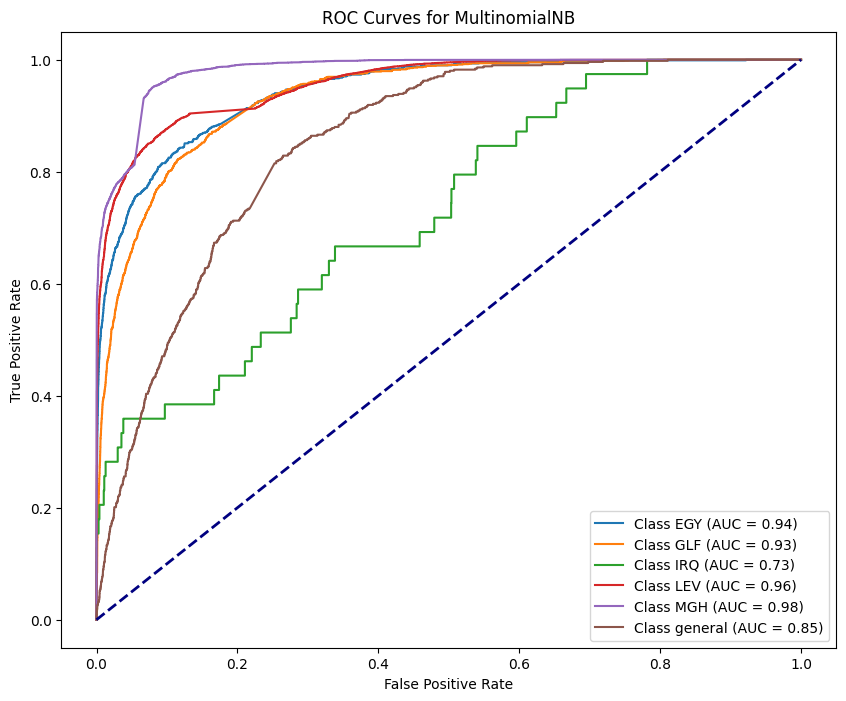

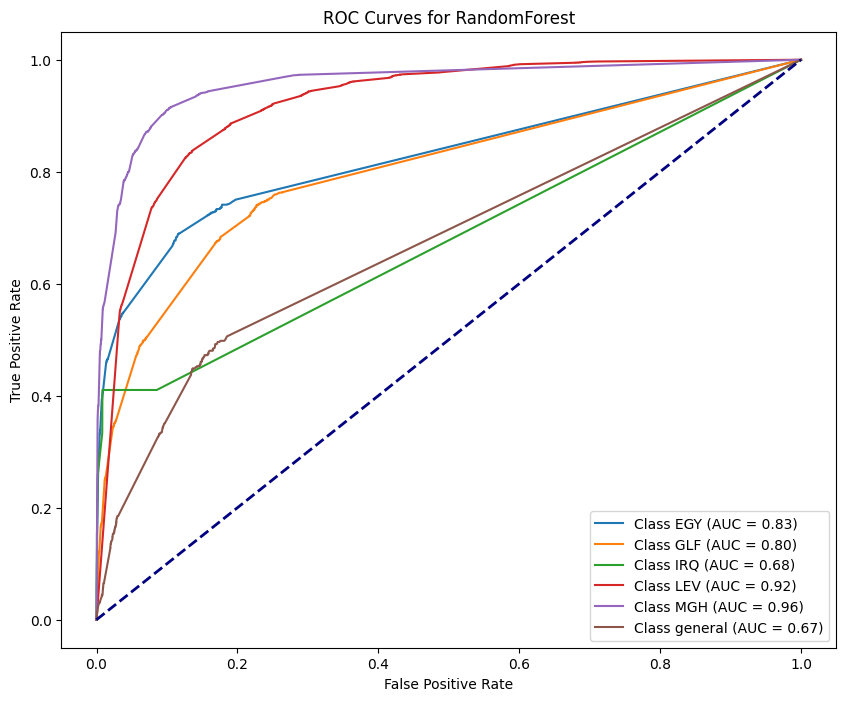

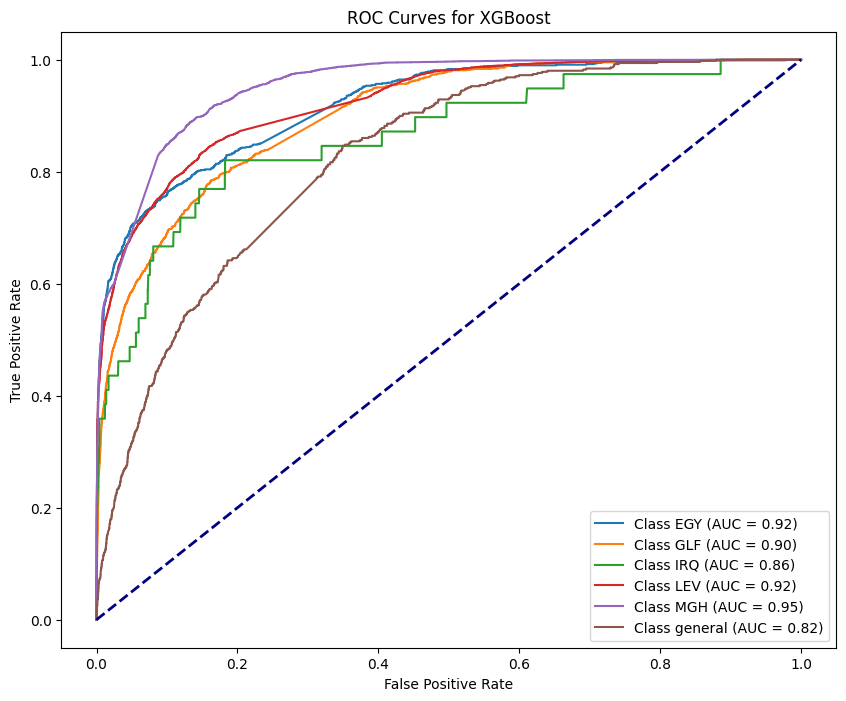

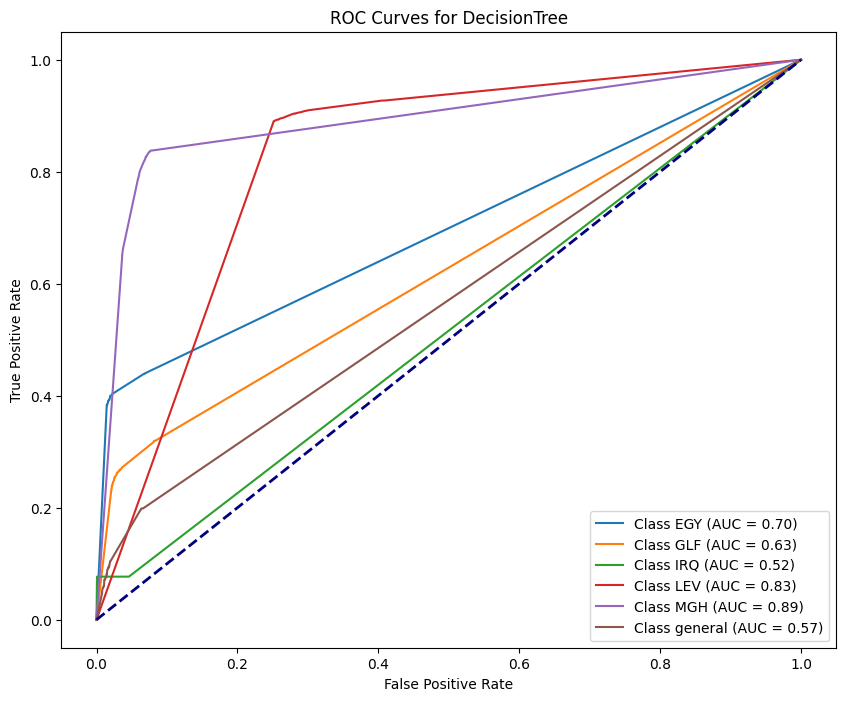

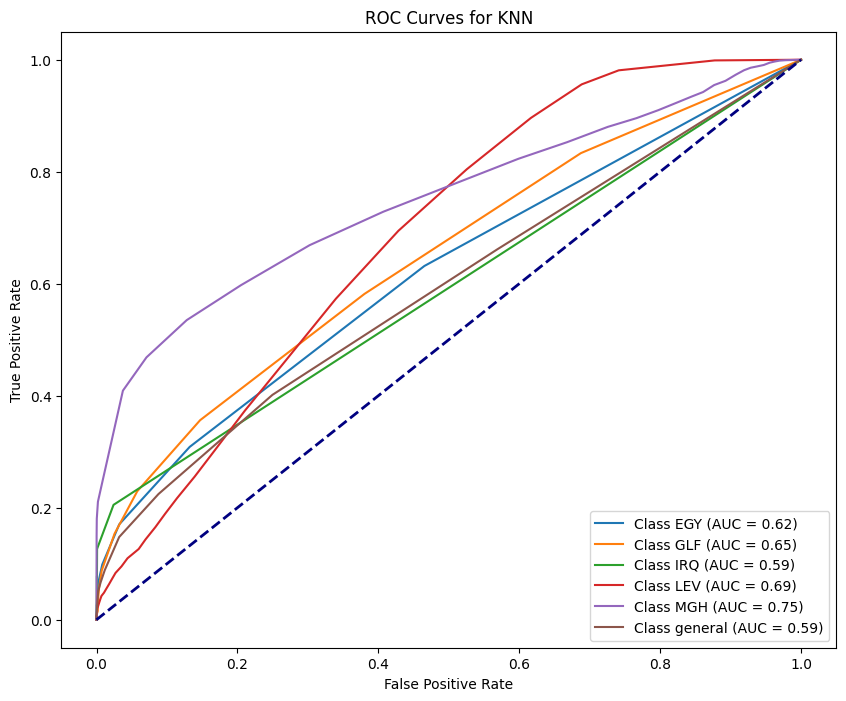

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


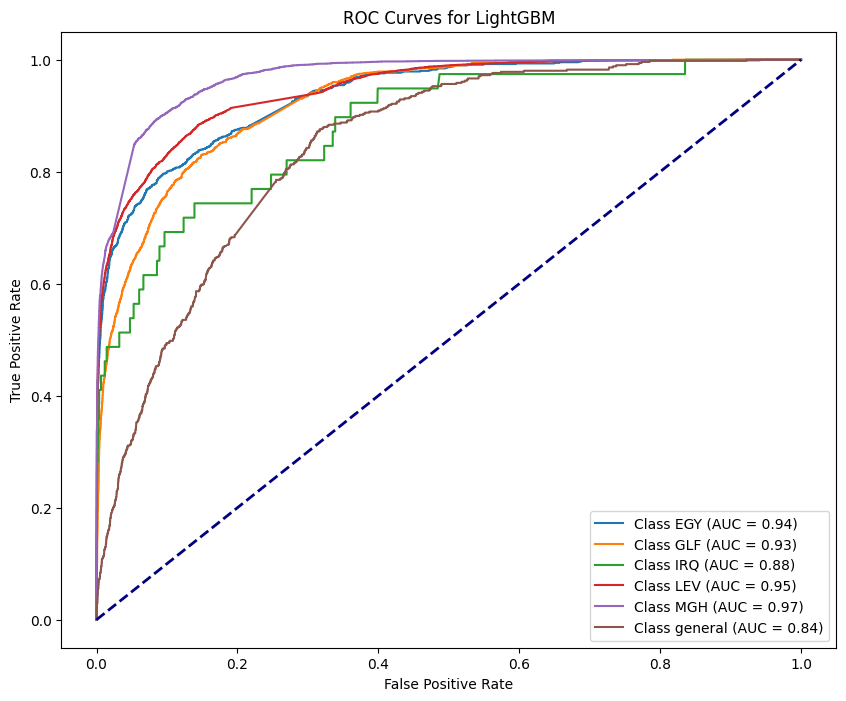

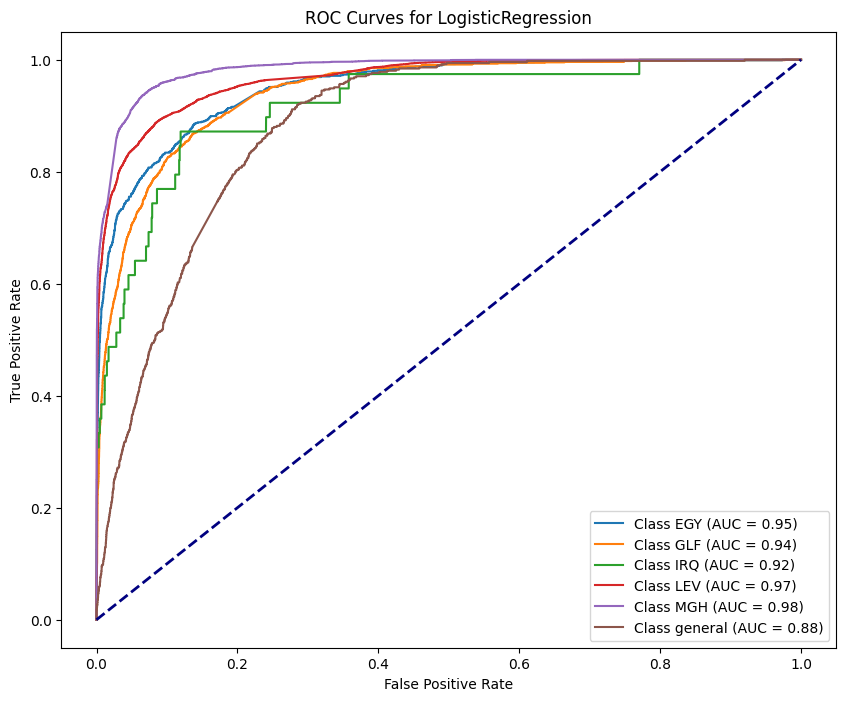

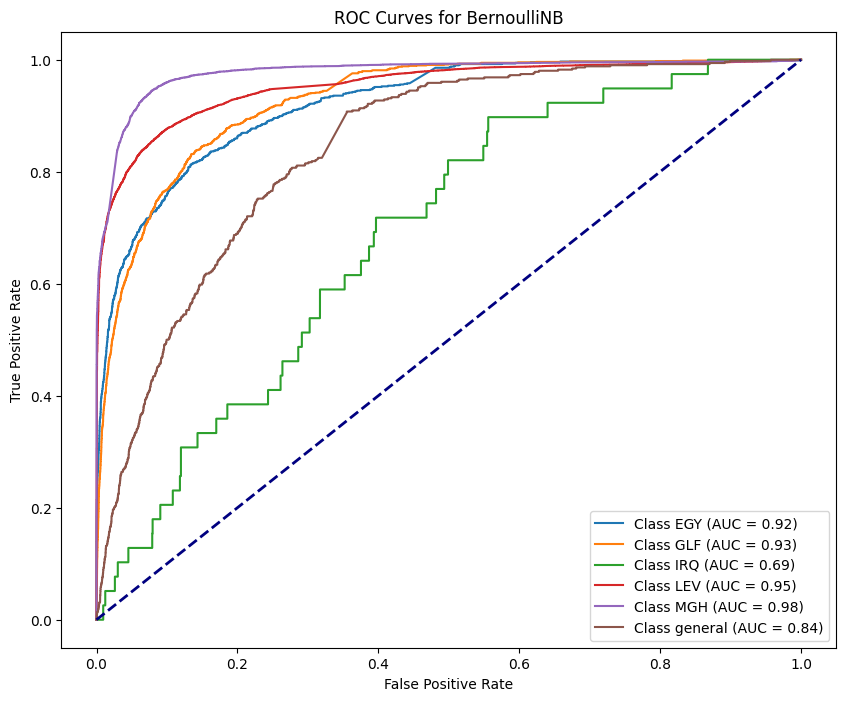

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


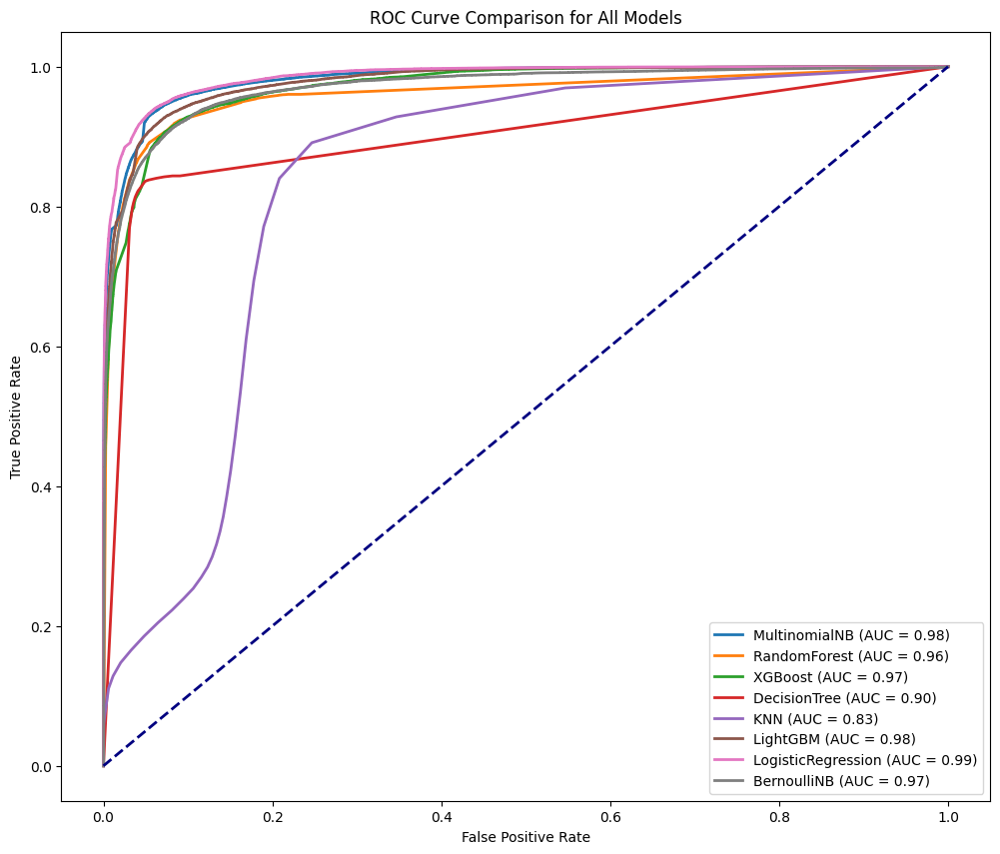

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

In [ ]:
X_train_a, X_test, y_train_a, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#**SMOTE**

In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=1)
X_train, y_train = smote.fit_resample(X_train_a,y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-93-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-93-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


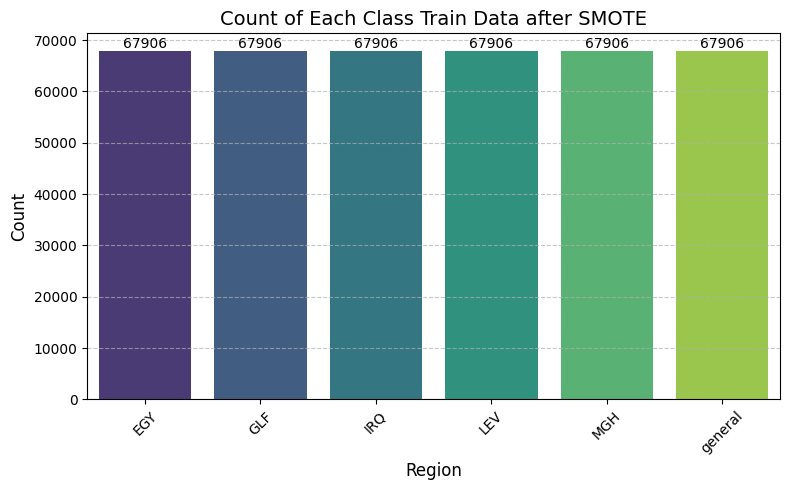

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTE")

## Multinomial NB- 75.95%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7595473833097596
Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.76      0.38       904
           1       0.37      0.61      0.46      1277
           2       0.03      0.44      0.06        39
           3       0.98      0.79      0.87     17072
           4       0.91      0.75      0.82      5652
           5       0.10      0.30      0.15       508

    accuracy                           0.76     25452
   macro avg       0.44      0.61      0.46     25452
weighted avg       0.89      0.76      0.81     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.06 seconds
Accuracy: 0.7595473833097596
Precision: 0.8858
Recall for : 0.7595
F1 Score:  0.8069
AUC Score: 0.9536
Balanced Accuracy: 0.6077
G-mean Score: 0.8549
pf Score: 0.0464
Bal Score :  0.8268407764141227


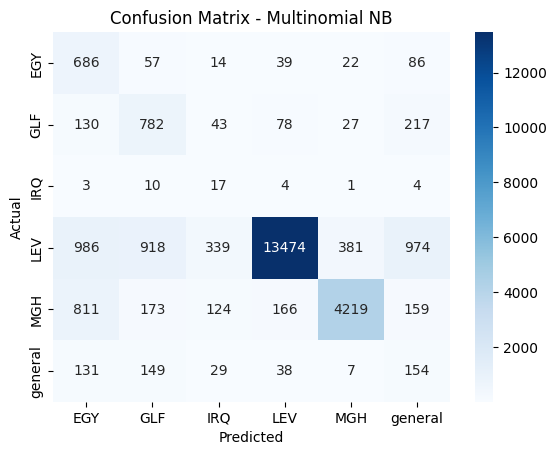

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -78.25%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7824925349677825
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.51      0.46       904
           1       0.32      0.41      0.36      1277
           2       0.02      0.13      0.04        39
           3       0.91      0.83      0.87     17072
           4       0.79      0.83      0.81      5652
           5       0.06      0.13      0.09       508

    accuracy                           0.78     25452
   macro avg       0.42      0.47      0.44     25452
weighted avg       0.82      0.78      0.80     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1377.45 seconds
Accuracy: 0.7824925349677825
Precision: 0.8179
Recall for : 0.7825
F1 Score:  0.7982
AUC Score: 0.9088
Balanced Accuracy: 0.4727
G-mean Score: 0.8239
pf Score: 0.0583
Bal Score :  0.8407626984055411


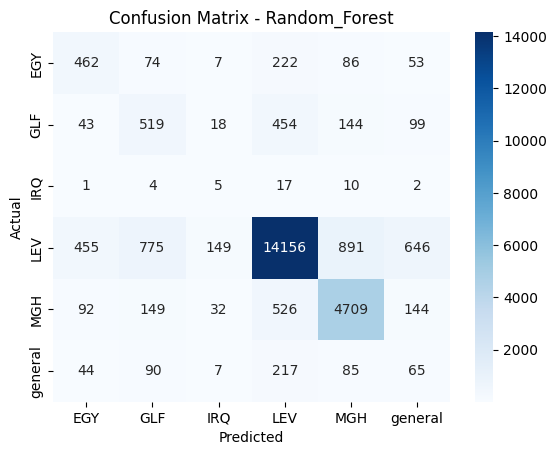

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 72.70%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.726976269055477
Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.59      0.55       904
           1       0.42      0.52      0.46      1277
           2       0.10      0.33      0.16        39
           3       0.96      0.71      0.82     17072
           4       0.63      0.88      0.73      5652
           5       0.08      0.34      0.13       508

    accuracy                           0.73     25452
   macro avg       0.45      0.56      0.48     25452
weighted avg       0.82      0.73      0.76     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 373.06 seconds
Accuracy: 0.726976269055477
Precision: 0.8241
Recall for : 0.7270
F1 Score:  0.7567
AUC Score: 0.9174
Balanced Accuracy: 0.5620
G-mean Score: 0.8185
pf Score: 0.0586
Bal Score :  0.8025516569543739


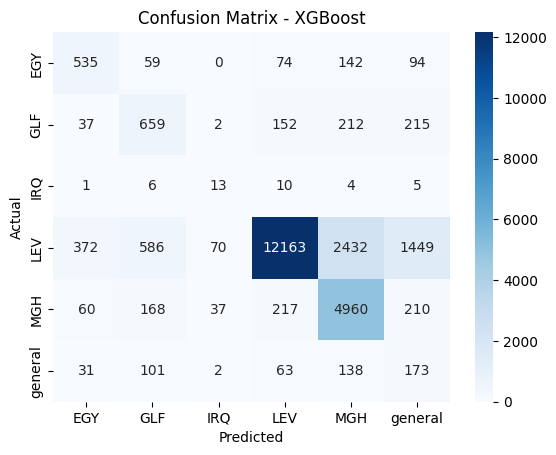

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 74.13%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7412776991984913
Classification Report:
               precision    recall  f1-score   support

           0       0.32      0.40      0.35       904
           1       0.23      0.32      0.27      1277
           2       0.06      0.33      0.10        39
           3       0.88      0.80      0.84     17072
           4       0.75      0.78      0.76      5652
           5       0.07      0.14      0.09       508

    accuracy                           0.74     25452
   macro avg       0.38      0.46      0.40     25452
weighted avg       0.78      0.74      0.76     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 162.12 seconds
Accuracy: 0.7412776991984913
Precision: 0.7829
Recall for : 0.7413
F1 Score:  0.7595
AUC Score: 0.7944
Balanced Accuracy: 0.4627
G-mean Score: 0.7871
pf Score: 0.0705
Bal Score :  0.8103830760527834


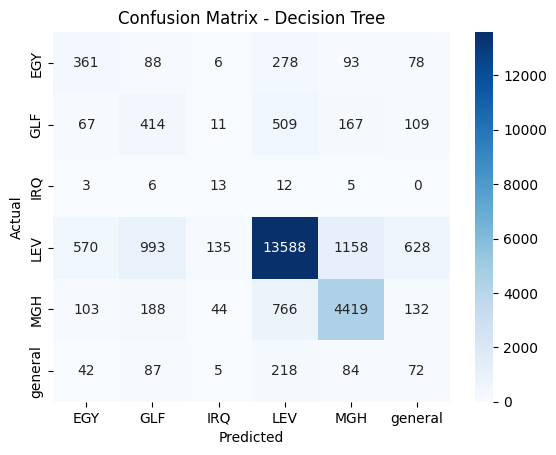

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 22.17%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.2217114568599717
Classification Report:
               precision    recall  f1-score   support

           0       0.10      0.48      0.17       904
           1       0.11      0.33      0.17      1277
           2       0.00      0.28      0.01        39
           3       0.93      0.04      0.07     17072
           4       0.76      0.69      0.73      5652
           5       0.03      0.48      0.05       508

    accuracy                           0.22     25452
   macro avg       0.32      0.38      0.20     25452
weighted avg       0.80      0.22      0.22     25452



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.2217114568599717
Precision: 0.8008
Recall for : 0.2217
F1 Score:  0.2233
AUC Score: 0.6576
Balanced Accuracy: 0.3840
G-mean Score: 0.4620
pf Score: 0.1359
Bal Score :  0.44133548814602874


## LightGBM Model -72.39%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 20.515745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315026
[LightGBM] [Info] Number of data points in the train set: 407436, number of used features: 4992
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7239116768819739
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.64      0.54       904
           1       0.42      0.57      0.48      1277
           2       0.07      0.33      0.11        39
           3       0.96      0.76      0.85     17072
           4       0.81      0.70      0.75      5652
           5       0.06      0.50      0.11       508

    accuracy                           0.72     25452
   macro avg       0.47      0.58      0.47     25452
weighted avg       0.87      0.72      0.78     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 154.49 seconds
Accuracy: 0.7239116768819739
Precision: 0.8662
Recall for : 0.7239
F1 Score:  0.7812
AUC Score: 0.9372
Balanced Accuracy: 0.5819
G-mean Score: 0.8270
pf Score: 0.0552
Bal Score :  0.8009091289901001


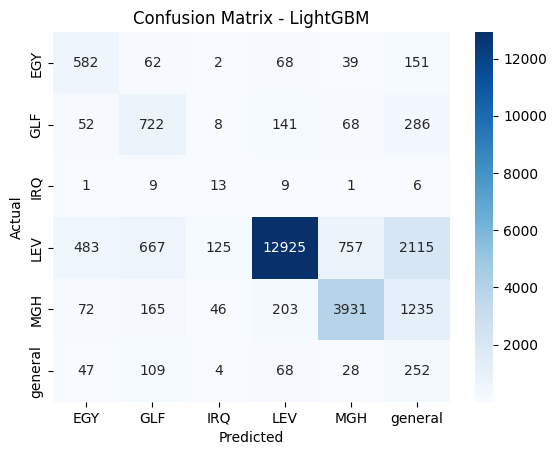

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 77.02%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7701555869872702
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.68      0.51       904
           1       0.38      0.63      0.47      1277
           2       0.03      0.31      0.05        39
           3       0.97      0.80      0.88     17072
           4       0.89      0.75      0.81      5652
           5       0.07      0.34      0.12       508

    accuracy                           0.77     25452
   macro avg       0.46      0.59      0.47     25452
weighted avg       0.88      0.77      0.81     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 22.83 seconds
Accuracy: 0.7701555869872702
Precision: 0.8808
Recall for : 0.7702
F1 Score:  0.8146
AUC Score: 0.9533
Balanced Accuracy: 0.5863
G-mean Score: 0.8559
pf Score: 0.0464
Bal Score :  0.8341901670816664


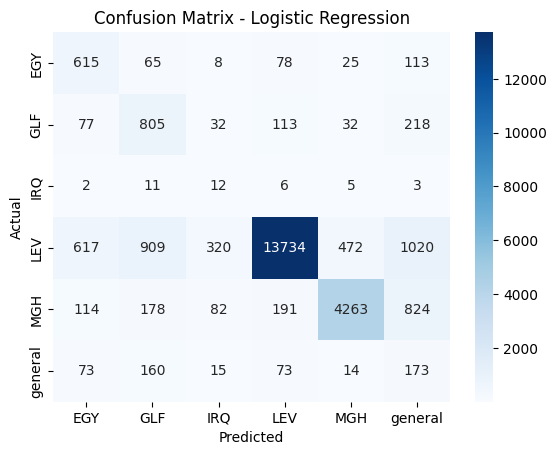

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 76.91%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7690947666195191
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.57      0.52       904
           1       0.40      0.53      0.46      1277
           2       0.05      0.31      0.09        39
           3       0.99      0.75      0.86     17072
           4       0.78      0.93      0.85      5652
           5       0.09      0.46      0.14       508

    accuracy                           0.77     25452
   macro avg       0.46      0.59      0.49     25452
weighted avg       0.88      0.77      0.81     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')

cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)

import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time

print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)

Training time: 0.10 seconds
Accuracy: 0.7690947666195191
Precision: 0.8765
Recall for : 0.7691
F1 Score:  0.8075
AUC Score: 0.9544
Balanced Accuracy: 0.5915
G-mean Score: 0.8625
pf Score: 0.0439
Bal Score :  0.8337971676530009


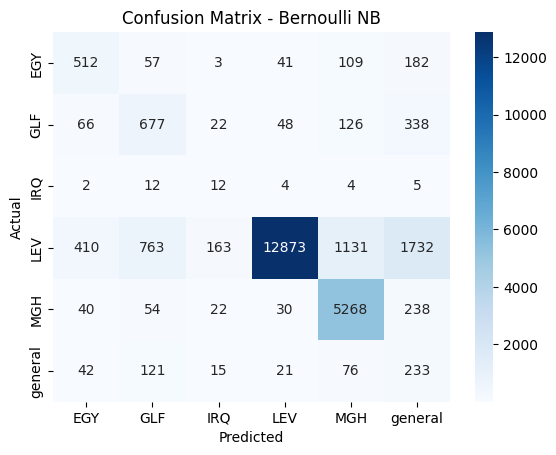

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

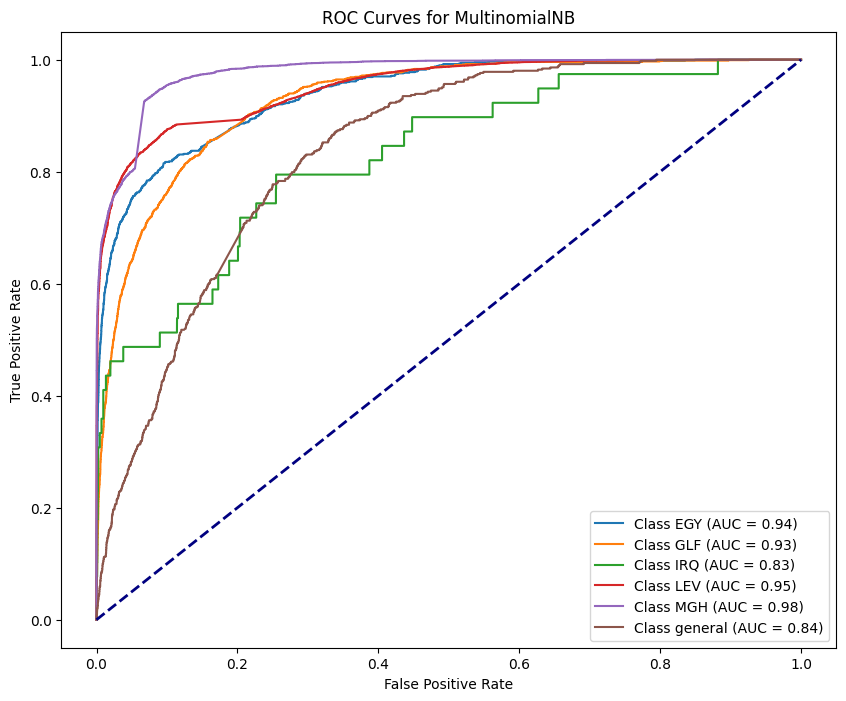

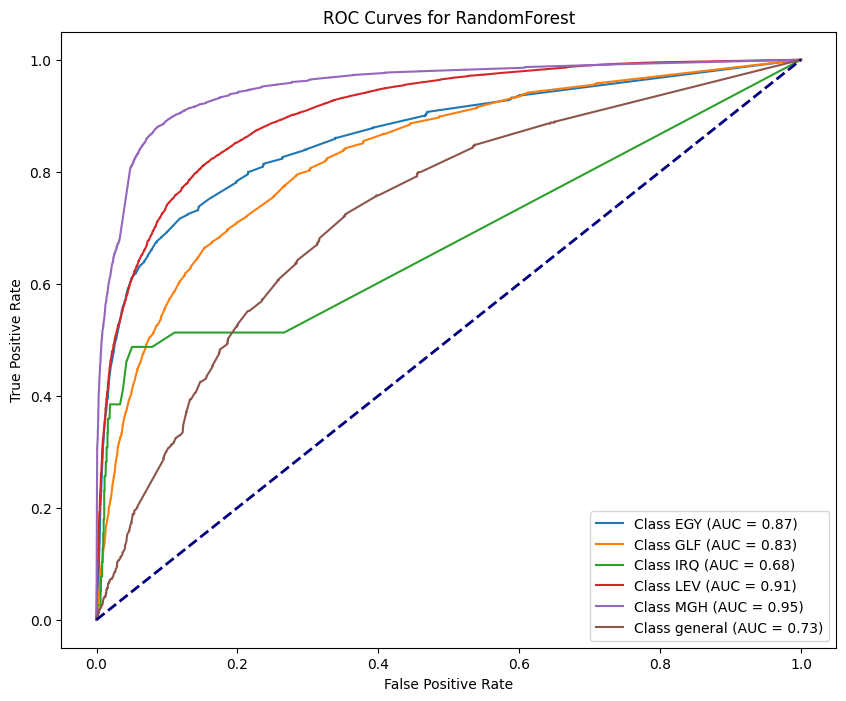

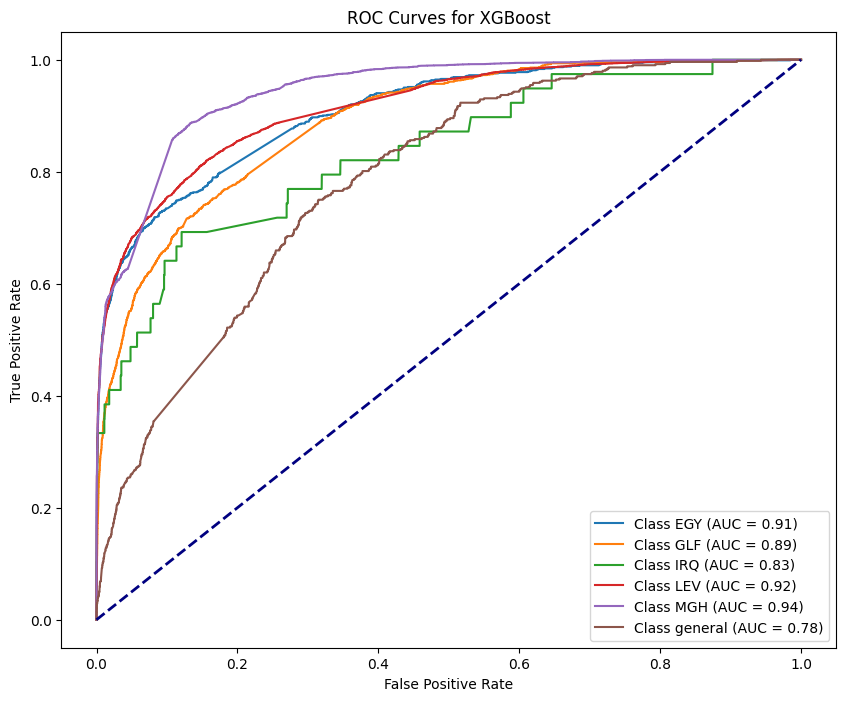

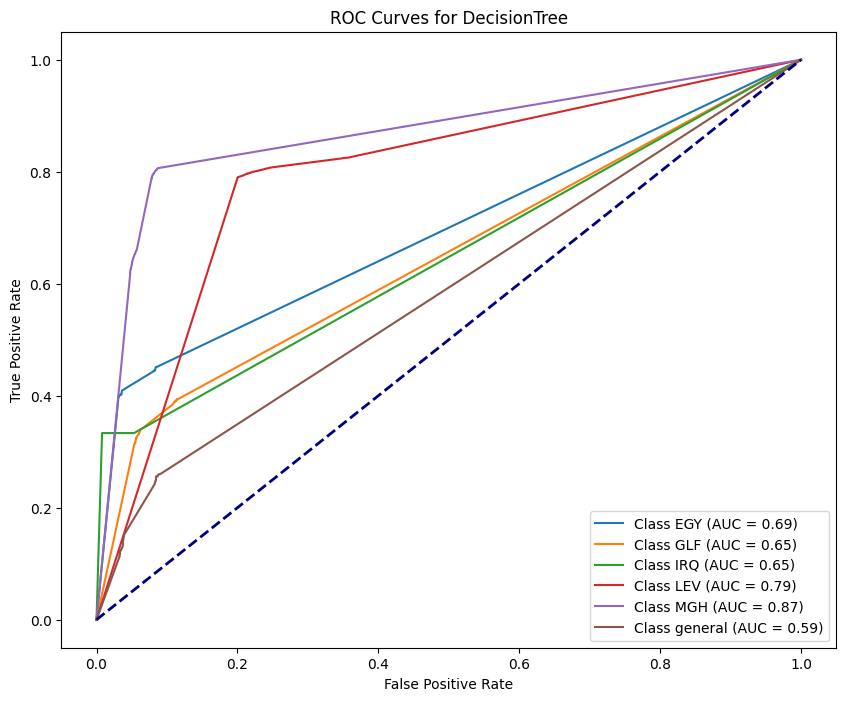

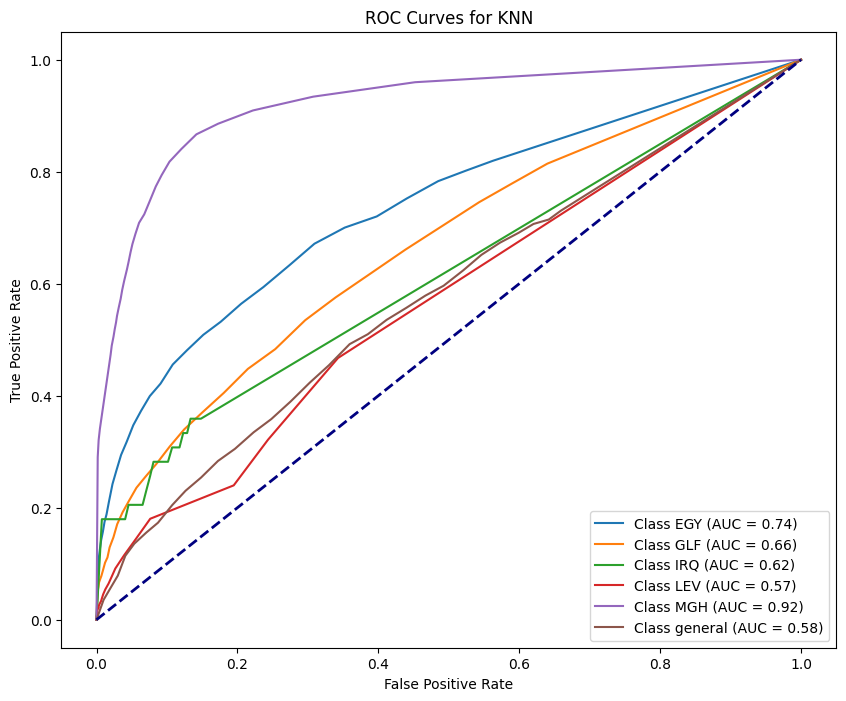

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


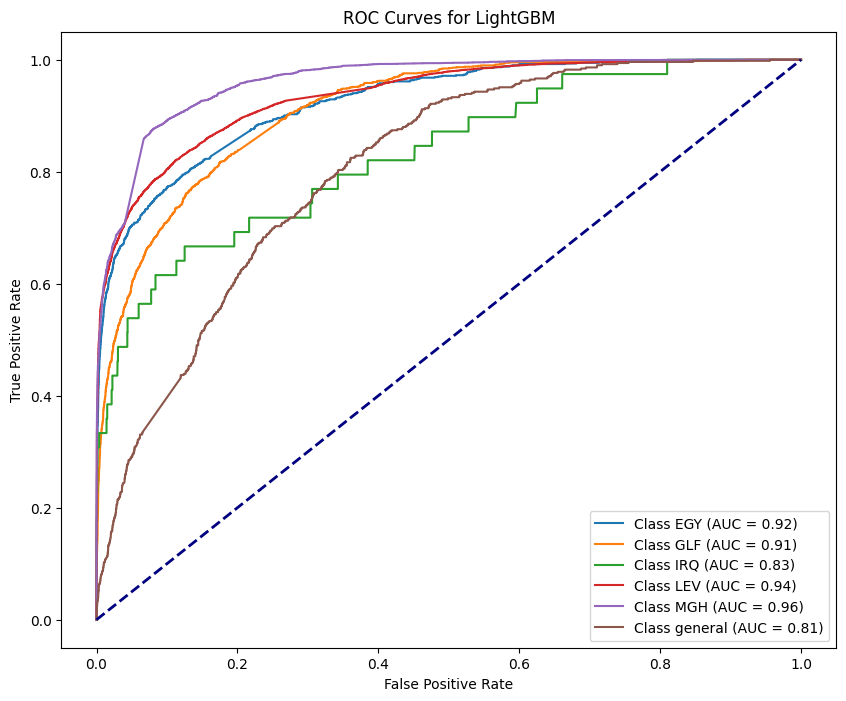

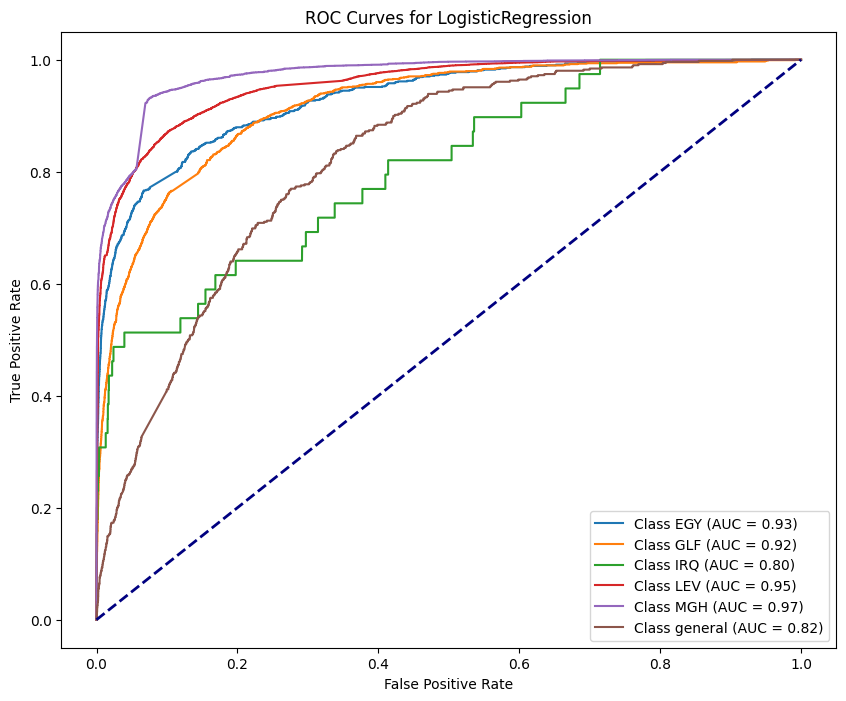

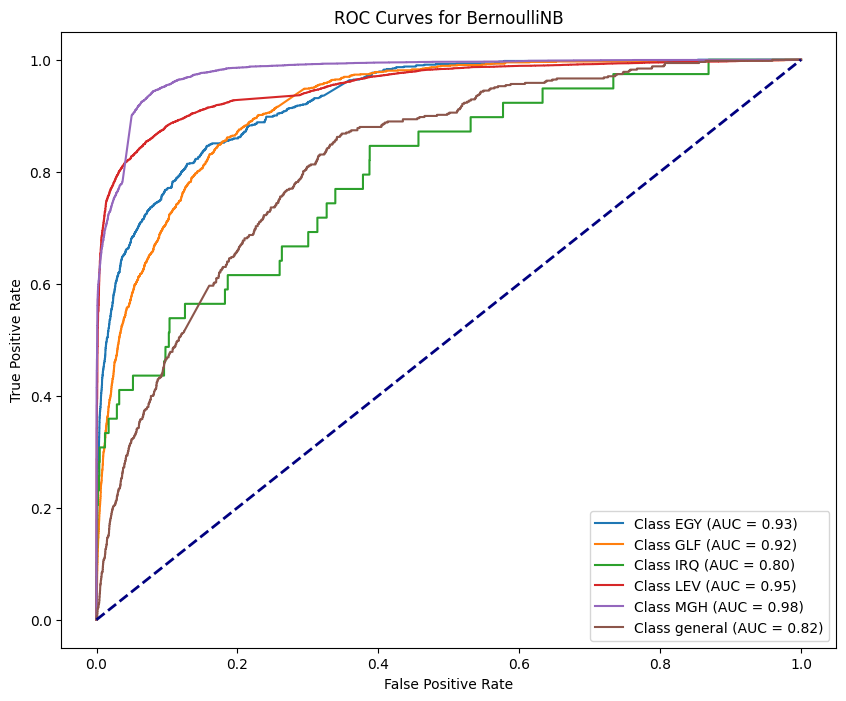

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


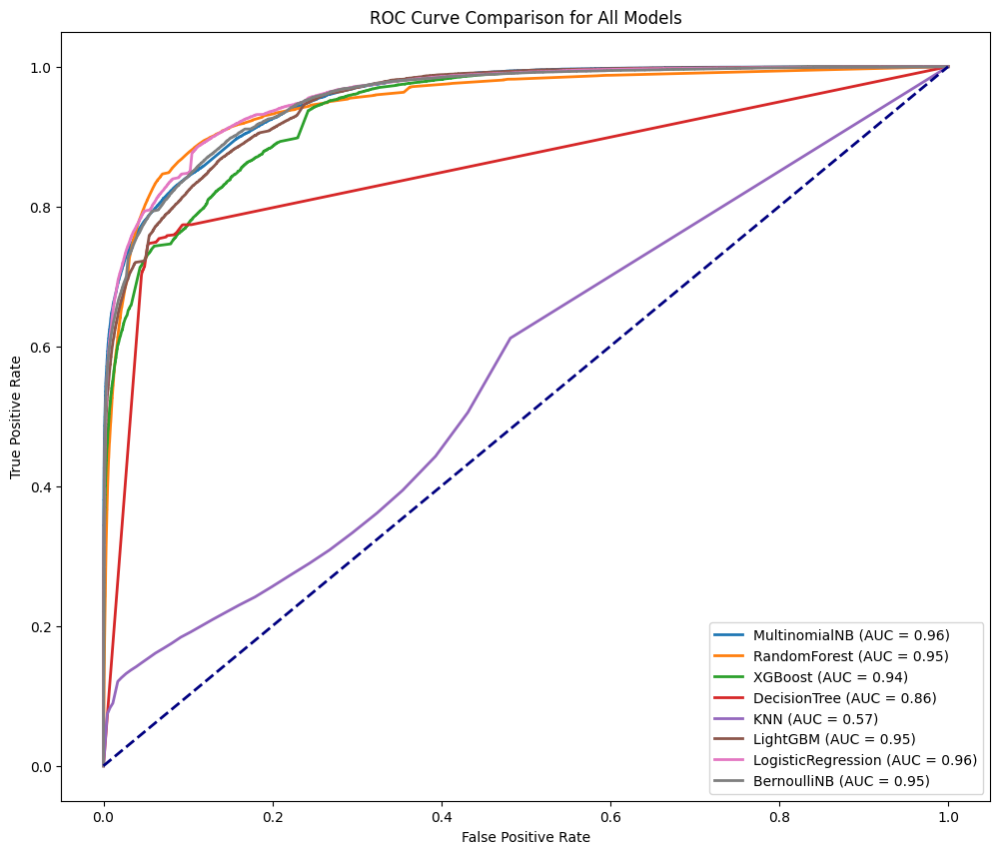

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ROS**

In [ ]:
from imblearn.over_sampling import RandomOverSampler

In [ ]:
rose = RandomOverSampler(random_state=42)
X_train, y_train = rose.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-142-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-142-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


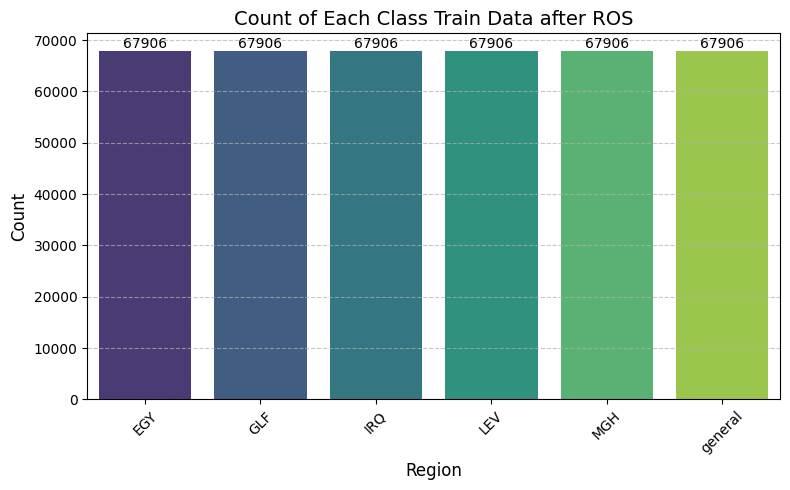

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ROS")

## Multinomial NB- 75.51%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.755068363979255
Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.75      0.38       904
           1       0.37      0.61      0.46      1277
           2       0.03      0.41      0.05        39
           3       0.98      0.78      0.87     17072
           4       0.90      0.75      0.82      5652
           5       0.09      0.30      0.14       508

    accuracy                           0.76     25452
   macro avg       0.44      0.60      0.45     25452
weighted avg       0.89      0.76      0.80     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.06 seconds
Accuracy: 0.755068363979255
Precision: 0.8850
Recall for : 0.7551
F1 Score:  0.8040
AUC Score: 0.9532
Balanced Accuracy: 0.6006
G-mean Score: 0.8527
pf Score: 0.0470
Bal Score :  0.8236471183446556


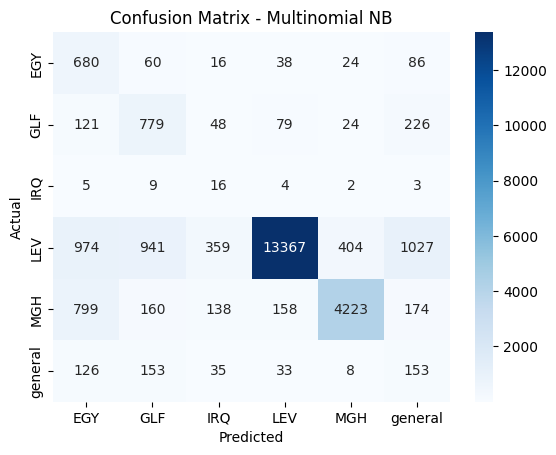

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -83.20%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.832036775106082
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.46      0.53       904
           1       0.49      0.26      0.34      1277
           2       0.13      0.13      0.13        39
           3       0.88      0.92      0.90     17072
           4       0.80      0.83      0.81      5652
           5       0.11      0.08      0.09       508

    accuracy                           0.83     25452
   macro avg       0.50      0.45      0.47     25452
weighted avg       0.82      0.83      0.82     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1188.51 seconds
Accuracy: 0.832036775106082
Precision: 0.8166
Recall for : 0.8320
F1 Score:  0.8218
AUC Score: 0.9272
Balanced Accuracy: 0.4471
G-mean Score: 0.8235
pf Score: 0.0588
Bal Score :  0.8741612513441597


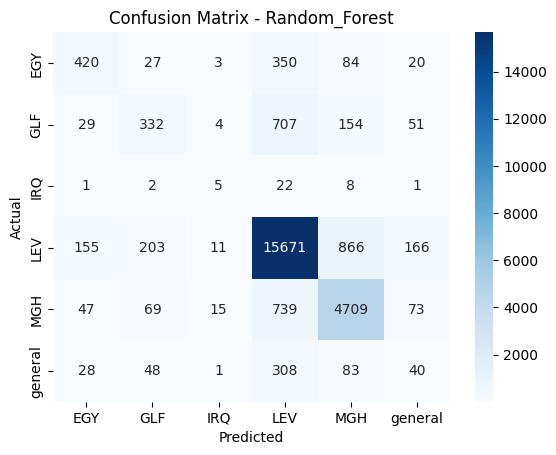

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 69.96%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6995913877101996
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.62      0.50       904
           1       0.35      0.55      0.43      1277
           2       0.08      0.36      0.14        39
           3       0.98      0.67      0.79     17072
           4       0.63      0.88      0.73      5652
           5       0.07      0.34      0.12       508

    accuracy                           0.70     25452
   macro avg       0.42      0.57      0.45     25452
weighted avg       0.83      0.70      0.74     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 185.11 seconds
Accuracy: 0.6995913877101996
Precision: 0.8302
Recall for : 0.6996
F1 Score:  0.7373
AUC Score: 0.9179
Balanced Accuracy: 0.5694
G-mean Score: 0.8114
pf Score: 0.0599
Bal Score :  0.7833972536262738


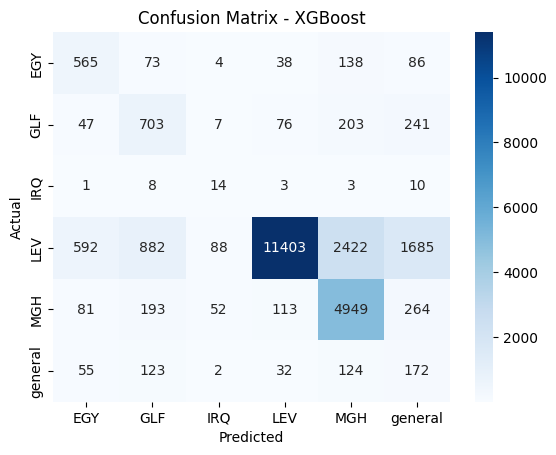

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 74.52%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7452459531667452
Classification Report:
               precision    recall  f1-score   support

           0       0.35      0.42      0.38       904
           1       0.23      0.32      0.27      1277
           2       0.09      0.33      0.14        39
           3       0.88      0.81      0.84     17072
           4       0.73      0.77      0.75      5652
           5       0.09      0.15      0.11       508

    accuracy                           0.75     25452
   macro avg       0.39      0.47      0.41     25452
weighted avg       0.78      0.75      0.76     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 97.32 seconds
Accuracy: 0.7452459531667452
Precision: 0.7806
Recall for : 0.7452
F1 Score:  0.7608
AUC Score: 0.7957
Balanced Accuracy: 0.4667
G-mean Score: 0.7878
pf Score: 0.0703
Bal Score :  0.8131214032360762


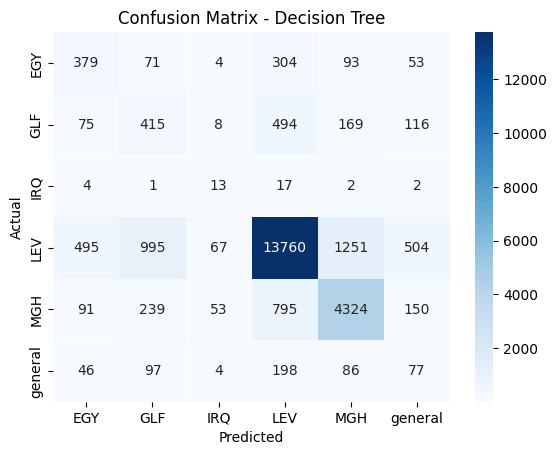

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 26.57%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.26567656765676567
Classification Report:
               precision    recall  f1-score   support

           0       0.13      0.19      0.16       904
           1       0.16      0.24      0.20      1277
           2       0.03      0.18      0.06        39
           3       0.94      0.08      0.14     17072
           4       0.28      0.85      0.43      5652
           5       0.04      0.31      0.07       508

    accuracy                           0.27     25452
   macro avg       0.27      0.31      0.18     25452
weighted avg       0.71      0.27      0.21     25452



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.26567656765676567
Precision: 0.7085
Recall for : 0.2657
F1 Score:  0.2062
AUC Score: 0.6928
Balanced Accuracy: 0.3086
G-mean Score: 0.4752
pf Score: 0.1474
Bal Score :  0.47039975895191444


## LightGBM Model -73.22%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 20.621340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 170795
[LightGBM] [Info] Number of data points in the train set: 407436, number of used features: 4992
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7321625019644822
Classification Report:
               precision    recall  f1-score   support

           0       0.40      0.66      0.50       904
           1       0.36      0.59      0.44      1277
           2       0.07      0.38      0.12        39
           3       0.98      0.71      0.82     17072
           4       0.72      0.87      0.79      5652
           5       0.08      0.36      0.13       508

    accuracy                           0.73     25452
   macro avg       0.43      0.60      0.47     25452
weighted avg       0.85      0.73      0.77     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 122.77 seconds
Accuracy: 0.7321625019644822
Precision: 0.8496
Recall for : 0.7322
F1 Score:  0.7707
AUC Score: 0.9371
Balanced Accuracy: 0.5972
G-mean Score: 0.8345
pf Score: 0.0528
Bal Score :  0.8069674485759862


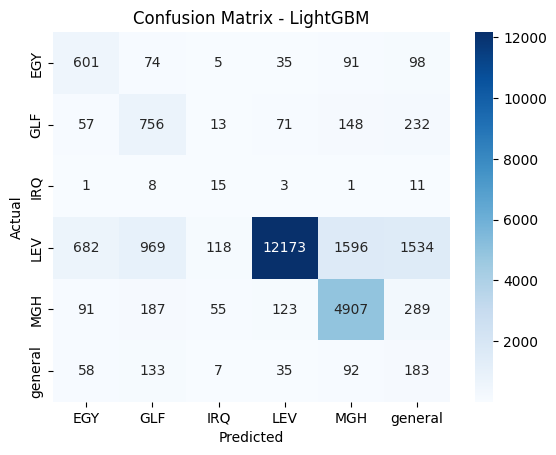

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 78.54%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7853999685682854
Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.67      0.50       904
           1       0.36      0.62      0.46      1277
           2       0.05      0.36      0.08        39
           3       0.97      0.79      0.87     17072
           4       0.85      0.88      0.86      5652
           5       0.09      0.31      0.14       508

    accuracy                           0.79     25452
   macro avg       0.45      0.60      0.48     25452
weighted avg       0.88      0.79      0.82     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 23.93 seconds
Accuracy: 0.7853999685682854
Precision: 0.8760
Recall for : 0.7854
F1 Score:  0.8196
AUC Score: 0.9529
Balanced Accuracy: 0.6045
G-mean Score: 0.8666
pf Score: 0.0431
Bal Score :  0.8452305871543356


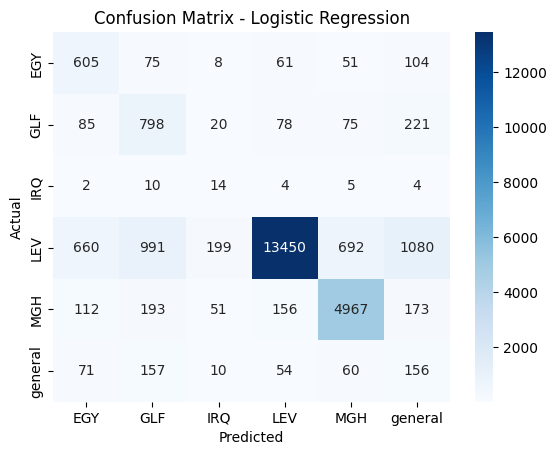

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 76.44%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7643800094295143
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.57      0.51       904
           1       0.40      0.54      0.46      1277
           2       0.03      0.36      0.05        39
           3       0.99      0.75      0.85     17072
           4       0.78      0.93      0.85      5652
           5       0.09      0.43      0.15       508

    accuracy                           0.76     25452
   macro avg       0.46      0.60      0.48     25452
weighted avg       0.88      0.76      0.80     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.09 seconds
Accuracy: 0.7643800094295143
Precision: 0.8760
Recall for : 0.7644
F1 Score:  0.8045
AUC Score: 0.9543
Balanced Accuracy: 0.5954
G-mean Score: 0.8601
pf Score: 0.0447
Bal Score :  0.8304263527188946


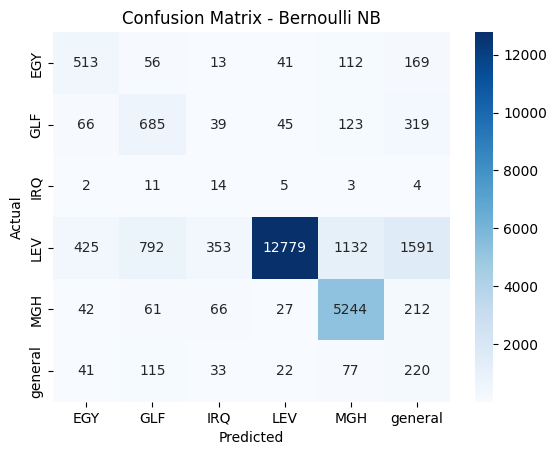

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

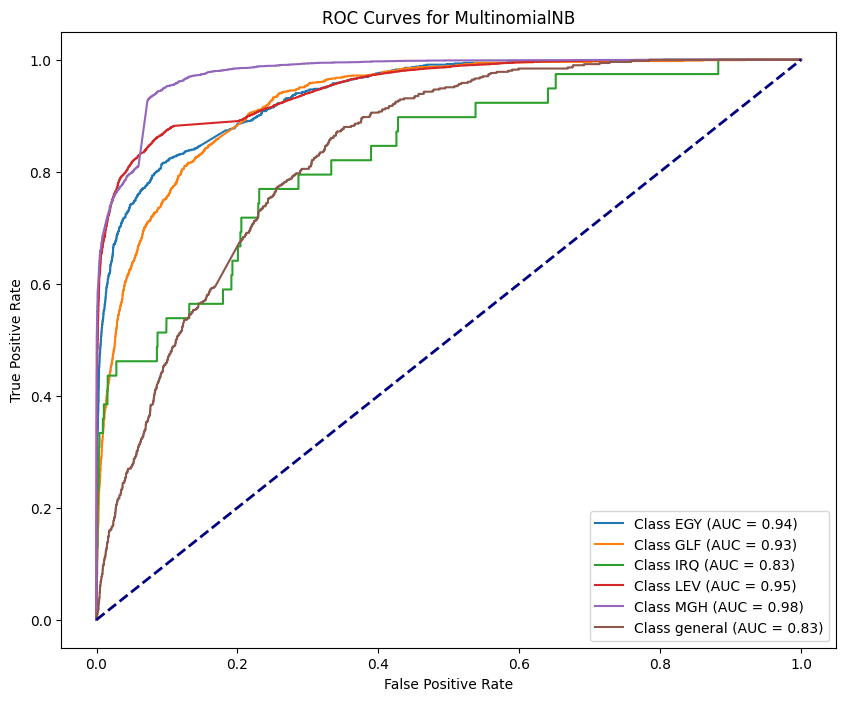

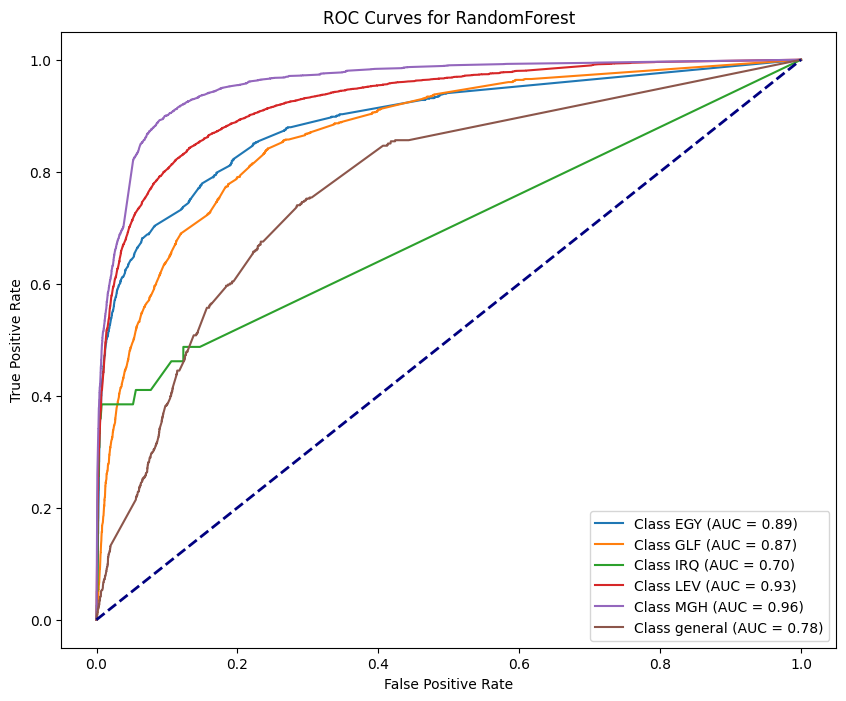

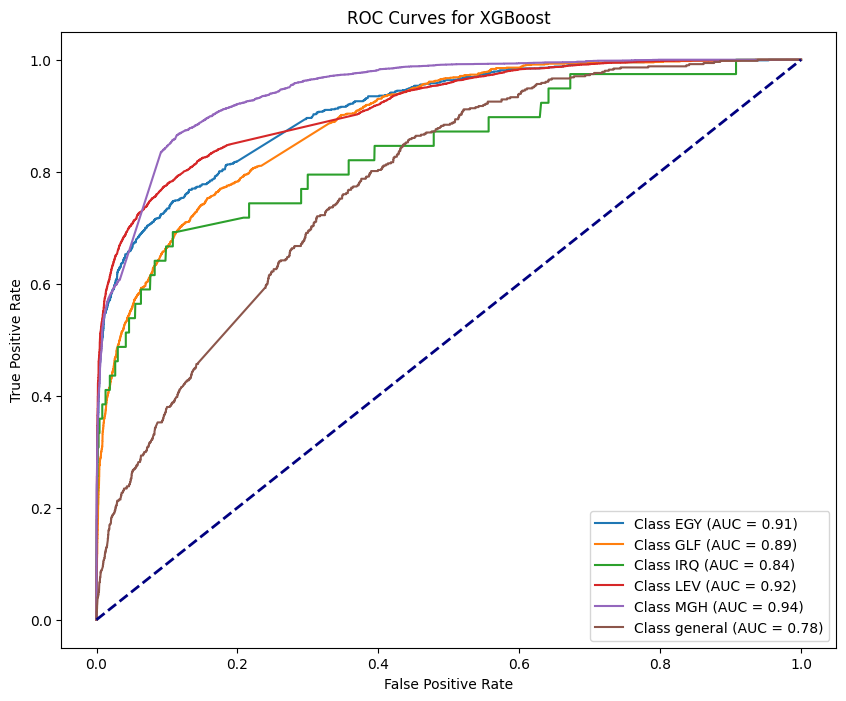

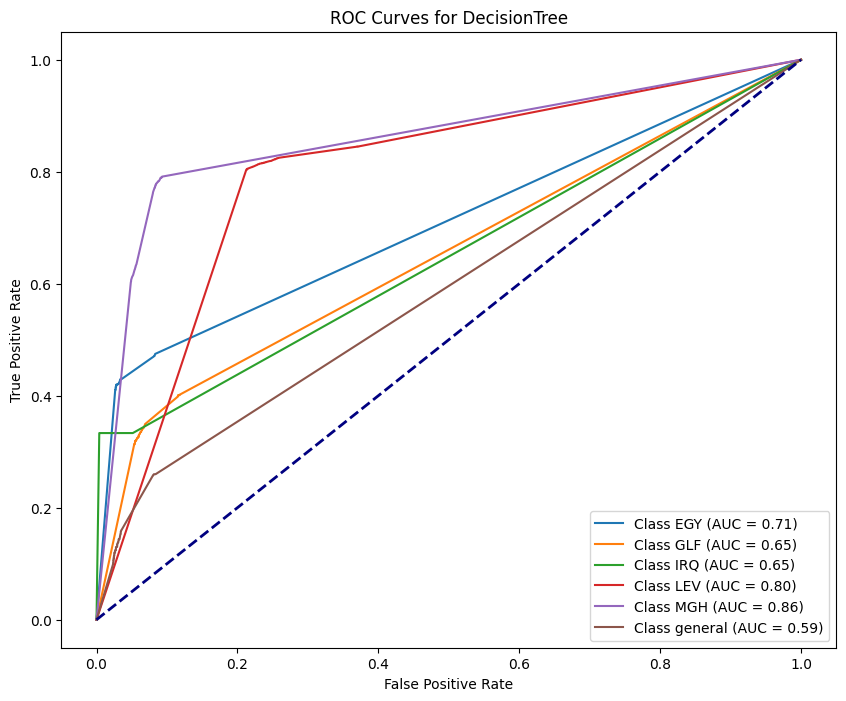

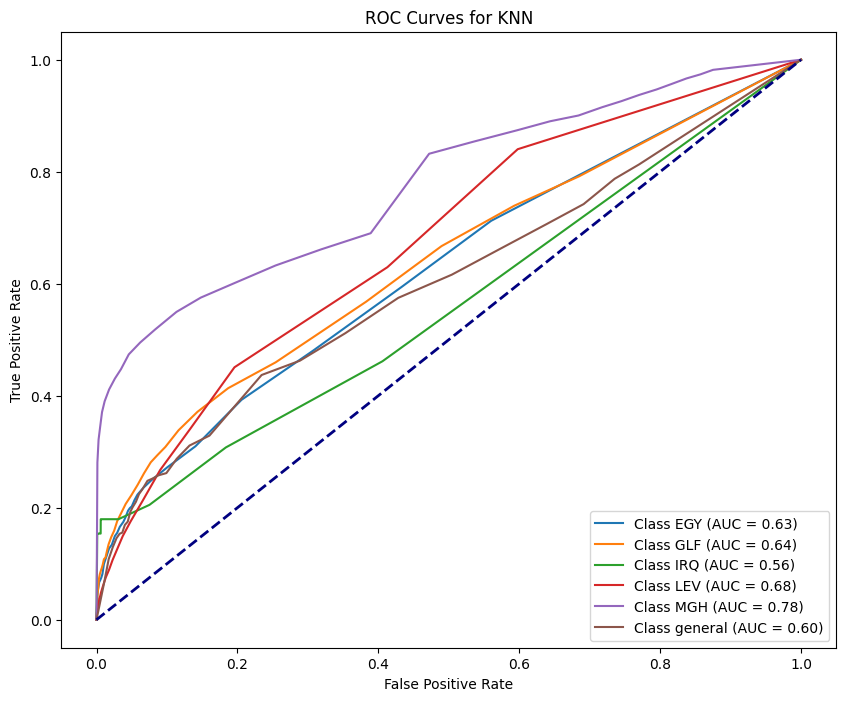

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


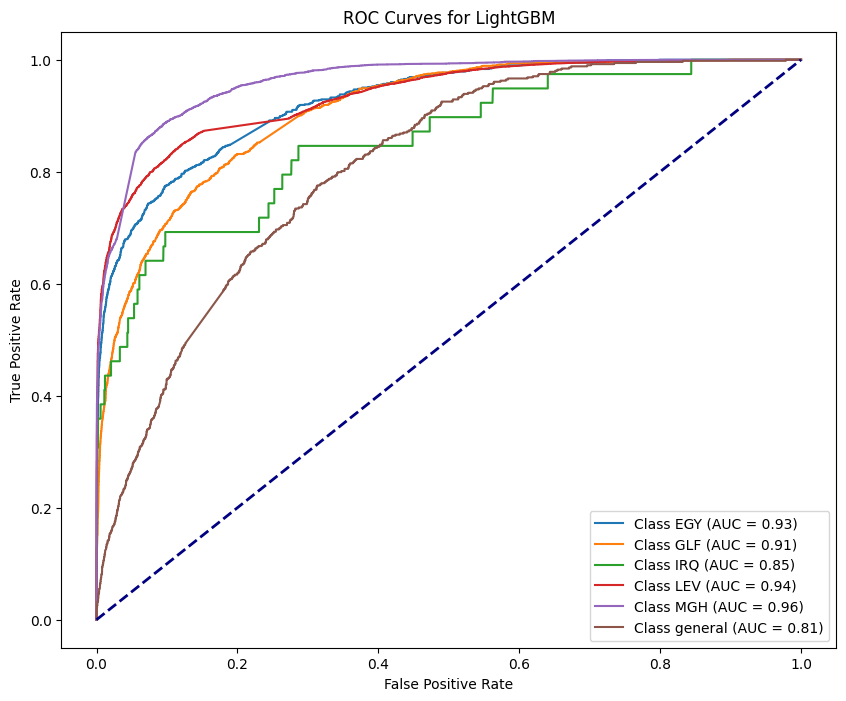

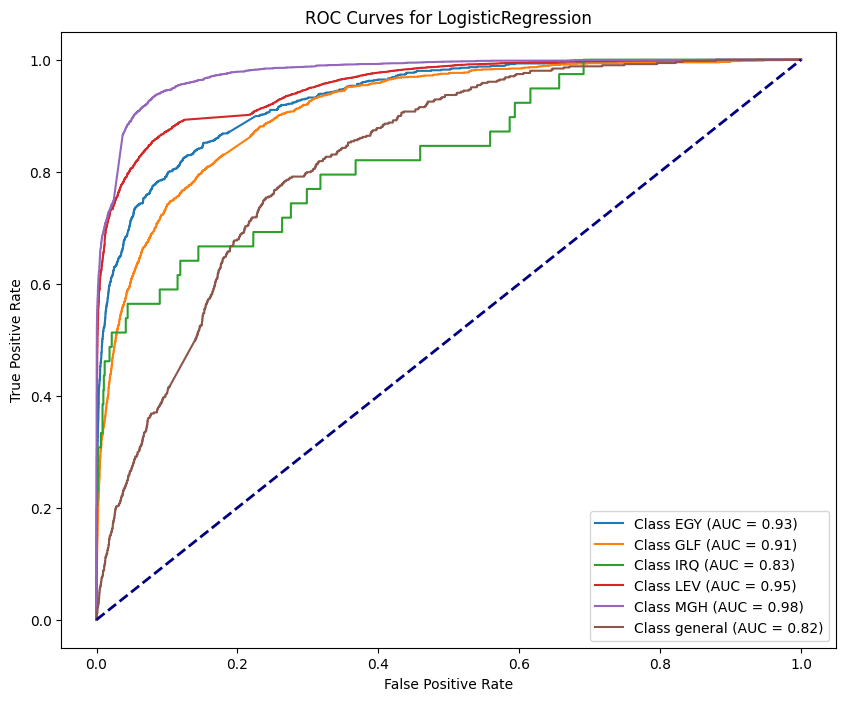

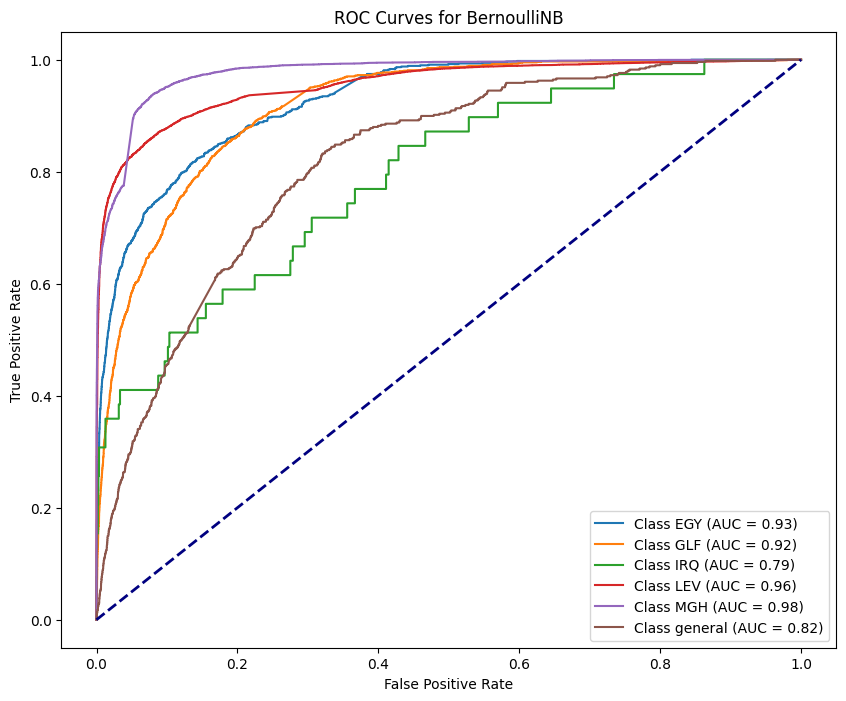

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


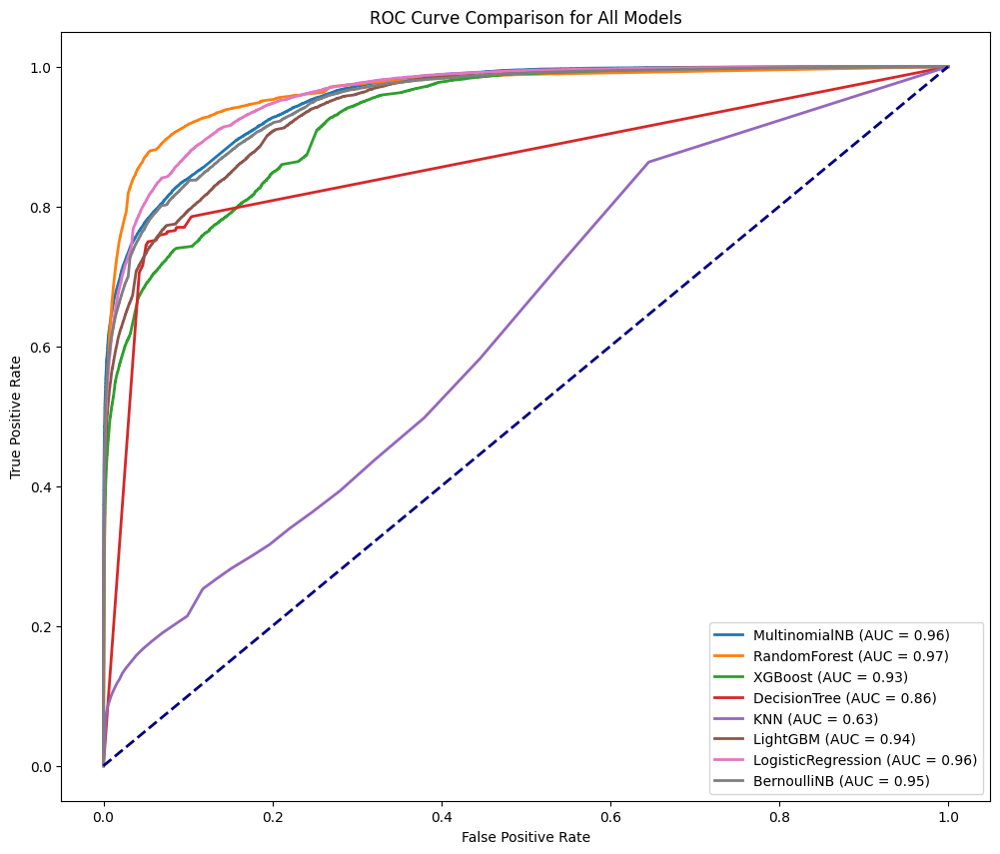

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ADASYN**

In [ ]:
from imblearn.over_sampling import ADASYN
adasyn = ADASYN(sampling_strategy='minority', random_state=42)
X_train, y_train = adasyn.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-190-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-190-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


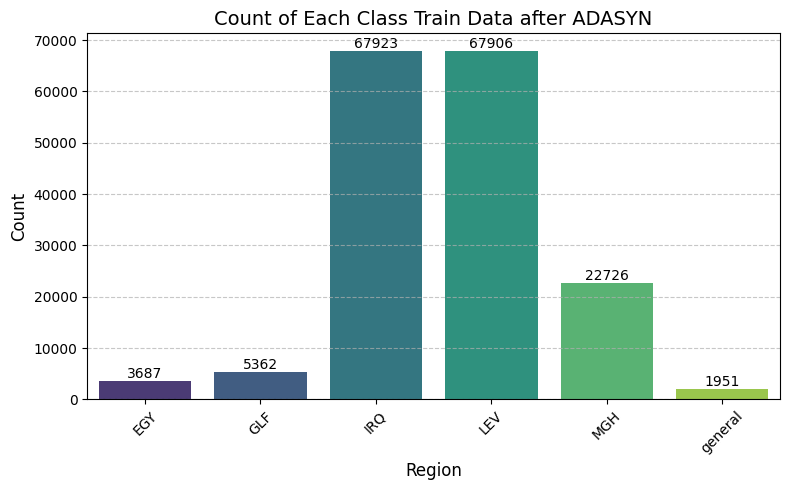

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ADASYN")

## Multinomial NB- 82.32%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8231573157315731
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.41      0.55       904
           1       0.69      0.33      0.45      1277
           2       0.01      0.51      0.02        39
           3       0.89      0.94      0.91     17072
           4       0.93      0.73      0.82      5652
           5       0.00      0.00      0.00       508

    accuracy                           0.82     25452
   macro avg       0.56      0.49      0.46     25452
weighted avg       0.87      0.82      0.84     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.06 seconds
Accuracy: 0.8231573157315731
Precision: 0.8683
Recall for : 0.8232
F1 Score:  0.8364
AUC Score: 0.9540
Balanced Accuracy: 0.4873
G-mean Score: 0.8307
pf Score: 0.0564
Bal Score :  0.8687444362407788


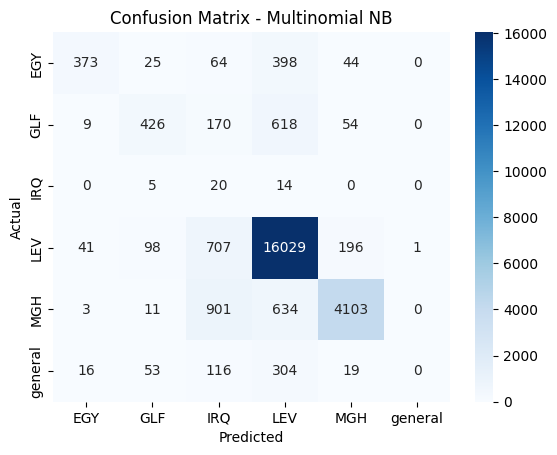

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -83.08%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8308187961653308
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.25      0.37       904
           1       0.56      0.11      0.19      1277
           2       0.02      0.13      0.03        39
           3       0.85      0.94      0.89     17072
           4       0.83      0.82      0.83      5652
           5       0.14      0.02      0.03       508

    accuracy                           0.83     25452
   macro avg       0.52      0.38      0.39     25452
weighted avg       0.81      0.83      0.81     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 352.73 seconds
Accuracy: 0.8308187961653308
Precision: 0.8111
Recall for : 0.8308
F1 Score:  0.8070
AUC Score: 0.9311
Balanced Accuracy: 0.3793
G-mean Score: 0.7953
pf Score: 0.0680
Bal Score :  0.8710759198480067


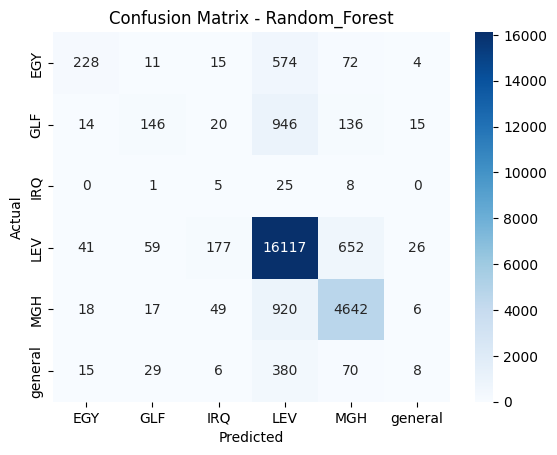

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 80.52%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8052412384095552
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.43      0.57       904
           1       0.74      0.28      0.41      1277
           2       0.08      0.33      0.12        39
           3       0.79      0.98      0.88     17072
           4       0.94      0.52      0.67      5652
           5       0.47      0.01      0.03       508

    accuracy                           0.81     25452
   macro avg       0.64      0.43      0.45     25452
weighted avg       0.82      0.81      0.78     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 184.45 seconds
Accuracy: 0.8052412384095552
Precision: 0.8166
Recall for : 0.8052
F1 Score:  0.7789
AUC Score: 0.9213
Balanced Accuracy: 0.4271
G-mean Score: 0.7206
pf Score: 0.0916
Bal Score :  0.8478013077640152


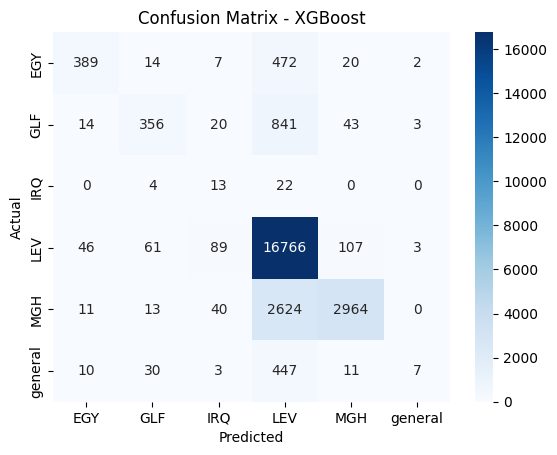

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 79.70%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.796990413327047
Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.30      0.35       904
           1       0.32      0.23      0.26      1277
           2       0.04      0.33      0.07        39
           3       0.86      0.89      0.88     17072
           4       0.78      0.79      0.79      5652
           5       0.11      0.05      0.07       508

    accuracy                           0.80     25452
   macro avg       0.42      0.43      0.40     25452
weighted avg       0.79      0.80      0.79     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 43.85 seconds
Accuracy: 0.796990413327047
Precision: 0.7853
Recall for : 0.7970
F1 Score:  0.7897
AUC Score: 0.8068
Balanced Accuracy: 0.4314
G-mean Score: 0.7921
pf Score: 0.0693
Bal Score :  0.8483193479816105


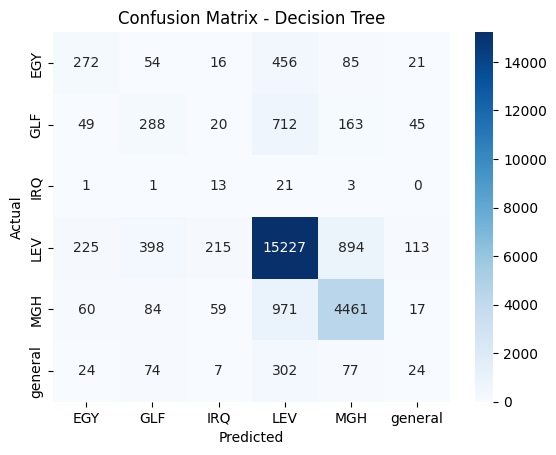

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 19.85%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.19845198805594846
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.01      0.02       904
           1       0.38      0.02      0.04      1277
           2       0.00      0.90      0.00        39
           3       0.75      0.11      0.19     17072
           4       0.64      0.56      0.60      5652
           5       0.60      0.01      0.01       508

    accuracy                           0.20     25452
   macro avg       0.54      0.27      0.14     25452
weighted avg       0.71      0.20      0.26     25452



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.19845198805594846
Precision: 0.7057
Recall for : 0.1985
F1 Score:  0.2607
AUC Score: 0.5985
Balanced Accuracy: 0.2661
G-mean Score: 0.4295
pf Score: 0.1454
Bal Score :  0.42397534015078375


## LightGBM Model - 82.98%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 8.832015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256676
[LightGBM] [Info] Number of data points in the train set: 169555, number of used features: 4995
[LightGBM] [Info] Start training from score -3.828364
[LightGBM] [Info] Start training from score -3.453840
[LightGBM] [Info] Start training from score -0.914803
[LightGBM] [Info] Start training from score -0.915053
[LightGBM] [Info] Start training from score -2.009668
[LightGBM] [Info] Start training from score -4.464835


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8297972654408298
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.50      0.61       904
           1       0.72      0.35      0.47      1277
           2       0.05      0.36      0.09        39
           3       0.83      0.97      0.89     17072
           4       0.94      0.64      0.76      5652
           5       0.38      0.04      0.08       508

    accuracy                           0.83     25452
   macro avg       0.62      0.48      0.48     25452
weighted avg       0.83      0.83      0.81     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 99.62 seconds
Accuracy: 0.8297972654408298
Precision: 0.8338
Recall for : 0.8298
F1 Score:  0.8143
AUC Score: 0.9430
Balanced Accuracy: 0.4767
G-mean Score: 0.7718
pf Score: 0.0754
Bal Score :  0.8683721392230089


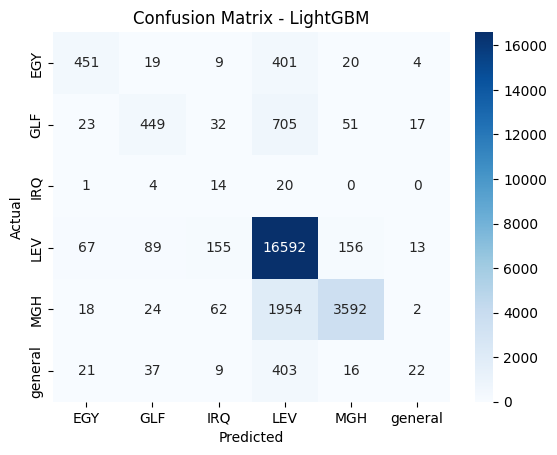

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 83.65%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8365157944365865
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.46      0.58       904
           1       0.70      0.40      0.51      1277
           2       0.01      0.46      0.02        39
           3       0.90      0.94      0.92     17072
           4       0.90      0.75      0.82      5652
           5       0.50      0.01      0.02       508

    accuracy                           0.84     25452
   macro avg       0.63      0.51      0.48     25452
weighted avg       0.88      0.84      0.85     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 12.36 seconds
Accuracy: 0.8365157944365865
Precision: 0.8781
Recall for : 0.8365
F1 Score:  0.8470
AUC Score: 0.9606
Balanced Accuracy: 0.5052
G-mean Score: 0.8452
pf Score: 0.0516
Bal Score :  0.8787776901625177


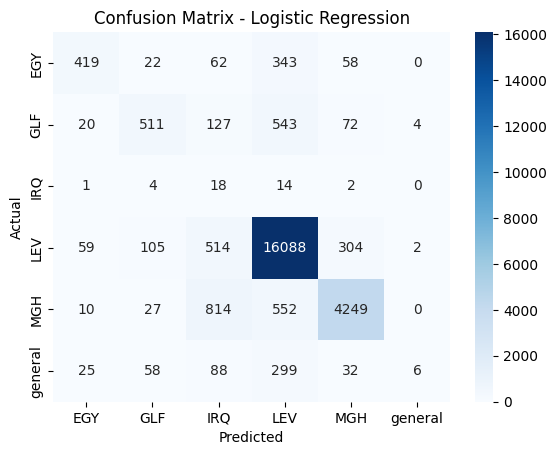

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 82.35%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8234716328775735
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.52      0.52       904
           1       0.51      0.52      0.51      1277
           2       0.02      0.33      0.04        39
           3       0.96      0.84      0.90     17072
           4       0.72      0.96      0.82      5652
           5       0.15      0.07      0.10       508

    accuracy                           0.82     25452
   macro avg       0.48      0.54      0.48     25452
weighted avg       0.85      0.82      0.83     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.08 seconds
Accuracy: 0.8234716328775735
Precision: 0.8522
Recall for : 0.8235
F1 Score:  0.8310
AUC Score: 0.9551
Balanced Accuracy: 0.5394
G-mean Score: 0.8738
pf Score: 0.0416
Bal Score :  0.8717627073521417


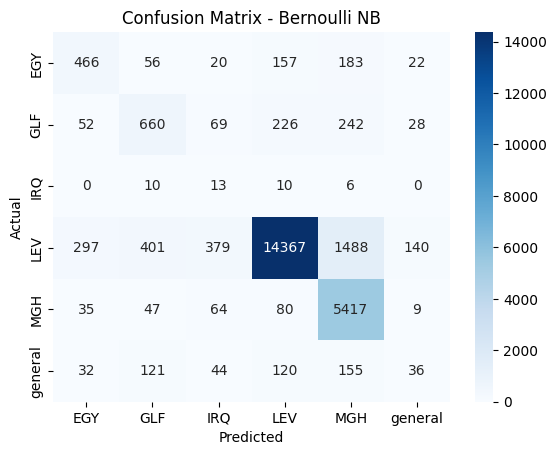

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

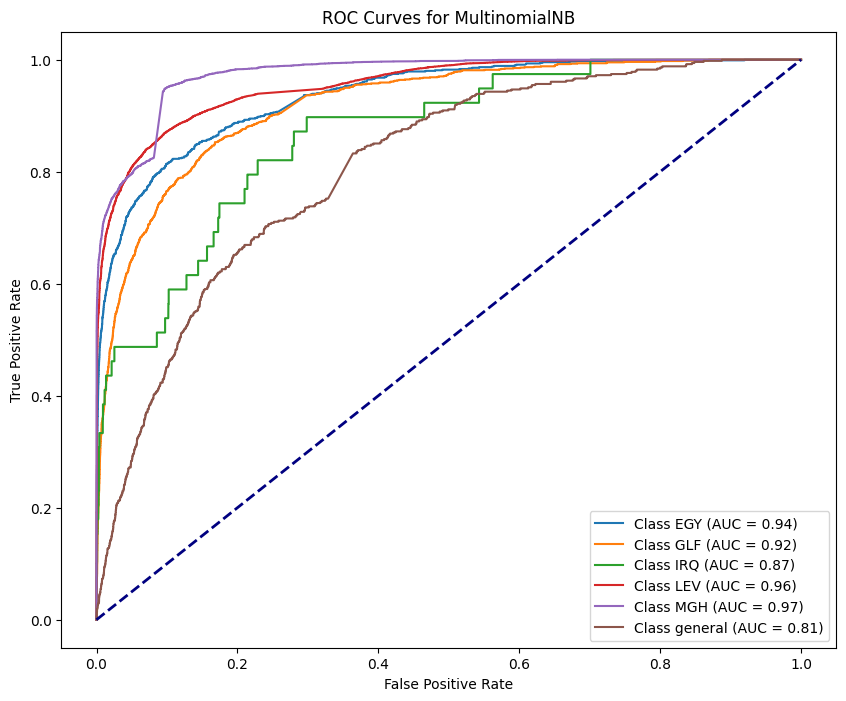

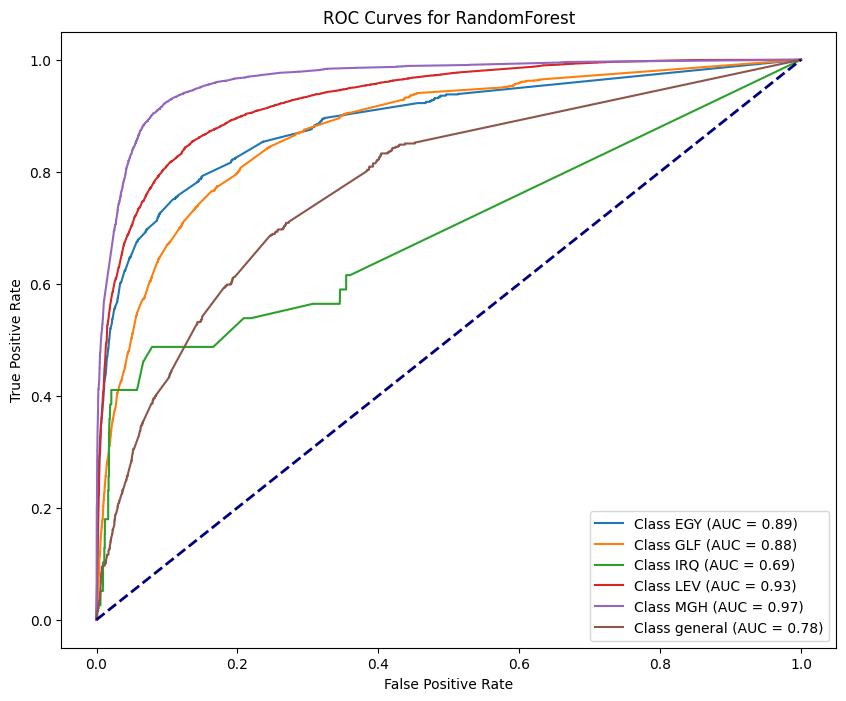

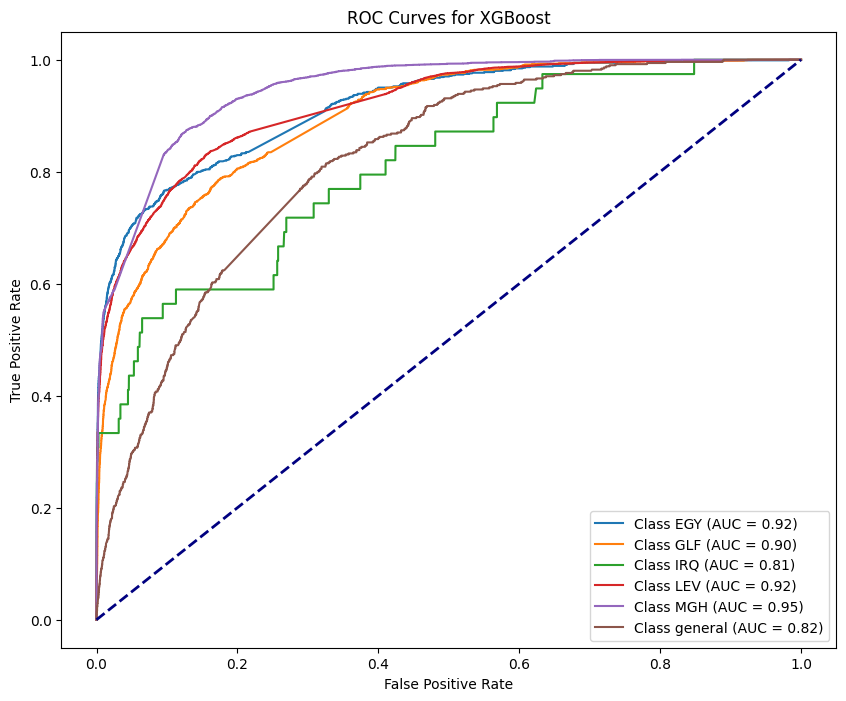

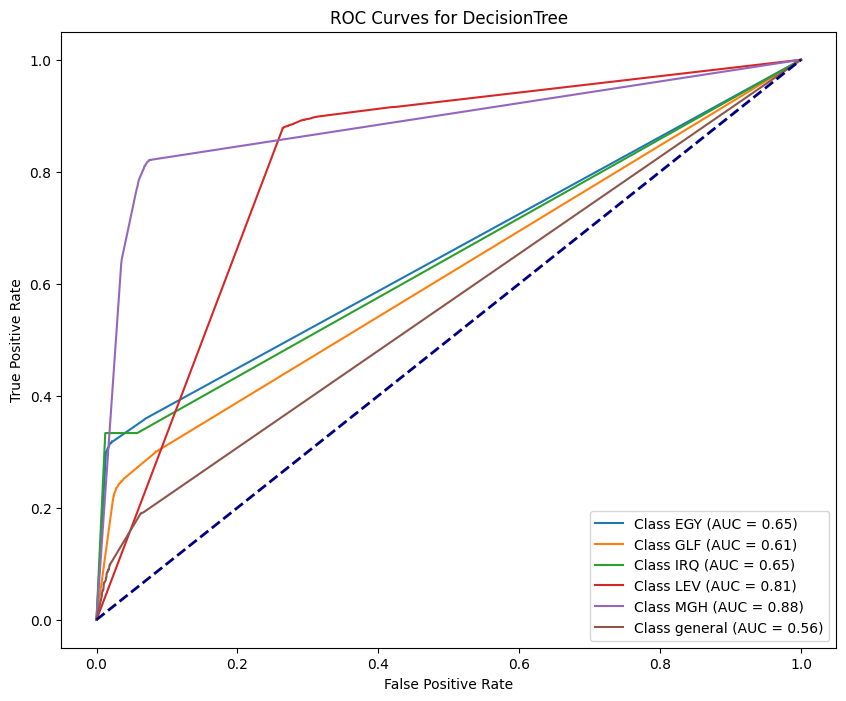

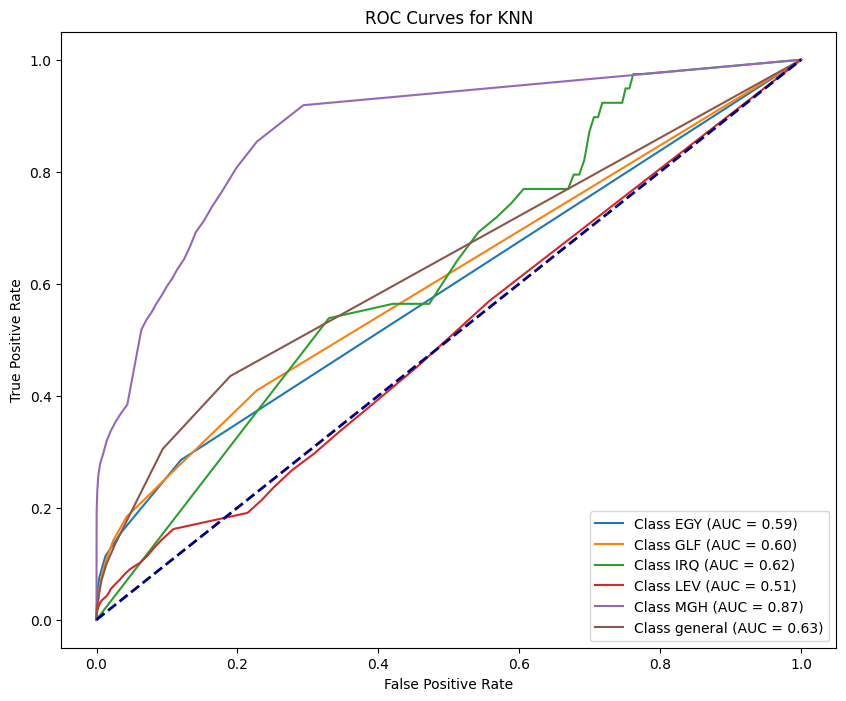

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


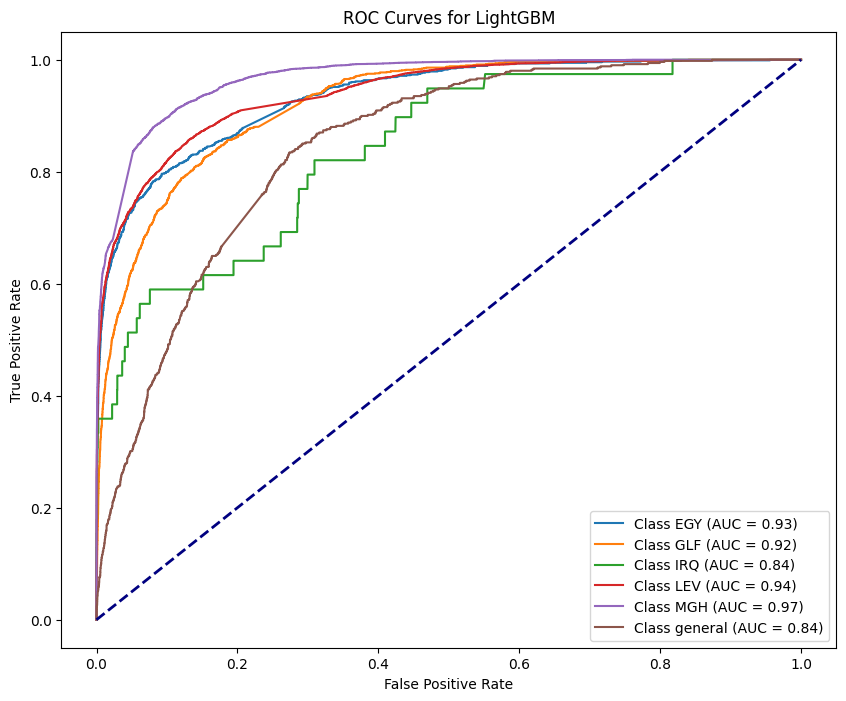

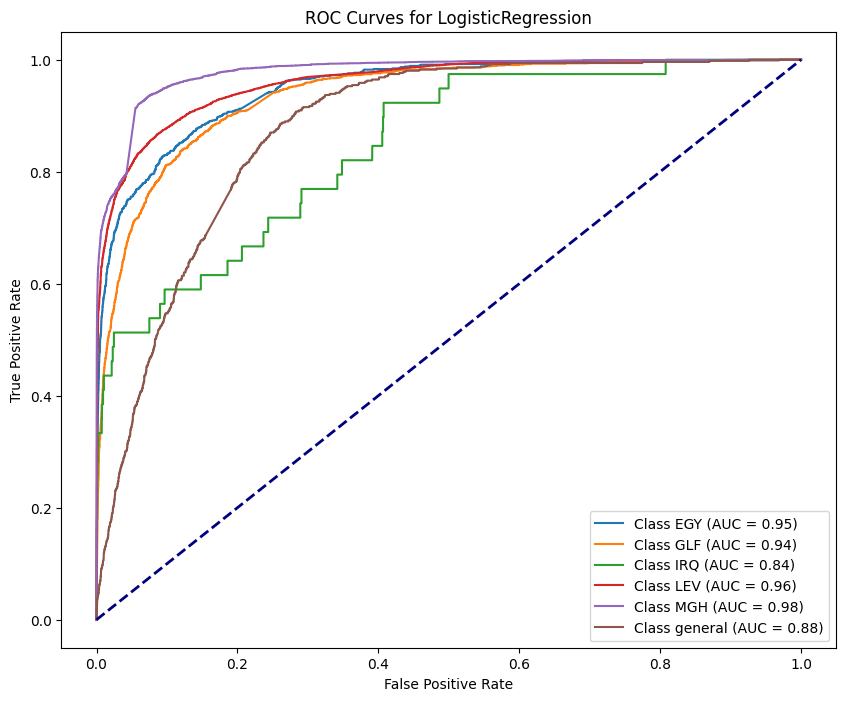

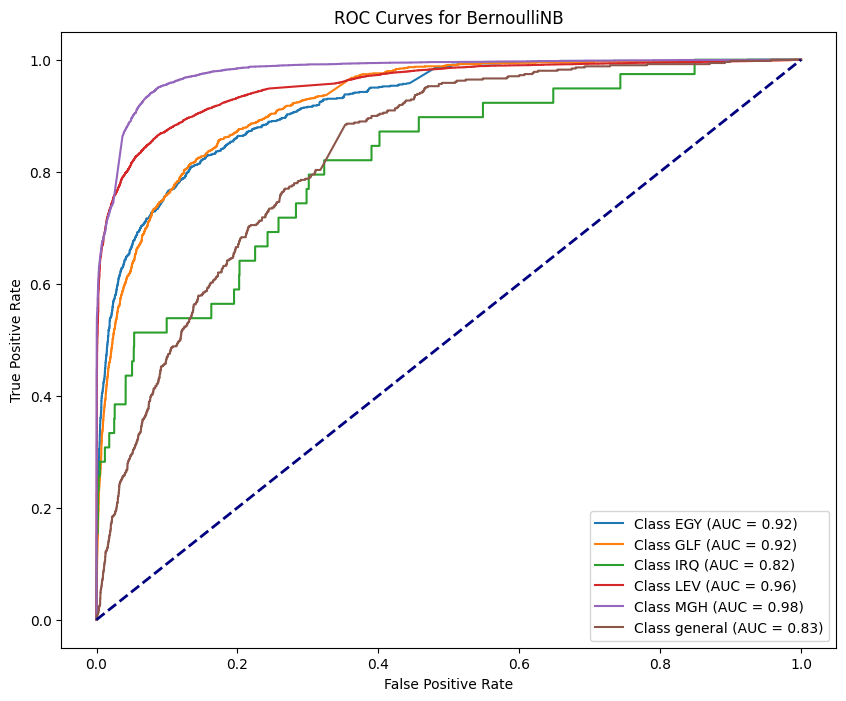

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


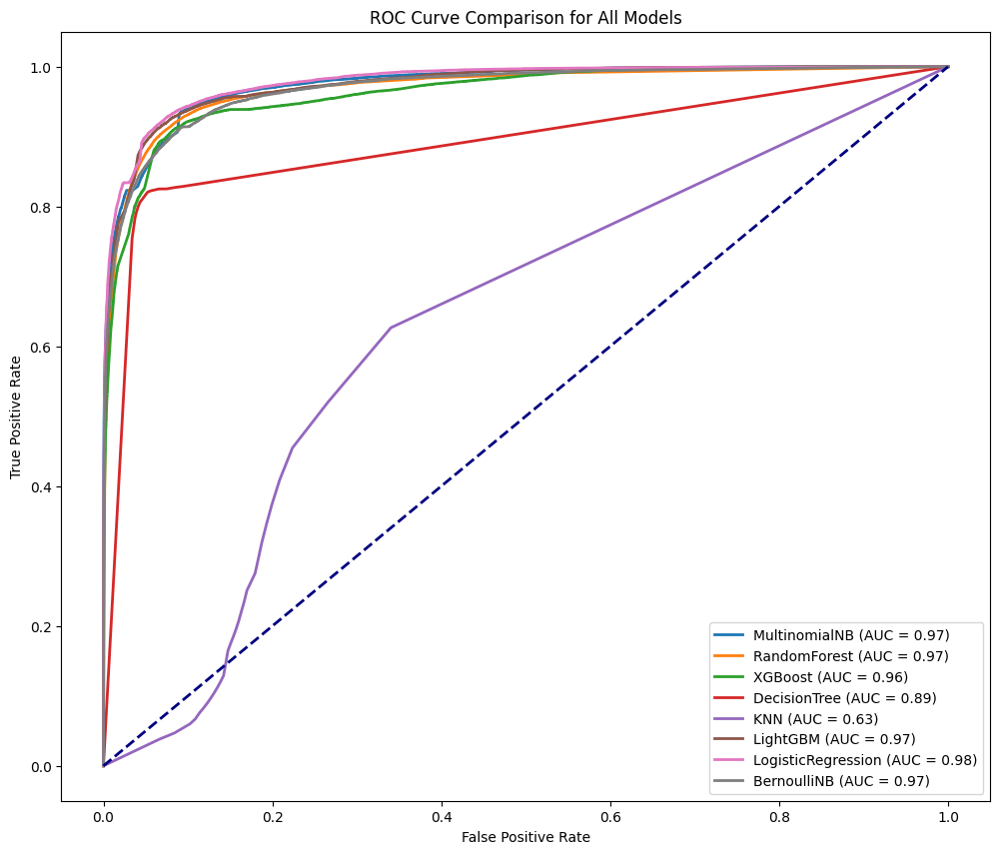

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **RUS**

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

X_train, y_train = rus.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-238-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-238-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


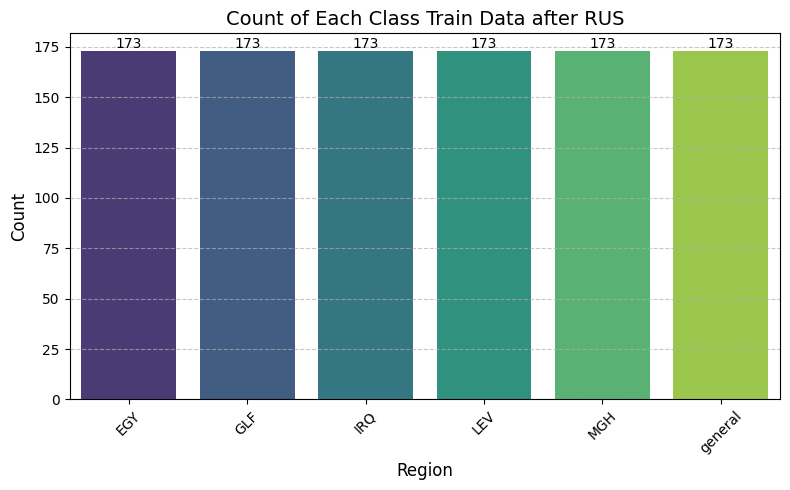

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after RUS")

## Multinomial NB- 49.65%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.4965425113939965
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.74      0.25       904
           1       0.16      0.48      0.24      1277
           2       0.01      0.59      0.02        39
           3       0.95      0.48      0.64     17072
           4       0.78      0.54      0.64      5652
           5       0.05      0.21      0.08       508

    accuracy                           0.50     25452
   macro avg       0.35      0.51      0.31     25452
weighted avg       0.83      0.50      0.59     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.4965425113939965
Precision: 0.8262
Recall for : 0.4965
F1 Score:  0.5918
AUC Score: 0.8344
Balanced Accuracy: 0.5063
G-mean Score: 0.6846
pf Score: 0.0932
Bal Score :  0.6379474185575178


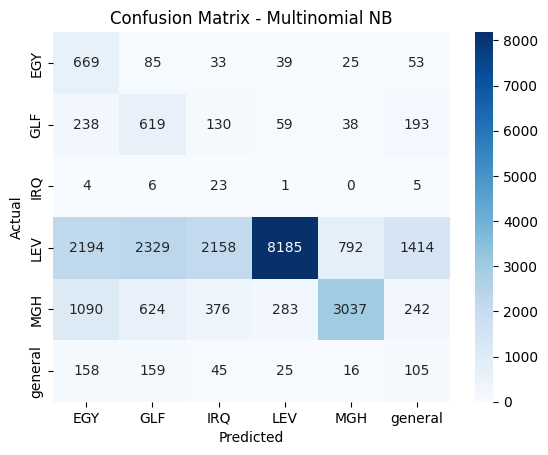

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -48.35%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4834983498349835
Classification Report:
               precision    recall  f1-score   support

           0       0.34      0.48      0.40       904
           1       0.18      0.30      0.23      1277
           2       0.01      0.44      0.03        39
           3       0.95      0.40      0.56     17072
           4       0.45      0.79      0.57      5652
           5       0.05      0.33      0.08       508

    accuracy                           0.48     25452
   macro avg       0.33      0.46      0.31     25452
weighted avg       0.76      0.48      0.53     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.59 seconds
Accuracy: 0.4834983498349835
Precision: 0.7604
Recall for : 0.4835
F1 Score:  0.5334
AUC Score: 0.8084
Balanced Accuracy: 0.4570
G-mean Score: 0.6610
pf Score: 0.1021
Bal Score :  0.6277048420123947


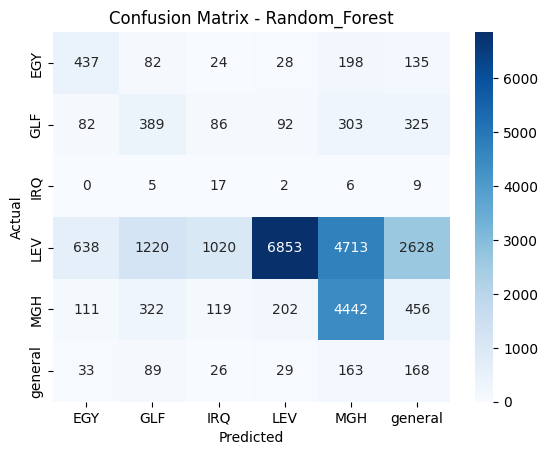

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 48.03%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.48027659908848025
Classification Report:
               precision    recall  f1-score   support

           0       0.21      0.49      0.30       904
           1       0.17      0.35      0.23      1277
           2       0.01      0.38      0.02        39
           3       0.94      0.41      0.57     17072
           4       0.48      0.73      0.58      5652
           5       0.04      0.25      0.07       508

    accuracy                           0.48     25452
   macro avg       0.31      0.44      0.29     25452
weighted avg       0.75      0.48      0.54     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 5.00 seconds
Accuracy: 0.48027659908848025
Precision: 0.7516
Recall for : 0.4803
F1 Score:  0.5369
AUC Score: 0.7540
Balanced Accuracy: 0.4355
G-mean Score: 0.6583
pf Score: 0.1029
Bal Score :  0.625364275349259


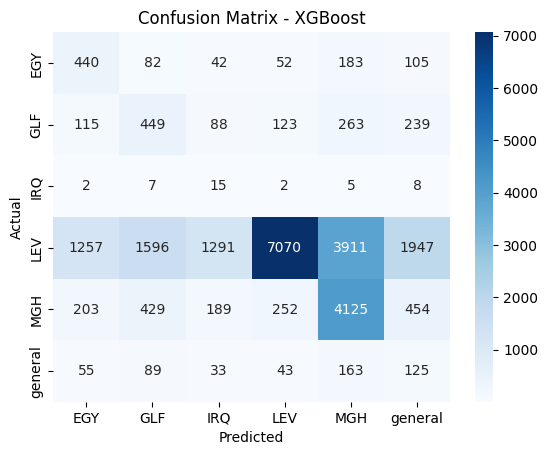

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 43.39%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4339148200534339
Classification Report:
               precision    recall  f1-score   support

           0       0.18      0.43      0.25       904
           1       0.12      0.28      0.17      1277
           2       0.01      0.41      0.02        39
           3       0.90      0.37      0.53     17072
           4       0.44      0.67      0.53      5652
           5       0.05      0.23      0.08       508

    accuracy                           0.43     25452
   macro avg       0.28      0.40      0.26     25452
weighted avg       0.71      0.43      0.49     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.13 seconds
Accuracy: 0.4339148200534339
Precision: 0.7139
Recall for : 0.4339
F1 Score:  0.4900
AUC Score: 0.6420
Balanced Accuracy: 0.4003
G-mean Score: 0.6173
pf Score: 0.1146
Bal Score :  0.5915927811951164


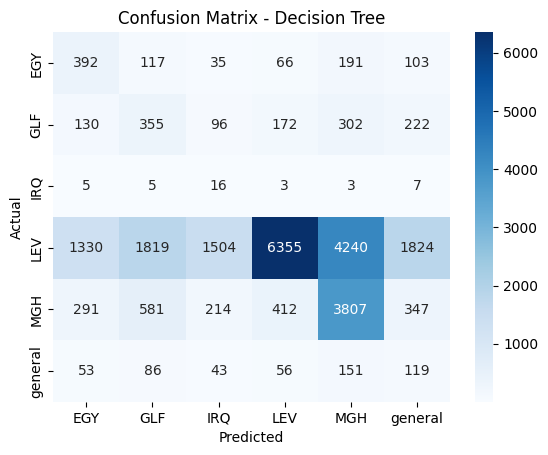

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 22.09%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.22092566399497093
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       904
           1       0.00      0.00      0.00      1277
           2       0.00      0.00      0.00        39
           3       0.00      0.00      0.00     17072
           4       0.22      0.99      0.36      5652
           5       0.05      0.02      0.03       508

    accuracy                           0.22     25452
   macro avg       0.05      0.17      0.07     25452
weighted avg       0.05      0.22      0.08     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.22092566399497093
Precision: 0.0504
Recall for : 0.2209
F1 Score:  0.0812
AUC Score: 0.4672
Balanced Accuracy: 0.1688
G-mean Score: 0.4150
pf Score: 0.1666
Bal Score :  0.4366612374989588


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## LightGBM Model -33.95%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 1038, number of used features: 38
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.33954109696683954
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.38      0.21       904
           1       0.10      0.24      0.14      1277
           2       0.01      0.44      0.02        39
           3       0.83      0.24      0.37     17072
           4       0.35      0.67      0.46      5652
           5       0.04      0.22      0.07       508

    accuracy                           0.34     25452
   macro avg       0.25      0.36      0.21     25452
weighted avg       0.64      0.34      0.37     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 0.44 seconds
Accuracy: 0.33954109696683954
Precision: 0.6426
Recall for : 0.3395
F1 Score:  0.3666
AUC Score: 0.6024
Balanced Accuracy: 0.3646
G-mean Score: 0.5345
pf Score: 0.1365
Bal Score :  0.5231137252247866


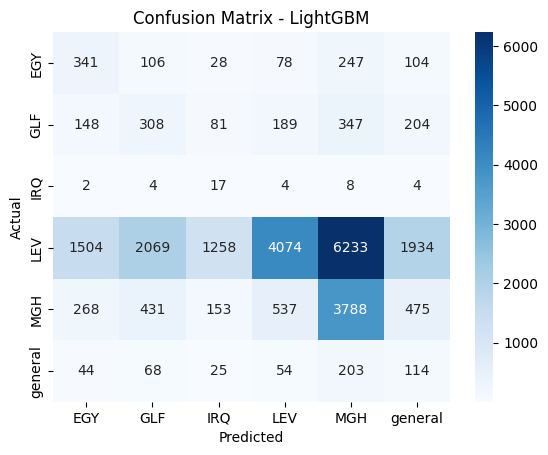

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 57.54%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5753575357535754
Classification Report:
               precision    recall  f1-score   support

           0       0.28      0.61      0.39       904
           1       0.21      0.42      0.28      1277
           2       0.02      0.46      0.03        39
           3       0.95      0.53      0.68     17072
           4       0.59      0.77      0.66      5652
           5       0.05      0.31      0.09       508

    accuracy                           0.58     25452
   macro avg       0.35      0.52      0.36     25452
weighted avg       0.79      0.58      0.63     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.39 seconds
Accuracy: 0.5753575357535754
Precision: 0.7881
Recall for : 0.5754
F1 Score:  0.6332
AUC Score: 0.8300
Balanced Accuracy: 0.5151
G-mean Score: 0.7267
pf Score: 0.0844
Bal Score :  0.6938529074137129


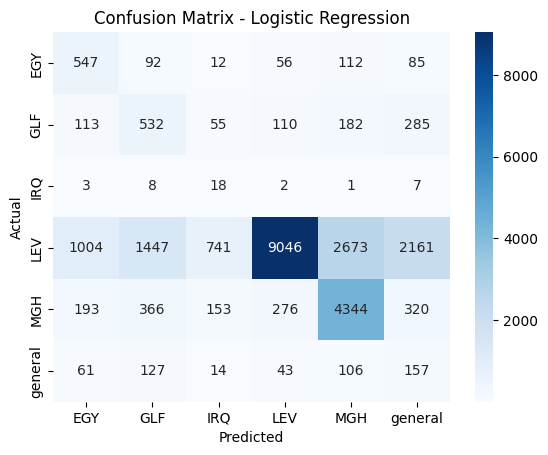

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 41.47%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.4146628948609147
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.33      0.41       904
           1       0.30      0.25      0.27      1277
           2       0.01      0.64      0.02        39
           3       0.99      0.27      0.43     17072
           4       0.46      0.88      0.60      5652
           5       0.04      0.47      0.08       508

    accuracy                           0.41     25452
   macro avg       0.39      0.47      0.30     25452
weighted avg       0.80      0.41      0.45     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.4146628948609147
Precision: 0.8030
Recall for : 0.4147
F1 Score:  0.4519
AUC Score: 0.8695
Balanced Accuracy: 0.4749
G-mean Score: 0.6192
pf Score: 0.1101
Bal Score :  0.5788449944298963


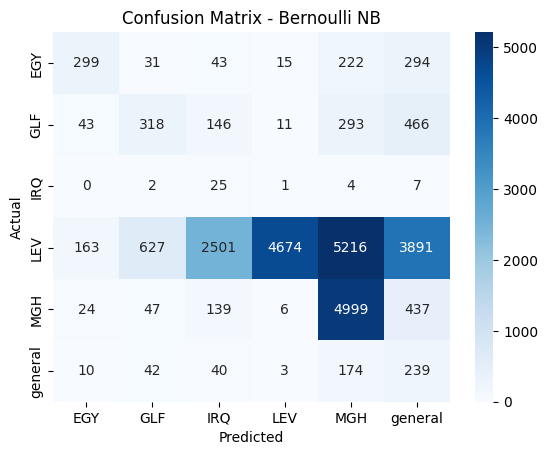

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

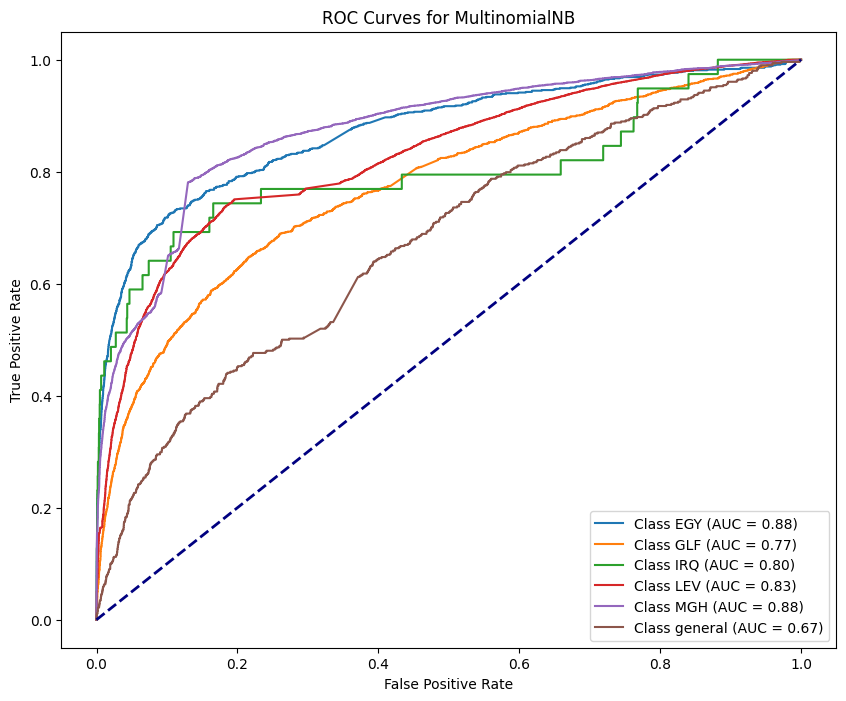

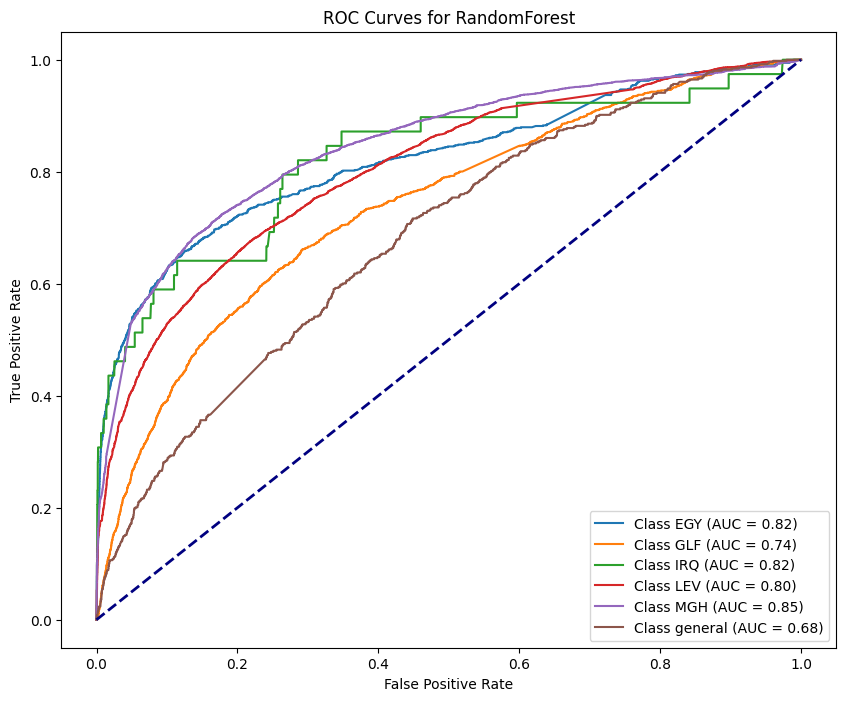

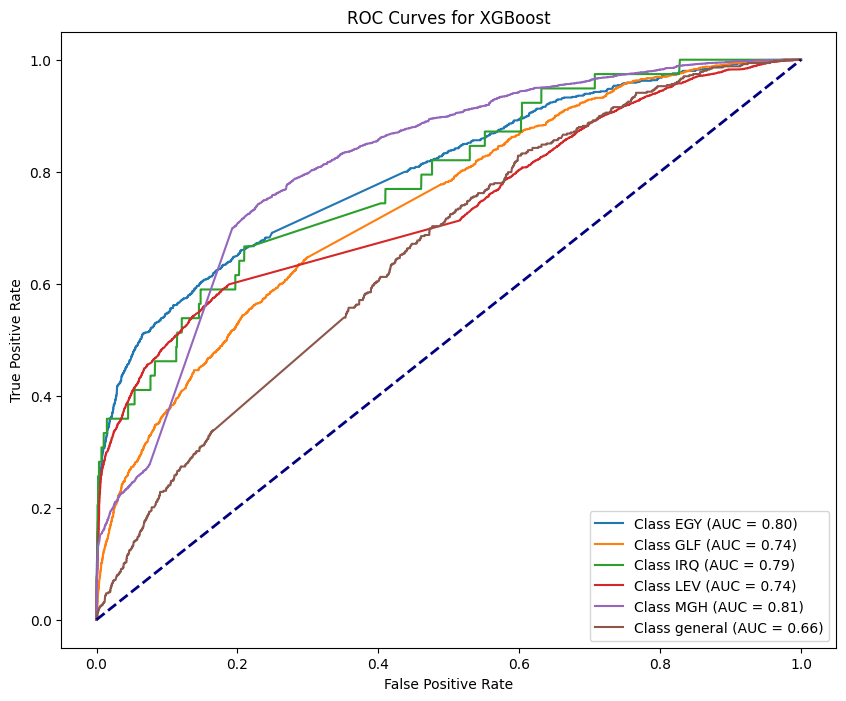

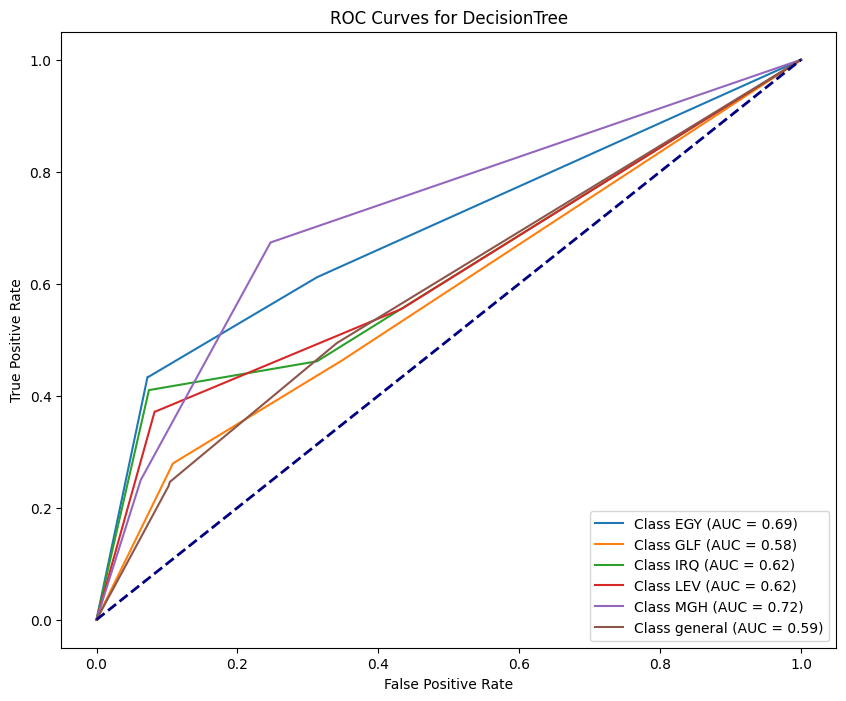

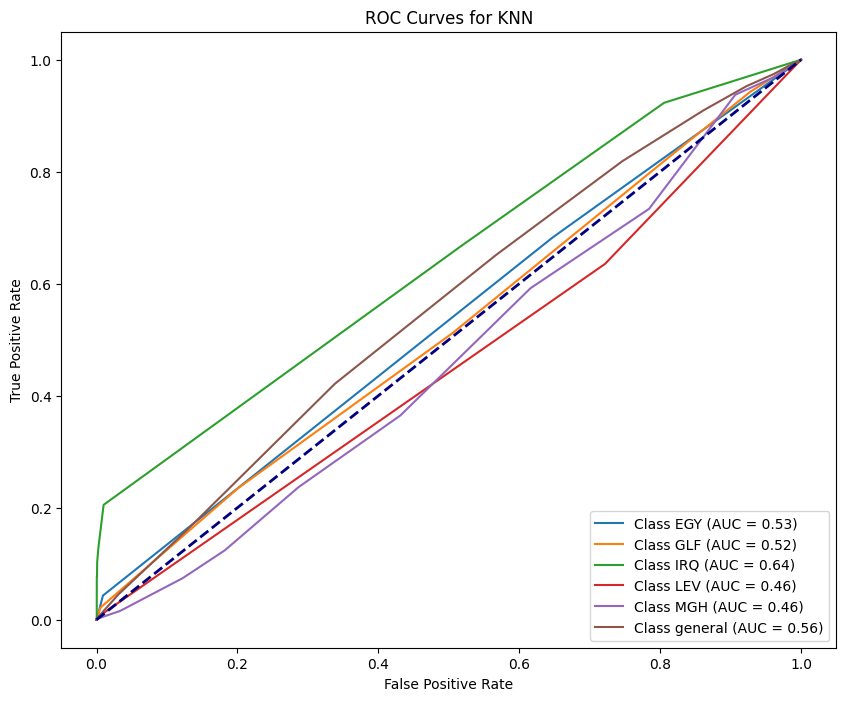

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


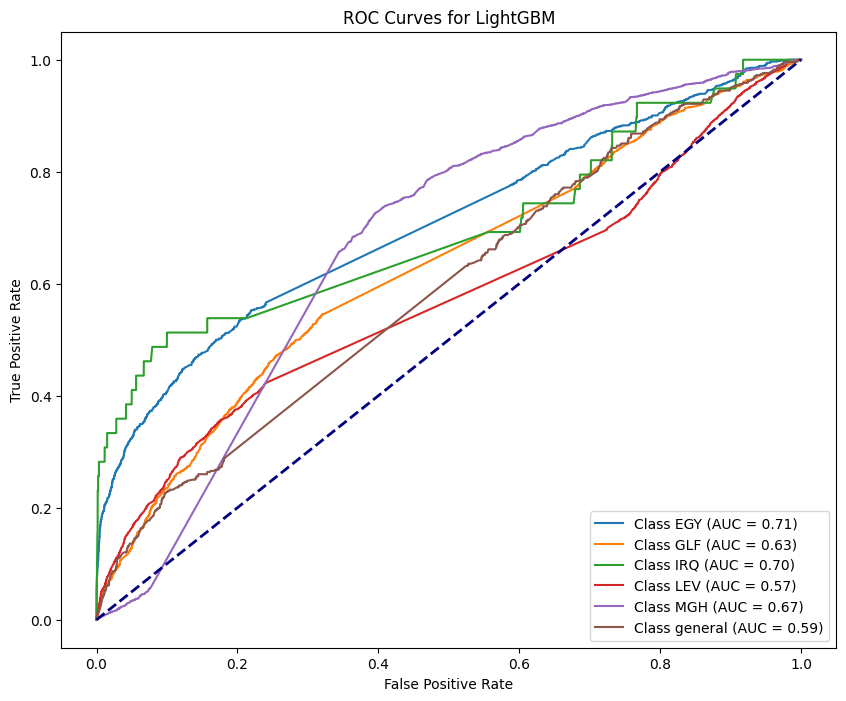

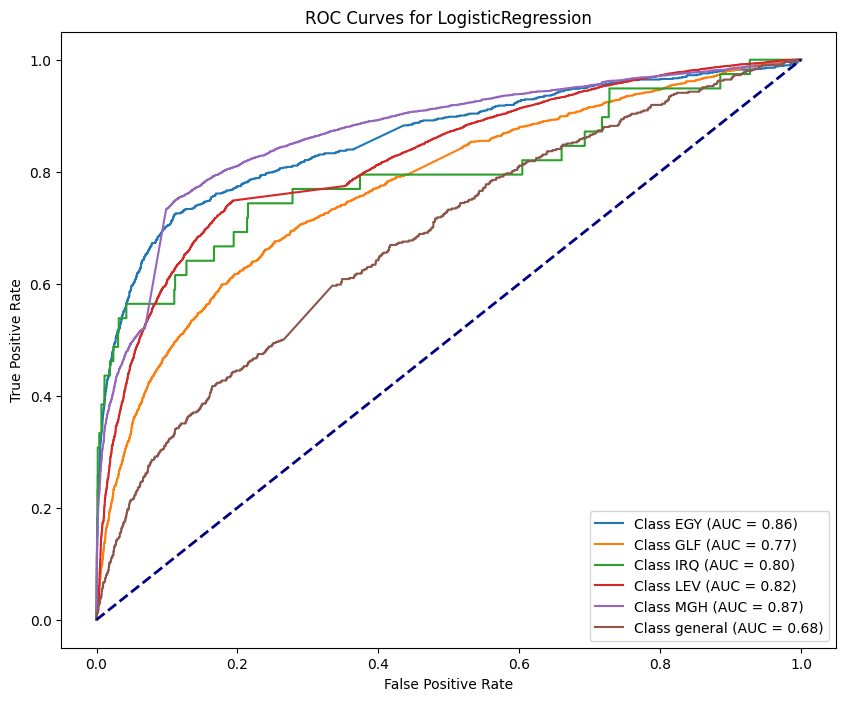

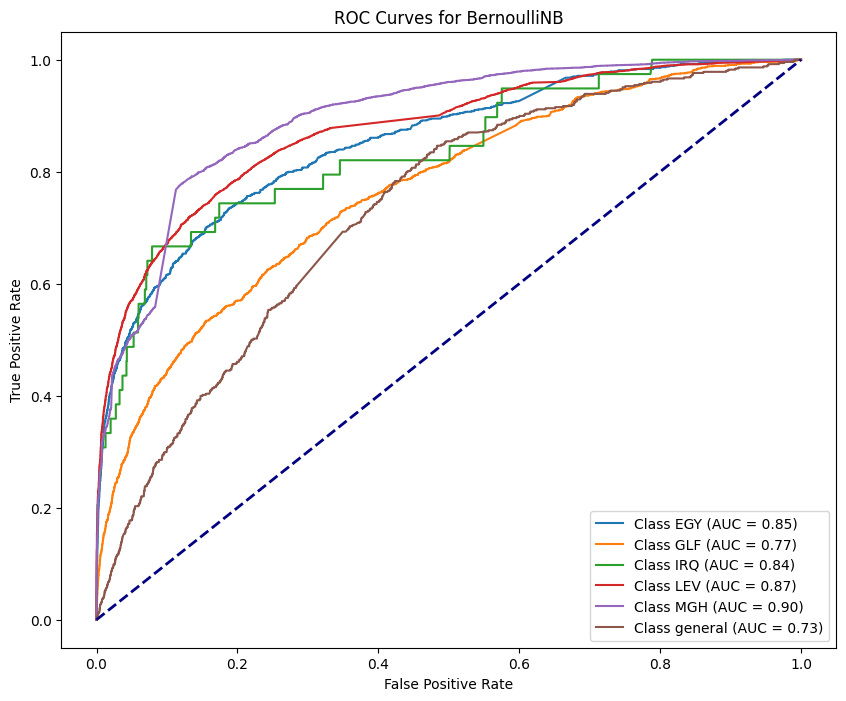

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


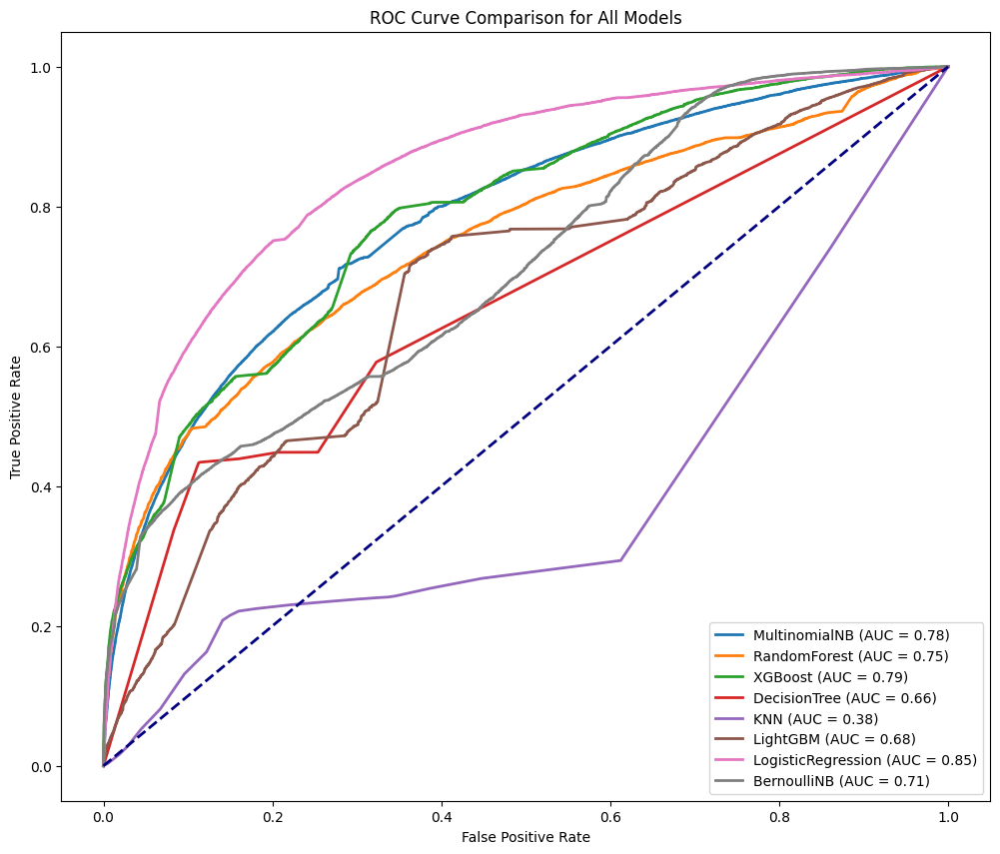

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **TomekLinks**

In [ ]:
from imblearn.under_sampling import TomekLinks

tl = TomekLinks(sampling_strategy='majority')
X_train, y_train = tl.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-286-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-286-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


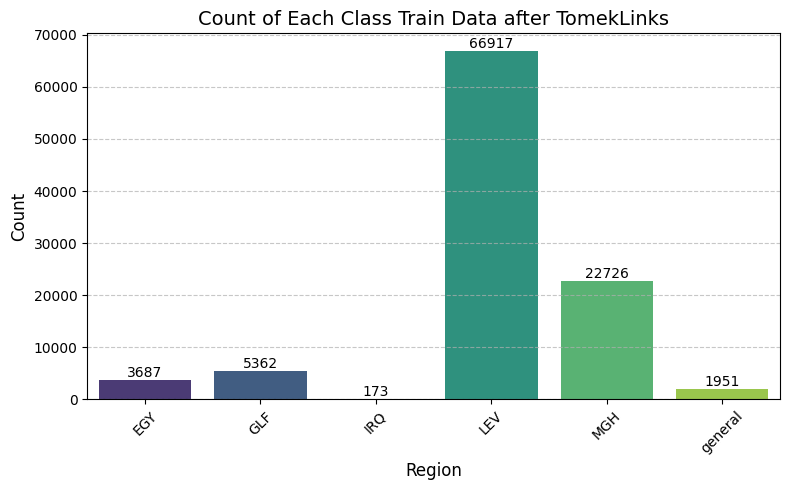

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after TomekLinks")

## Multinomial NB- 85.37%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8536853685368537
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.42      0.56       904
           1       0.68      0.36      0.47      1277
           2       0.00      0.00      0.00        39
           3       0.84      0.98      0.91     17072
           4       0.92      0.74      0.82      5652
           5       0.00      0.00      0.00       508

    accuracy                           0.85     25452
   macro avg       0.55      0.42      0.46     25452
weighted avg       0.83      0.85      0.83     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8536853685368537
Precision: 0.8348
Recall for : 0.8537
F1 Score:  0.8340
AUC Score: 0.9581
Balanced Accuracy: 0.4171
G-mean Score: 0.8000
pf Score: 0.0661
Bal Score :  0.886473697886035


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


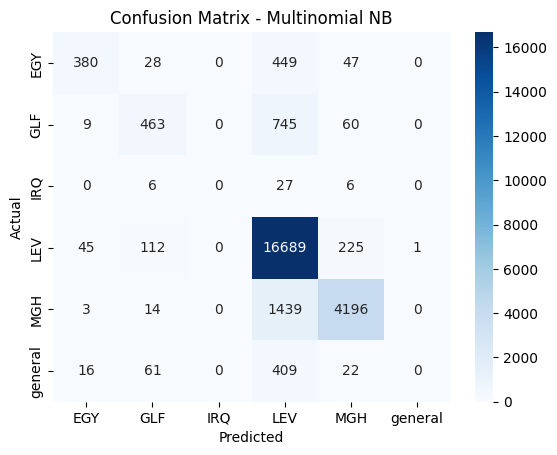

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -84.38%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8437843784378438
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.34      0.47       904
           1       0.60      0.17      0.26      1277
           2       0.25      0.03      0.05        39
           3       0.86      0.95      0.90     17072
           4       0.82      0.84      0.83      5652
           5       0.11      0.02      0.03       508

    accuracy                           0.84     25452
   macro avg       0.56      0.39      0.42     25452
weighted avg       0.82      0.84      0.82     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 249.05 seconds
Accuracy: 0.8437843784378438
Precision: 0.8186
Recall for : 0.8438
F1 Score:  0.8202
AUC Score: 0.9384
Balanced Accuracy: 0.3904
G-mean Score: 0.8099
pf Score: 0.0632
Bal Score :  0.88085417125011


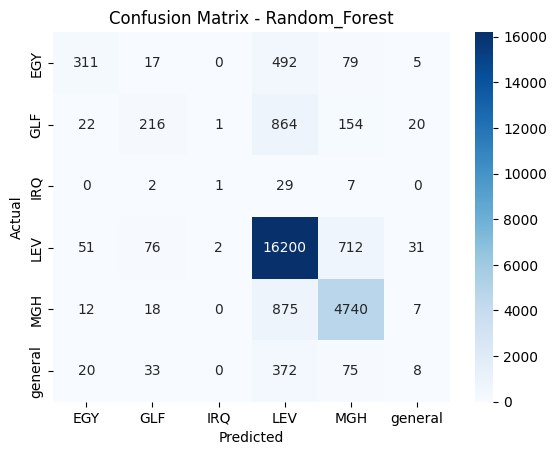

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 80.79%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8078736445073079
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.43      0.57       904
           1       0.76      0.28      0.40      1277
           2       0.25      0.05      0.09        39
           3       0.79      0.99      0.88     17072
           4       0.95      0.52      0.67      5652
           5       0.47      0.02      0.03       508

    accuracy                           0.81     25452
   macro avg       0.67      0.38      0.44     25452
weighted avg       0.82      0.81      0.78     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 142.97 seconds
Accuracy: 0.8078736445073079
Precision: 0.8165
Recall for : 0.8079
F1 Score:  0.7787
AUC Score: 0.9260
Balanced Accuracy: 0.3802
G-mean Score: 0.7170
pf Score: 0.0926
Bal Score :  0.8491765007459396


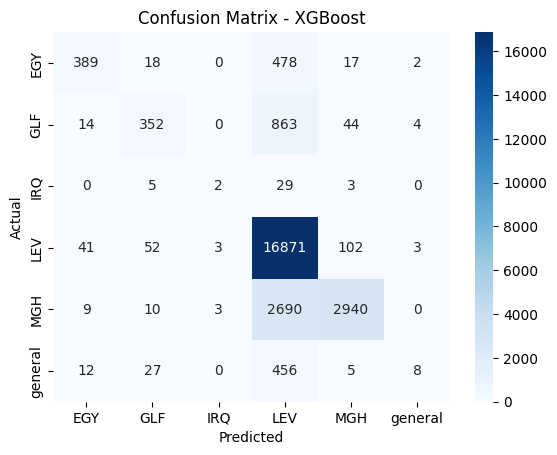

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 80.92%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8092094923778093
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.37      0.41       904
           1       0.34      0.24      0.28      1277
           2       0.14      0.05      0.08        39
           3       0.87      0.90      0.88     17072
           4       0.78      0.80      0.79      5652
           5       0.10      0.05      0.07       508

    accuracy                           0.81     25452
   macro avg       0.45      0.40      0.42     25452
weighted avg       0.79      0.81      0.80     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 31.43 seconds
Accuracy: 0.8092094923778093
Precision: 0.7901
Recall for : 0.8092
F1 Score:  0.7985
AUC Score: 0.8170
Balanced Accuracy: 0.4016
G-mean Score: 0.8015
pf Score: 0.0661
Bal Score :  0.8572120318406218


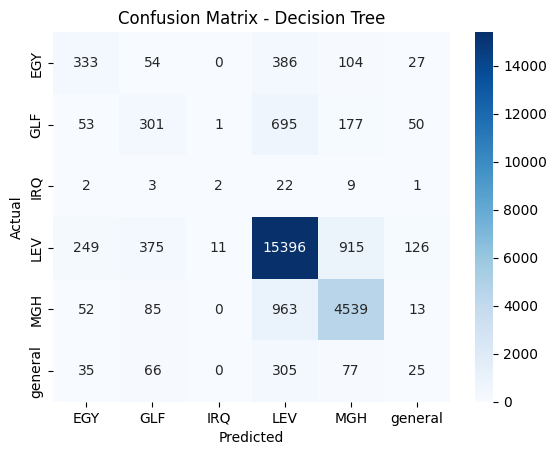

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 32.15%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.32146786107182146
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.01      0.03       904
           1       0.46      0.03      0.06      1277
           2       0.00      0.00      0.00        39
           3       0.78      0.17      0.28     17072
           4       0.24      0.92      0.38      5652
           5       1.00      0.01      0.01       508

    accuracy                           0.32     25452
   macro avg       0.56      0.19      0.13     25452
weighted avg       0.65      0.32      0.28     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.32146786107182146
Precision: 0.6477
Recall for : 0.3215
F1 Score:  0.2776
AUC Score: 0.6934
Balanced Accuracy: 0.1903
G-mean Score: 0.4906
pf Score: 0.1550
Bal Score :  0.5078520154107482


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## LightGBM Model -83.91%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 4.664965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 187856
[LightGBM] [Info] Number of data points in the train set: 100816, number of used features: 4995
[LightGBM] [Info] Start training from score -3.308484
[LightGBM] [Info] Start training from score -2.933960
[LightGBM] [Info] Start training from score -6.367761
[LightGBM] [Info] Start training from score -0.409844
[LightGBM] [Info] Start training from score -1.489787
[LightGBM] [Info] Start training from score -3.944955


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.8391089108910891
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.49      0.61       904
           1       0.75      0.37      0.49      1277
           2       0.36      0.13      0.19        39
           3       0.83      0.98      0.90     17072
           4       0.94      0.64      0.76      5652
           5       0.45      0.03      0.06       508

    accuracy                           0.84     25452
   macro avg       0.69      0.44      0.50     25452
weighted avg       0.84      0.84      0.82     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 64.03 seconds
Accuracy: 0.8391089108910891
Precision: 0.8371
Recall for : 0.8391
F1 Score:  0.8194
AUC Score: 0.9479
Balanced Accuracy: 0.4418
G-mean Score: 0.7732
pf Score: 0.0747
Bal Score :  0.8745541044428723


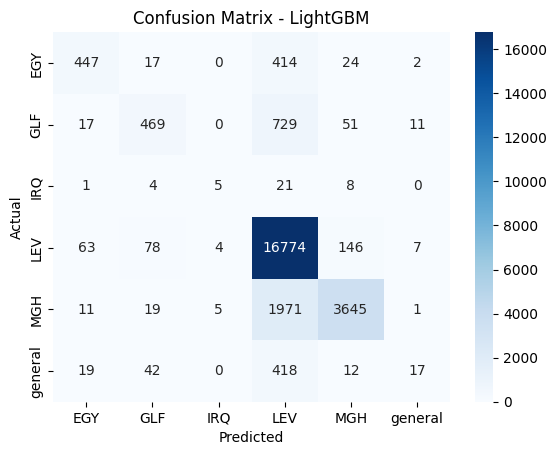

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 87.98%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8797736916548797
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.47      0.59       904
           1       0.71      0.42      0.53      1277
           2       1.00      0.05      0.10        39
           3       0.90      0.96      0.93     17072
           4       0.86      0.89      0.87      5652
           5       0.54      0.01      0.03       508

    accuracy                           0.88     25452
   macro avg       0.80      0.47      0.51     25452
weighted avg       0.87      0.88      0.86     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 7.46 seconds
Accuracy: 0.8797736916548797
Precision: 0.8681
Recall for : 0.8798
F1 Score:  0.8642
AUC Score: 0.9666
Balanced Accuracy: 0.4684
G-mean Score: 0.8591
pf Score: 0.0469
Bal Score :  0.9087551130858386


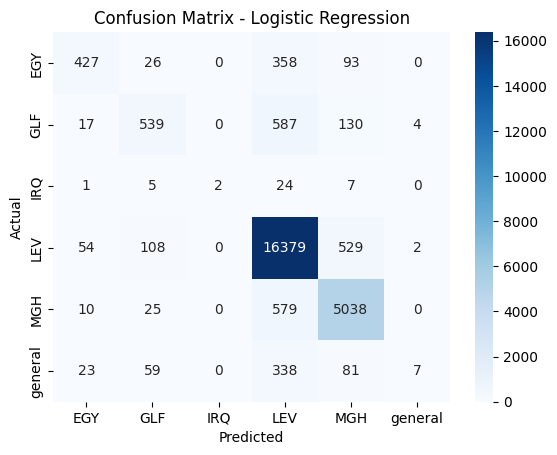

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 82.95%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8294829482948295
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.51      0.53       904
           1       0.50      0.53      0.51      1277
           2       0.00      0.00      0.00        39
           3       0.96      0.85      0.90     17072
           4       0.70      0.97      0.81      5652
           5       0.17      0.08      0.11       508

    accuracy                           0.83     25452
   macro avg       0.48      0.49      0.48     25452
weighted avg       0.85      0.83      0.83     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.05 seconds
Accuracy: 0.8294829482948295
Precision: 0.8461
Recall for : 0.8295
F1 Score:  0.8307
AUC Score: 0.9538
Balanced Accuracy: 0.4894
G-mean Score: 0.8738
pf Score: 0.0417
Bal Score :  0.8758796796006508


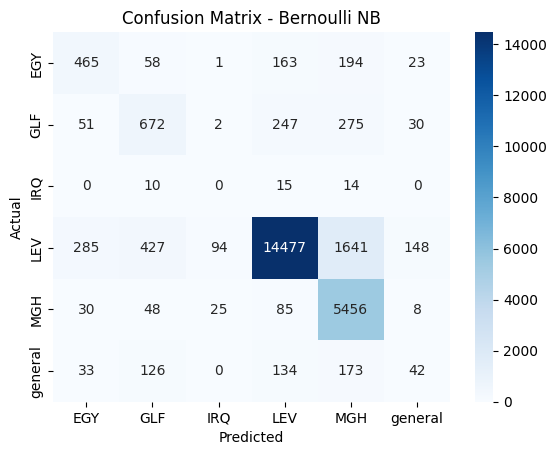

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

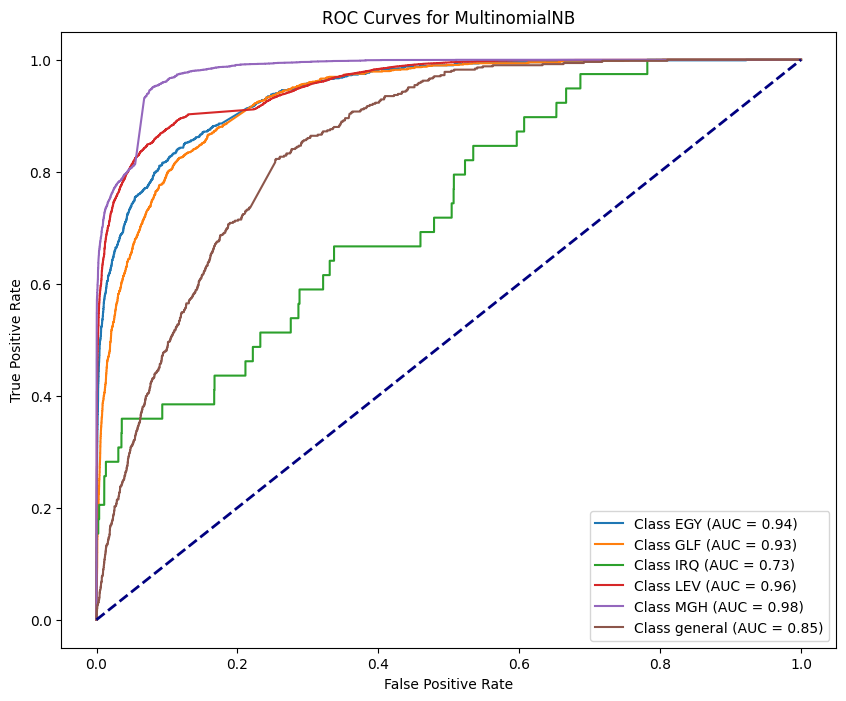

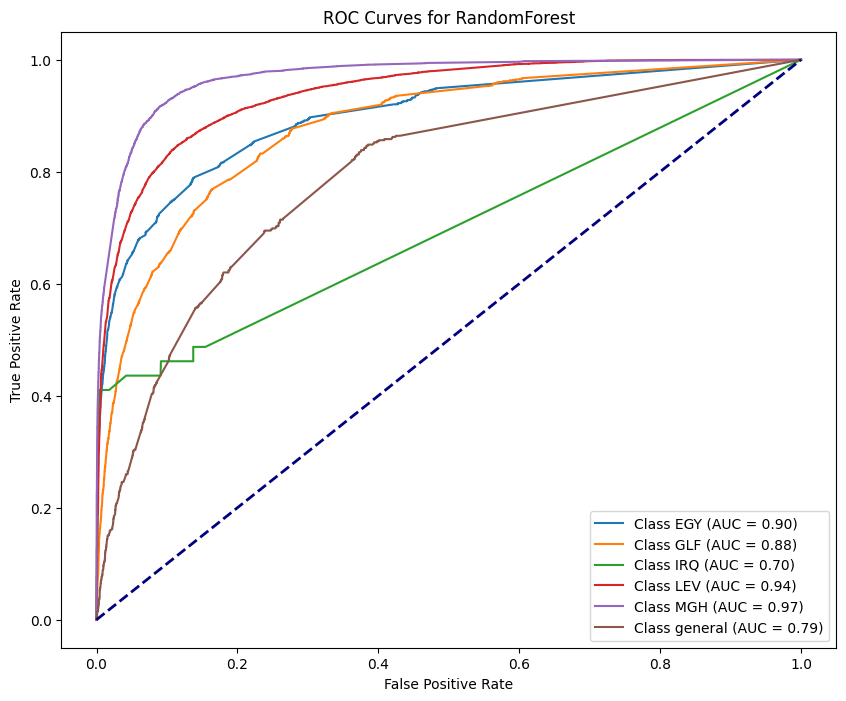

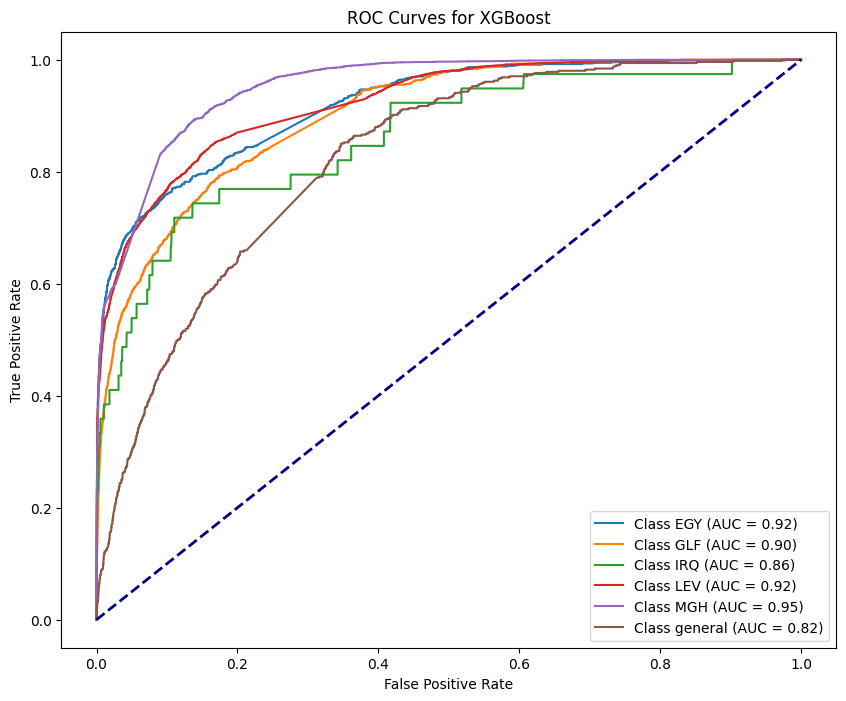

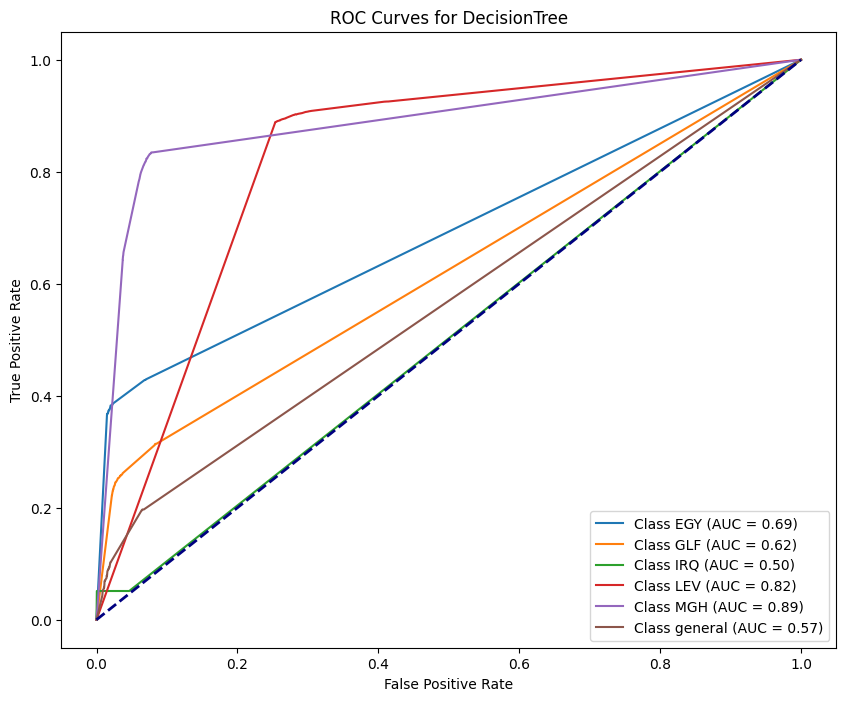

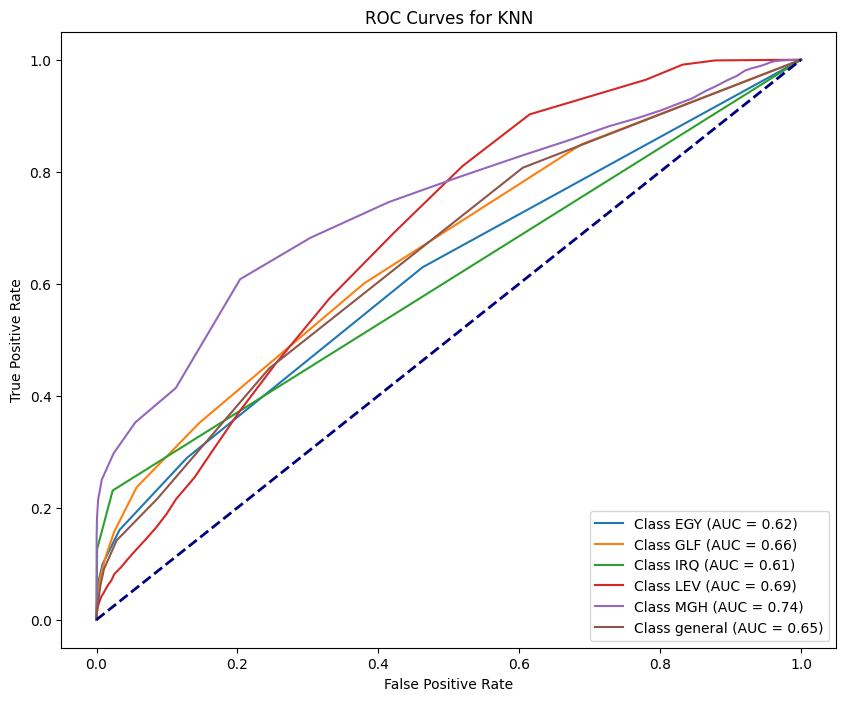

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


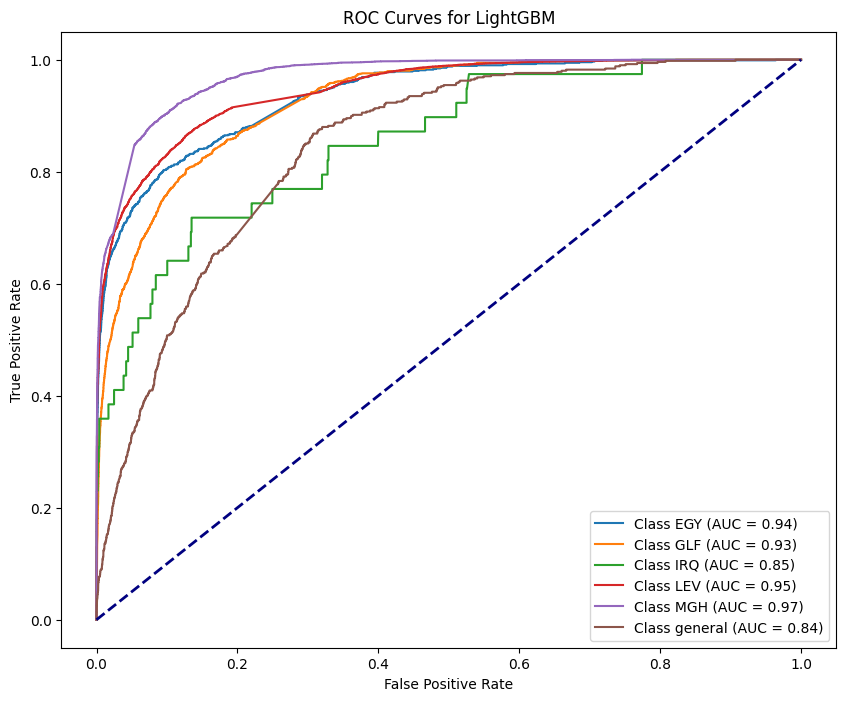

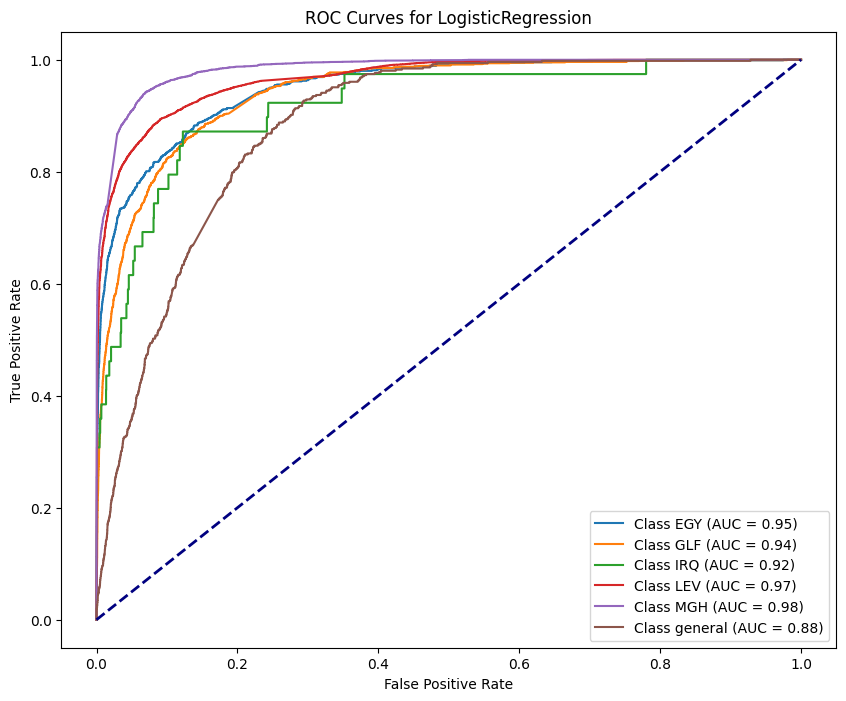

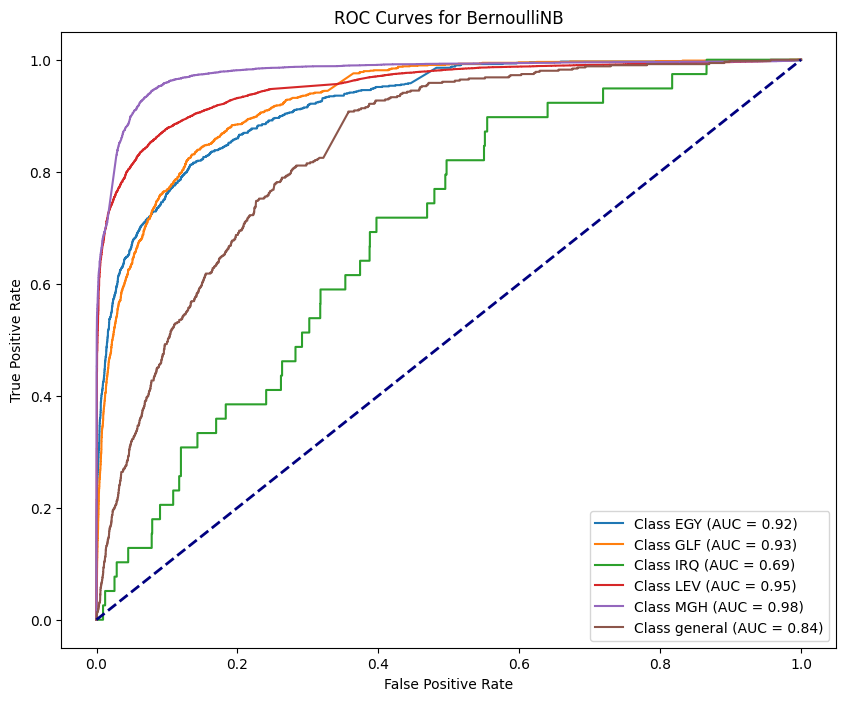

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


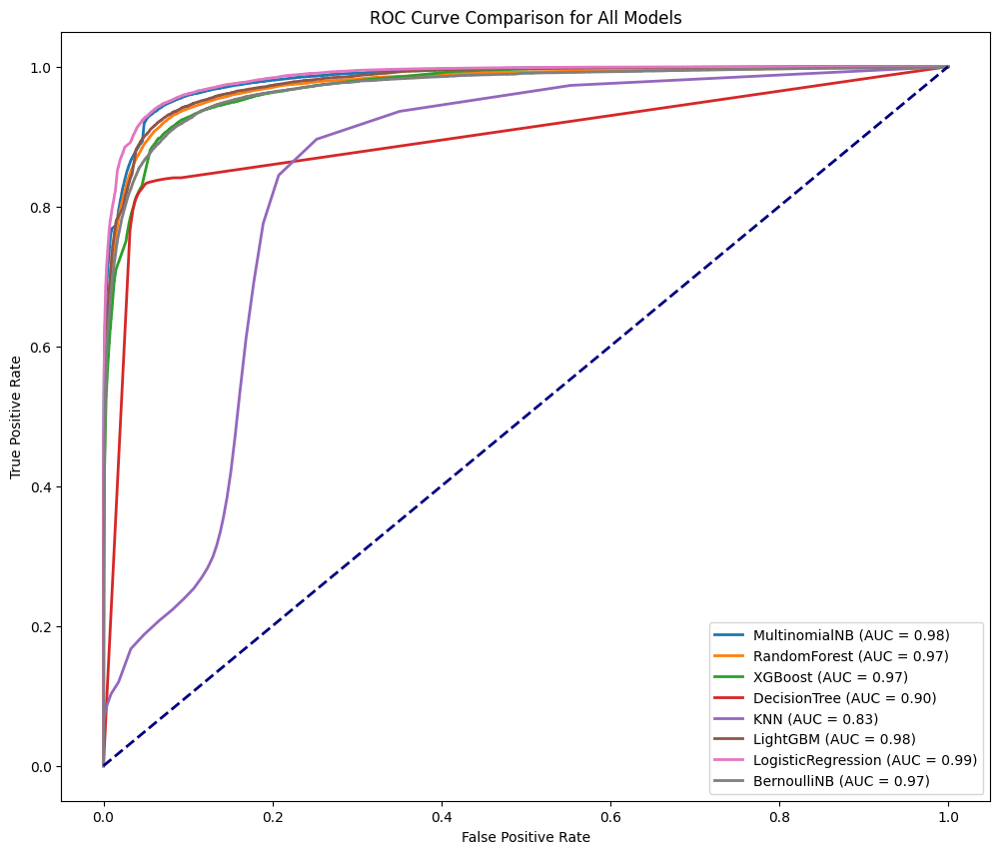

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **NearMiss**

In [ ]:
from imblearn.under_sampling import NearMiss

In [ ]:
nm = NearMiss()
X_train, y_train = nm.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-335-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-335-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


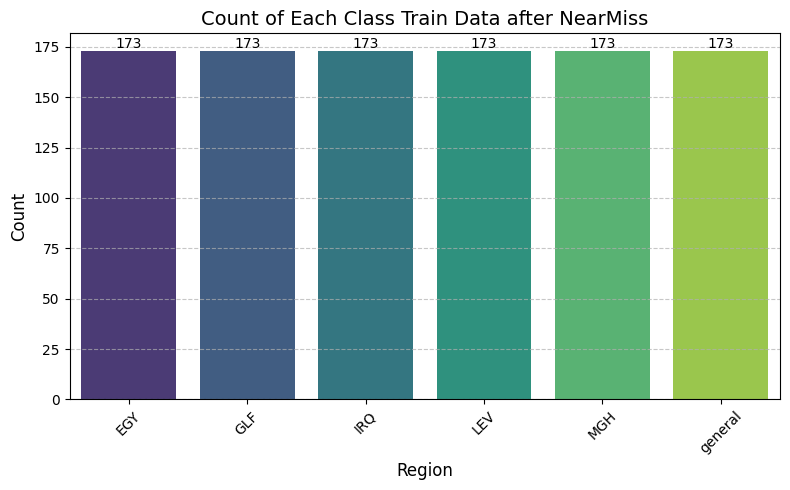

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after NearMiss")

## Multinomial NB- 10.60%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.10604274713185605
Classification Report:
               precision    recall  f1-score   support

           0       0.08      0.53      0.14       904
           1       0.04      0.02      0.03      1277
           2       0.00      0.87      0.00        39
           3       0.51      0.12      0.20     17072
           4       0.00      0.00      0.00      5652
           5       0.04      0.09      0.05       508

    accuracy                           0.11     25452
   macro avg       0.11      0.27      0.07     25452
weighted avg       0.35      0.11      0.14     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.10604274713185605
Precision: 0.3460
Recall for : 0.1060
F1 Score:  0.1414
AUC Score: 0.4901
Balanced Accuracy: 0.2717
G-mean Score: 0.2957
pf Score: 0.1782
Bal Score :  0.3554383072680809


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


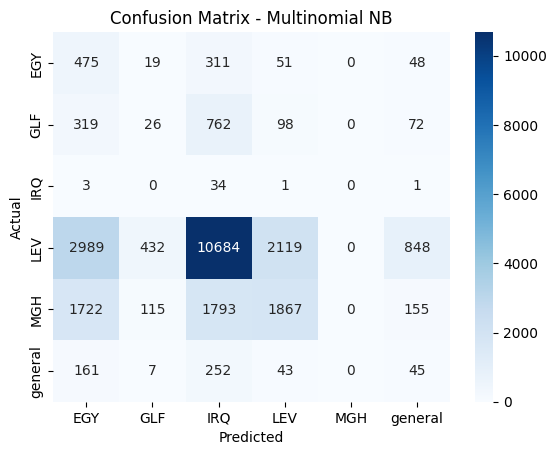

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -15.99%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.15994813767090996
Classification Report:
               precision    recall  f1-score   support

           0       0.08      0.40      0.13       904
           1       0.03      0.00      0.00      1277
           2       0.00      0.79      0.01        39
           3       0.51      0.21      0.30     17072
           4       1.00      0.00      0.00      5652
           5       0.03      0.07      0.04       508

    accuracy                           0.16     25452
   macro avg       0.27      0.25      0.08     25452
weighted avg       0.57      0.16      0.21     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.08 seconds
Accuracy: 0.15994813767090996
Precision: 0.5681
Recall for : 0.1599
F1 Score:  0.2071
AUC Score: 0.4648
Balanced Accuracy: 0.2467
G-mean Score: 0.3371
pf Score: 0.1883
Bal Score :  0.39125433148483857


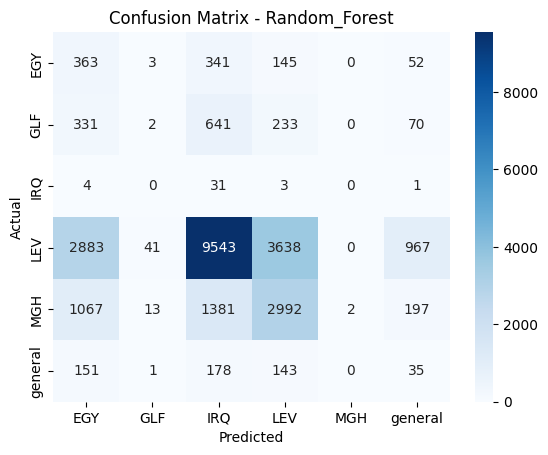

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 21.69%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.21687883074021688
Classification Report:
               precision    recall  f1-score   support

           0       0.06      0.19      0.09       904
           1       0.05      0.00      0.00      1277
           2       0.00      0.79      0.01        39
           3       0.56      0.31      0.40     17072
           4       0.14      0.00      0.00      5652
           5       0.02      0.02      0.02       508

    accuracy                           0.22     25452
   macro avg       0.14      0.22      0.09     25452
weighted avg       0.41      0.22      0.27     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.14 seconds
Accuracy: 0.21687883074021688
Precision: 0.4101
Recall for : 0.2169
F1 Score:  0.2714
AUC Score: 0.4599
Balanced Accuracy: 0.2199
G-mean Score: 0.3773
pf Score: 0.1878
Bal Score :  0.430551165008658


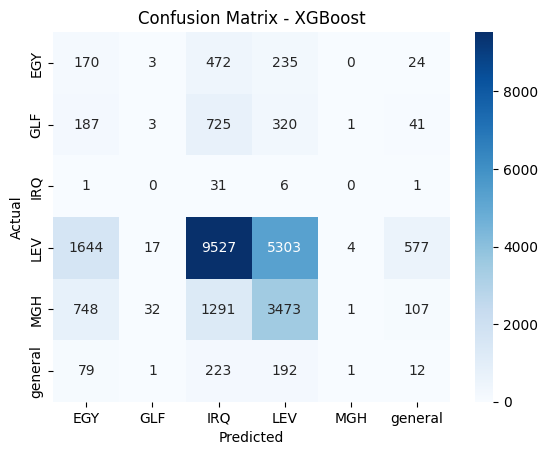

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 24.03%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.24025616847399026
Classification Report:
               precision    recall  f1-score   support

           0       0.05      0.25      0.09       904
           1       0.06      0.00      0.00      1277
           2       0.00      0.72      0.01        39
           3       0.58      0.34      0.43     17072
           4       1.00      0.00      0.00      5652
           5       0.03      0.02      0.02       508

    accuracy                           0.24     25452
   macro avg       0.29      0.22      0.09     25452
weighted avg       0.61      0.24      0.29     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.24025616847399026
Precision: 0.6143
Recall for : 0.2403
F1 Score:  0.2921
AUC Score: 0.4715
Balanced Accuracy: 0.2222
G-mean Score: 0.3952
pf Score: 0.1850
Bal Score :  0.44708873657003256


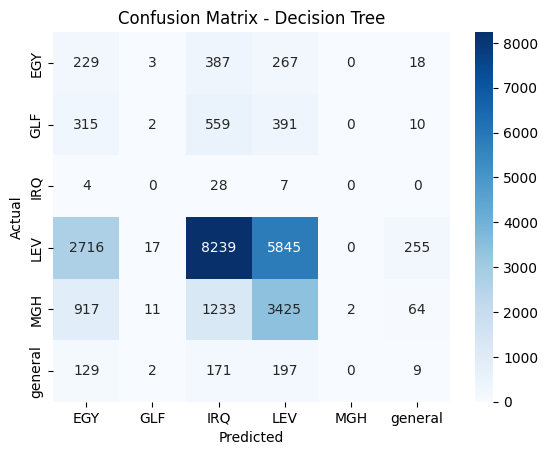

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 48.97%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4896668238252397
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       904
           1       0.08      0.00      0.00      1277
           2       0.00      0.00      0.00        39
           3       0.63      0.68      0.65     17072
           4       0.12      0.15      0.14      5652
           5       0.33      0.00      0.00       508

    accuracy                           0.49     25452
   macro avg       0.19      0.14      0.13     25452
weighted avg       0.46      0.49      0.47     25452



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.4896668238252397
Precision: 0.4619
Recall for : 0.4897
F1 Score:  0.4698
AUC Score: 0.4702
Balanced Accuracy: 0.1395
G-mean Score: 0.4373
pf Score: 0.1866
Bal Score :  0.6157687575758805


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## LightGBM Model -33.13%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 90
[LightGBM] [Info] Number of data points in the train set: 1038, number of used features: 9
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.3312902718843313
Classification Report:
               precision    recall  f1-score   support

           0       0.05      0.25      0.09       904
           1       0.08      0.00      0.00      1277
           2       0.00      0.56      0.01        39
           3       0.60      0.48      0.53     17072
           4       1.00      0.00      0.00      5652
           5       0.03      0.00      0.00       508

    accuracy                           0.33     25452
   macro avg       0.30      0.22      0.11     25452
weighted avg       0.63      0.33      0.36     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 0.31 seconds
Accuracy: 0.3312902718843313
Precision: 0.6290
Recall for : 0.3313
F1 Score:  0.3601
AUC Score: 0.4688
Balanced Accuracy: 0.2155
G-mean Score: 0.4273
pf Score: 0.1863
Bal Score :  0.5091473183556473


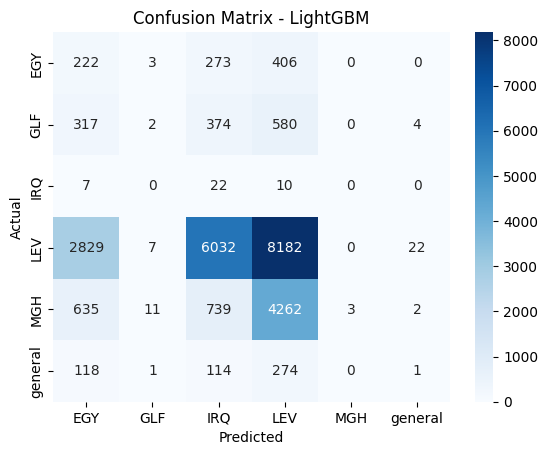

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 28.04%





In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.2804101838755304
Classification Report:
               precision    recall  f1-score   support

           0       0.08      0.50      0.14       904
           1       0.04      0.04      0.04      1277
           2       0.00      0.64      0.01        39
           3       0.59      0.38      0.46     17072
           4       1.00      0.00      0.00      5652
           5       0.03      0.15      0.06       508

    accuracy                           0.28     25452
   macro avg       0.29      0.29      0.12     25452
weighted avg       0.62      0.28      0.32     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.30 seconds
Accuracy: 0.2804101838755304
Precision: 0.6243
Recall for : 0.2804
F1 Score:  0.3198
AUC Score: 0.4795
Balanced Accuracy: 0.2858
G-mean Score: 0.4193
pf Score: 0.1821
Bal Score :  0.47513034027571877


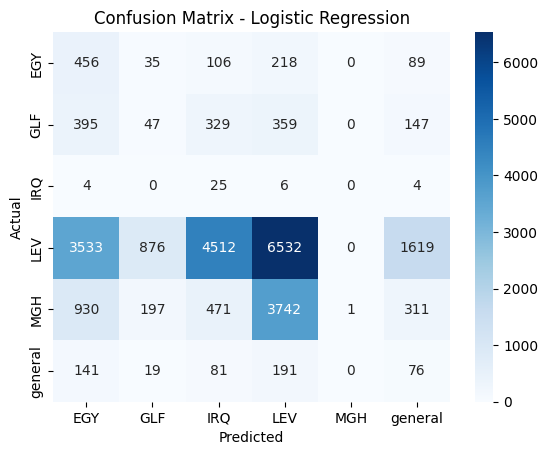

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 22.60%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.225994027974226
Classification Report:
               precision    recall  f1-score   support

           0       0.06      0.43      0.11       904
           1       0.04      0.03      0.03      1277
           2       0.00      0.31      0.01        39
           3       0.55      0.30      0.39     17072
           4       0.77      0.01      0.01      5652
           5       0.03      0.24      0.05       508

    accuracy                           0.23     25452
   macro avg       0.24      0.22      0.10     25452
weighted avg       0.55      0.23      0.27     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.225994027974226
Precision: 0.5453
Recall for : 0.2260
F1 Score:  0.2712
AUC Score: 0.4633
Balanced Accuracy: 0.2180
G-mean Score: 0.3829
pf Score: 0.1875
Bal Score :  0.4368609526279471


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

0.0040
0.2260
0.5453
0.2260
0.2712
0.4633
0.2180
0.3829
0.1875
0.4369


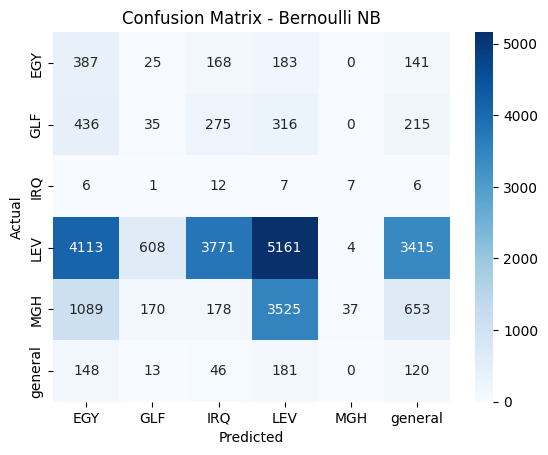

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

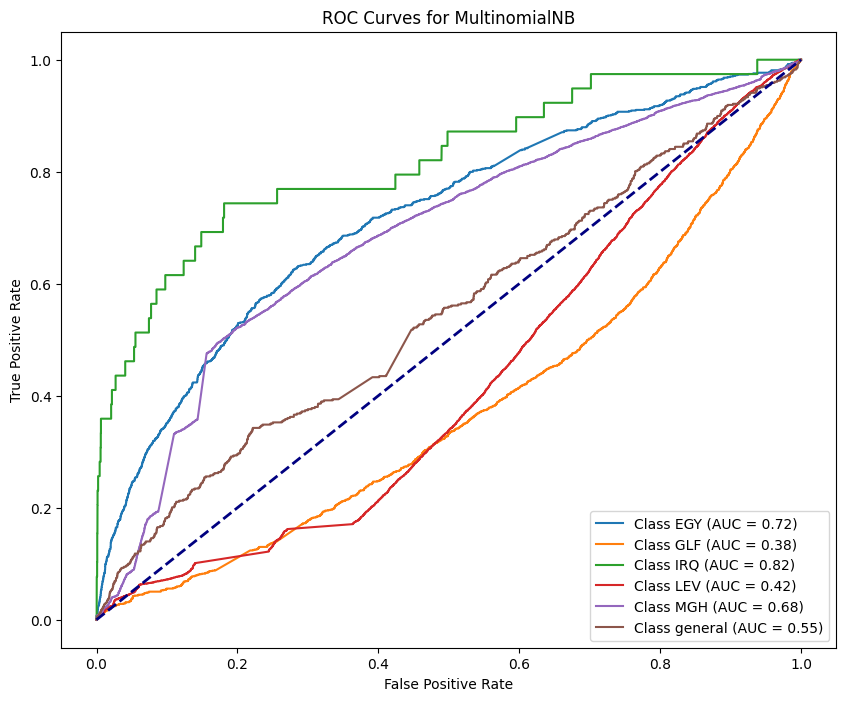

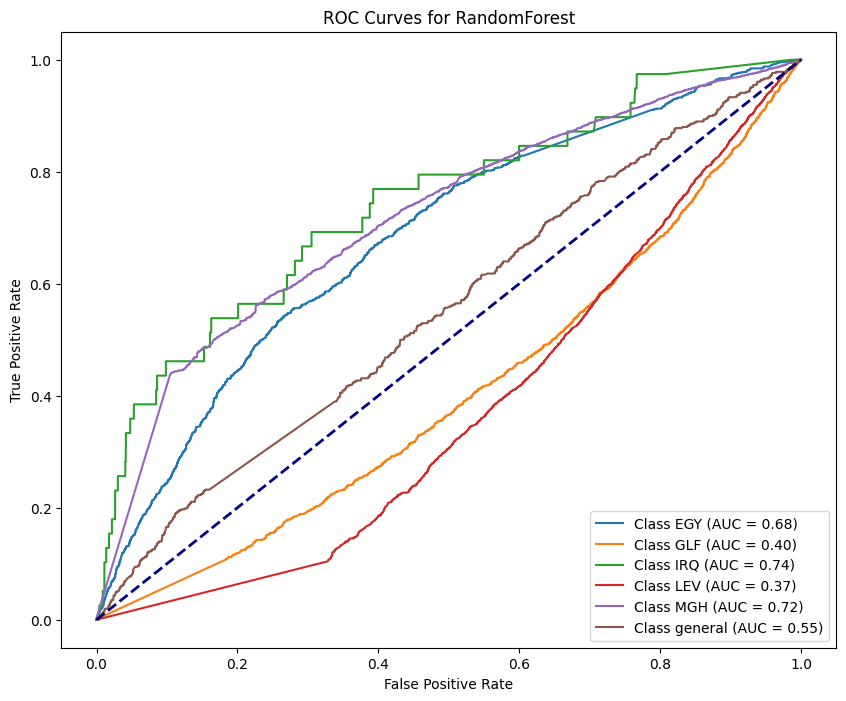

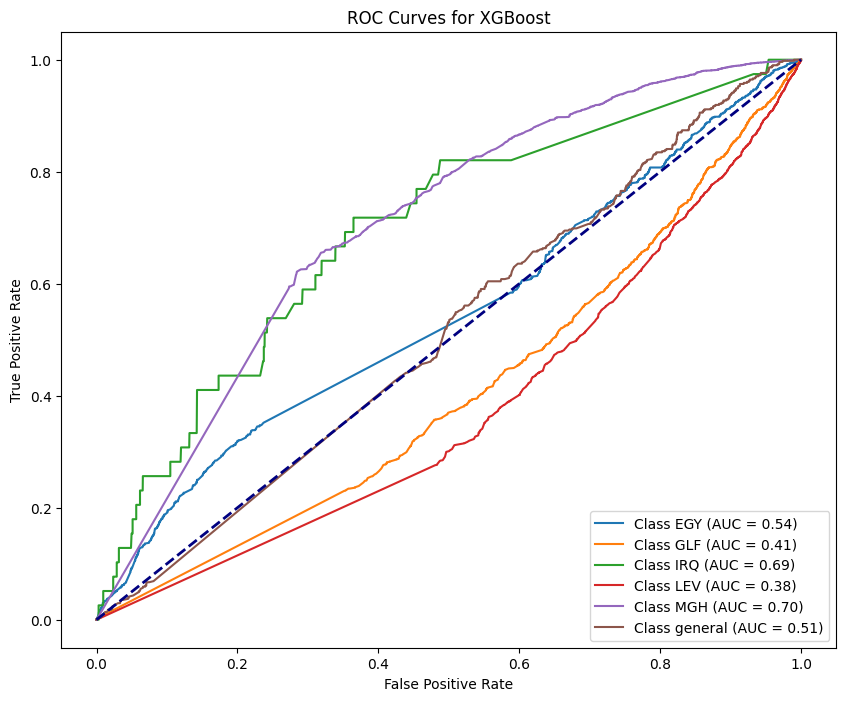

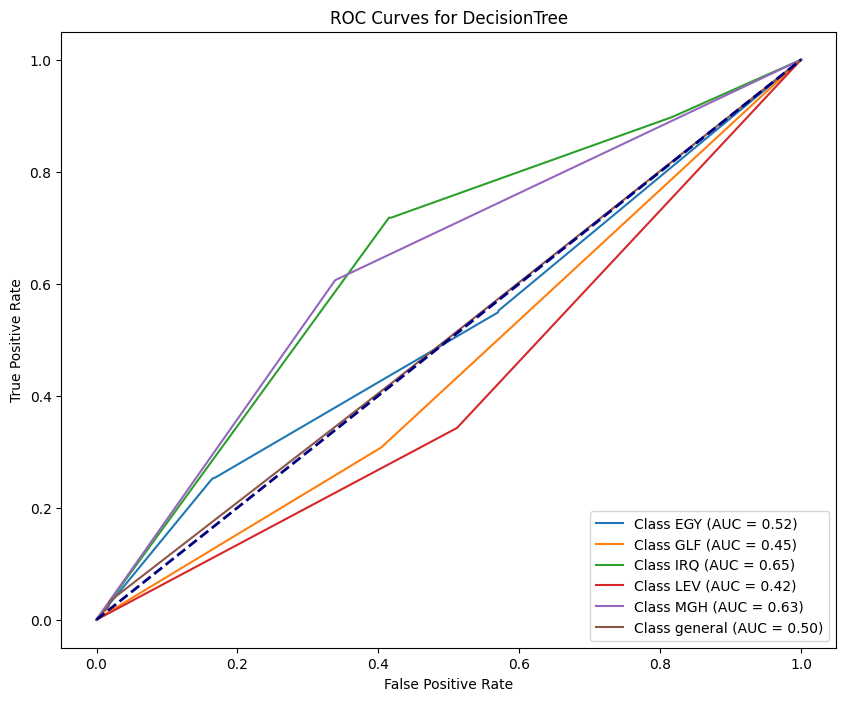

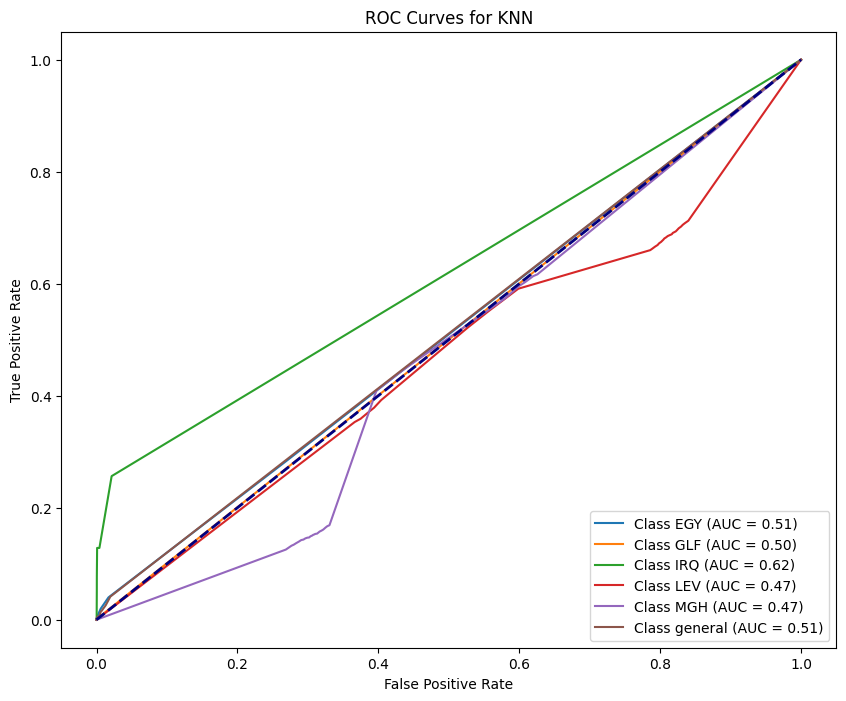

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


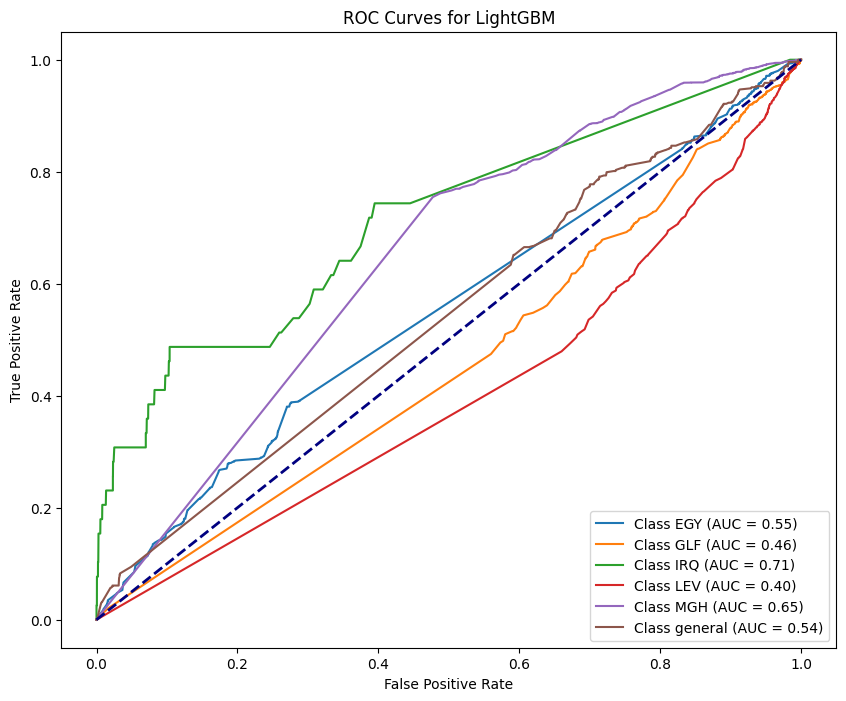

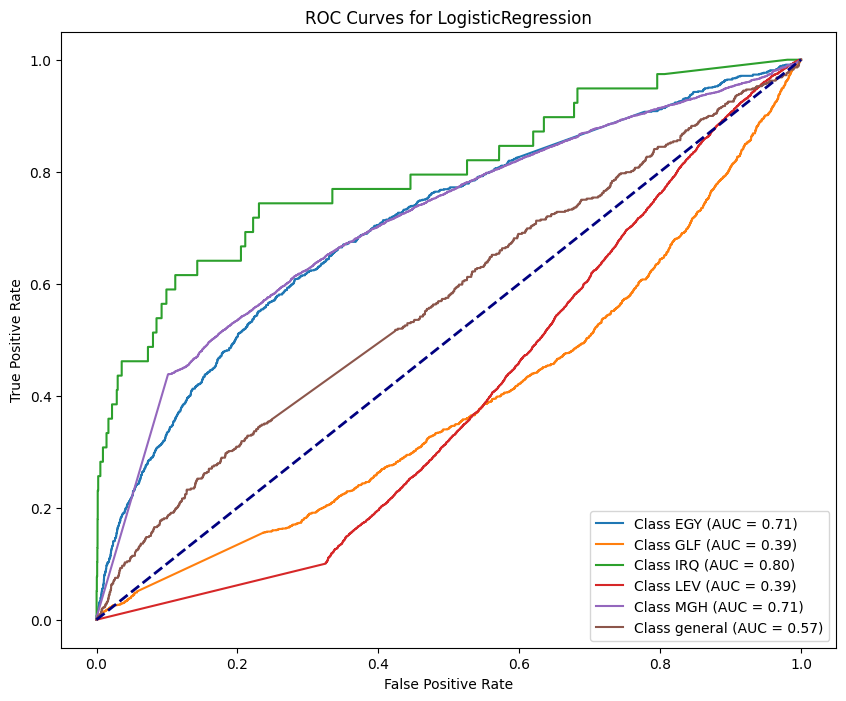

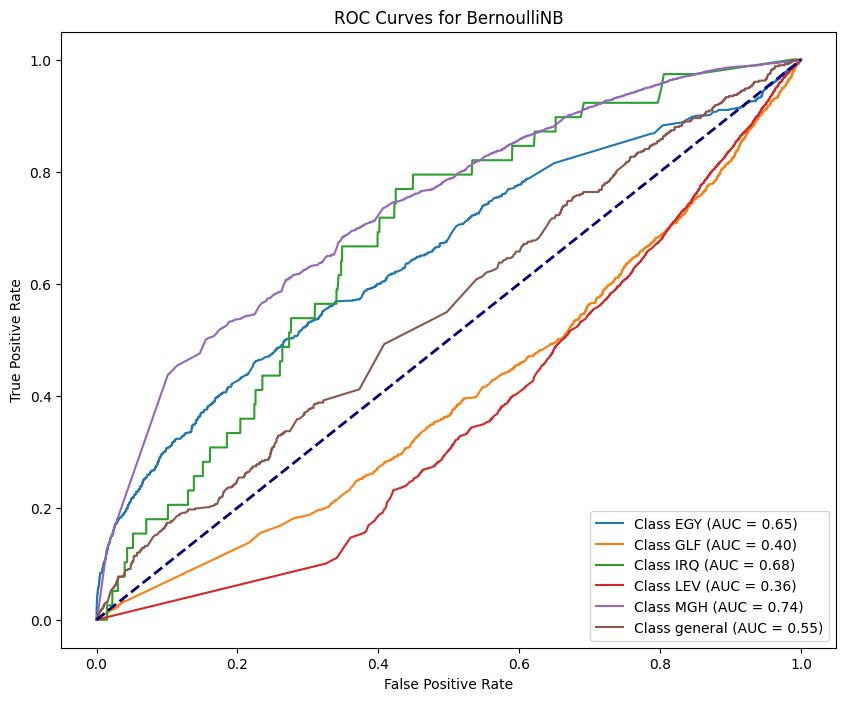

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


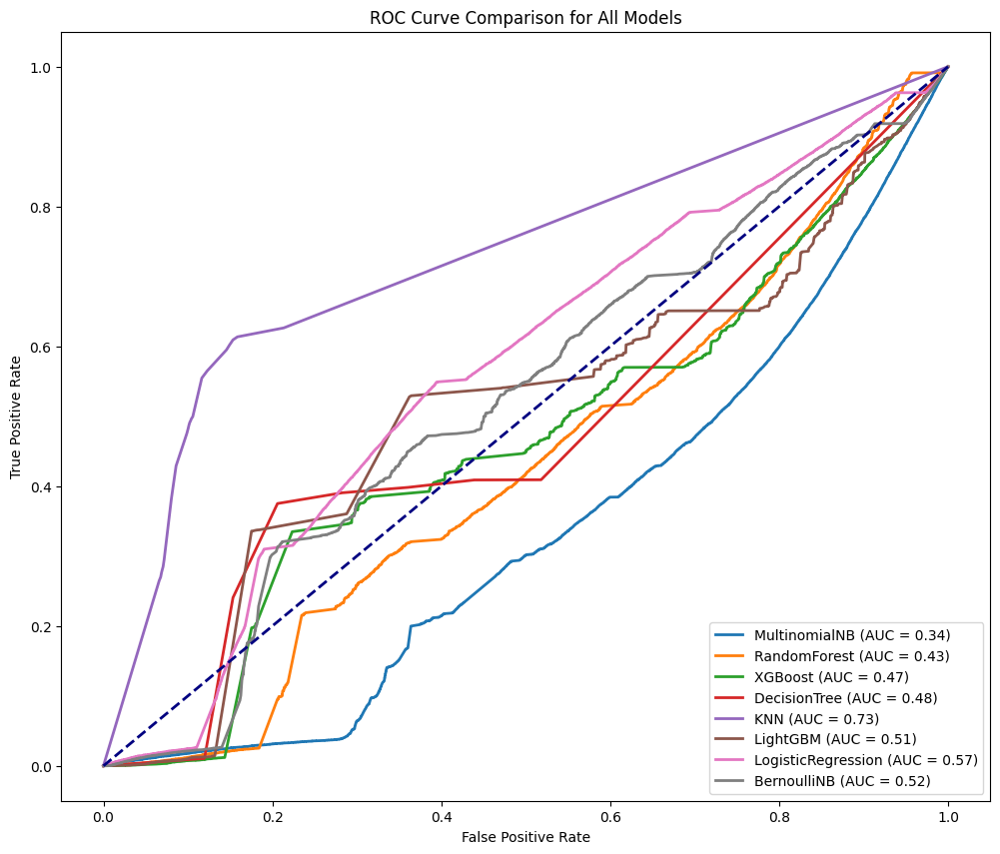

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **HyBrid Sampling SMOTETomek**

In [ ]:
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
# Define SMOTE-Tomek Links
resample=SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'))
X_train, y_train = resample.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-27-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-27-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


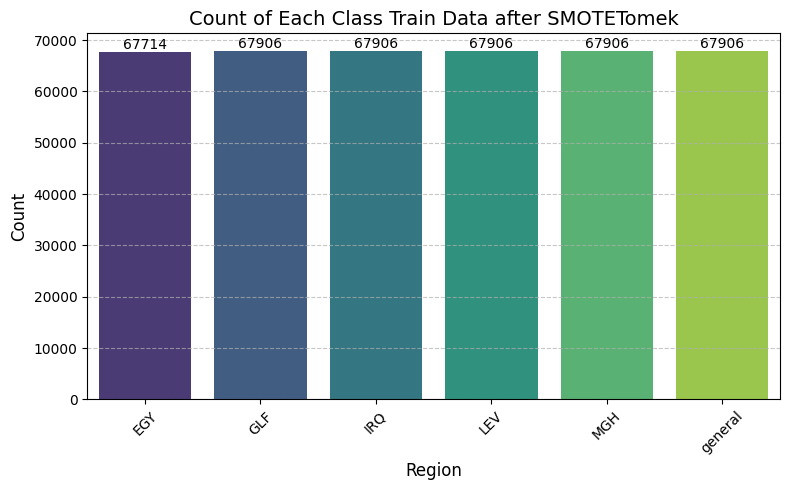

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTETomek")

## Multinomial NB- 75.96%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7595866729530096
Classification Report:
               precision    recall  f1-score   support

           0       0.36      0.74      0.49       904
           1       0.28      0.64      0.39      1277
           2       0.03      0.44      0.06        39
           3       0.98      0.79      0.87     17072
           4       0.91      0.74      0.82      5652
           5       0.09      0.31      0.14       508

    accuracy                           0.76     25452
   macro avg       0.44      0.61      0.46     25452
weighted avg       0.88      0.76      0.81     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.09 seconds
Accuracy: 0.7595866729530096
Precision: 0.8849
Recall for : 0.7596
F1 Score:  0.8064
AUC Score: 0.9537
Balanced Accuracy: 0.6099
G-mean Score: 0.8547
pf Score: 0.0464
Bal Score :  0.8268604809829292


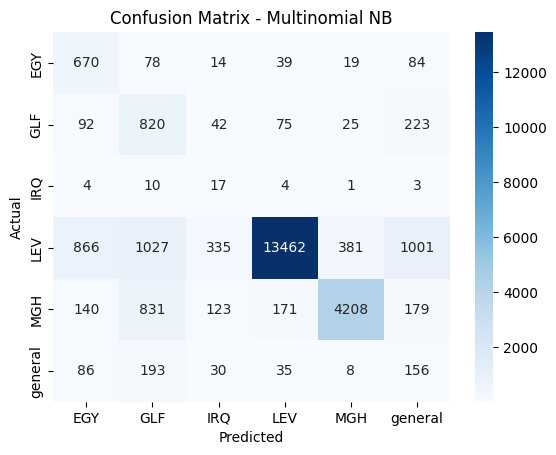

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -78.48%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7848106239195348
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.51      0.48       904
           1       0.34      0.40      0.37      1277
           2       0.02      0.10      0.03        39
           3       0.91      0.83      0.87     17072
           4       0.80      0.83      0.81      5652
           5       0.06      0.13      0.09       508

    accuracy                           0.78     25452
   macro avg       0.43      0.47      0.44     25452
weighted avg       0.82      0.78      0.80     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1659.96 seconds
Accuracy: 0.7848106239195348
Precision: 0.8189
Recall for : 0.7848
F1 Score:  0.8003
AUC Score: 0.9100
Balanced Accuracy: 0.4689
G-mean Score: 0.8240
pf Score: 0.0584
Bal Score :  0.8423433570266472


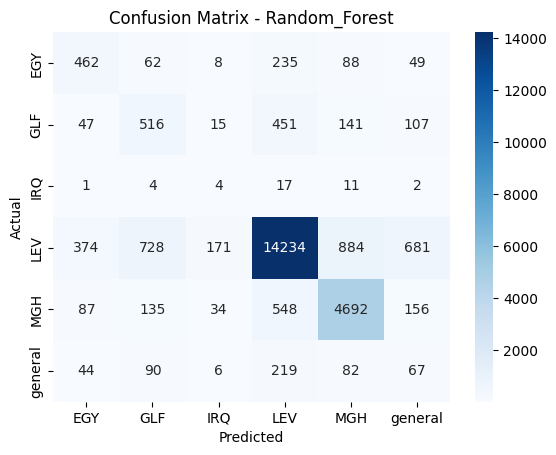

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 72.81%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.728076379066478
Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.59      0.55       904
           1       0.41      0.52      0.46      1277
           2       0.12      0.33      0.17        39
           3       0.96      0.72      0.82     17072
           4       0.63      0.87      0.73      5652
           5       0.08      0.33      0.13       508

    accuracy                           0.73     25452
   macro avg       0.45      0.56      0.48     25452
weighted avg       0.82      0.73      0.76     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 439.39 seconds
Accuracy: 0.728076379066478
Precision: 0.8228
Recall for : 0.7281
F1 Score:  0.7577
AUC Score: 0.9179
Balanced Accuracy: 0.5605
G-mean Score: 0.8180
pf Score: 0.0588
Bal Score :  0.8032732104266586


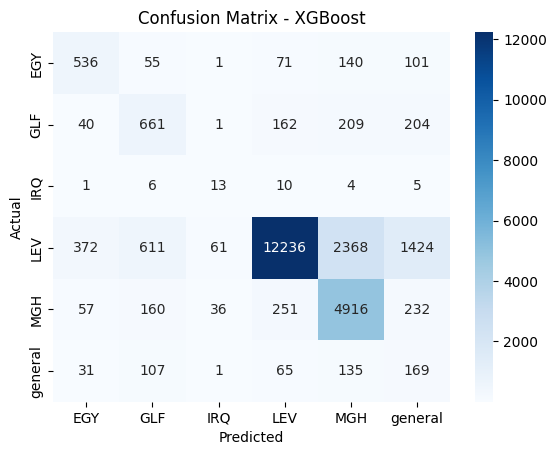

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 74.16%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7416313059877416
Classification Report:
               precision    recall  f1-score   support

           0       0.33      0.42      0.37       904
           1       0.23      0.33      0.27      1277
           2       0.06      0.28      0.10        39
           3       0.88      0.80      0.84     17072
           4       0.74      0.78      0.76      5652
           5       0.07      0.13      0.09       508

    accuracy                           0.74     25452
   macro avg       0.39      0.46      0.40     25452
weighted avg       0.78      0.74      0.76     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 194.95 seconds
Accuracy: 0.7416313059877416
Precision: 0.7816
Recall for : 0.7416
F1 Score:  0.7591
AUC Score: 0.7950
Balanced Accuracy: 0.4557
G-mean Score: 0.7867
pf Score: 0.0707
Bal Score :  0.8105975910557808


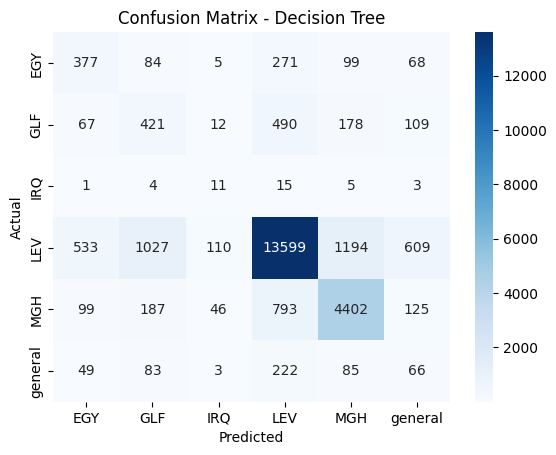

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 22.10%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.221004243281471
Classification Report:
               precision    recall  f1-score   support

           0       0.11      0.48      0.18       904
           1       0.11      0.34      0.17      1277
           2       0.00      0.26      0.01        39
           3       0.94      0.03      0.07     17072
           4       0.76      0.69      0.72      5652
           5       0.03      0.48      0.05       508

    accuracy                           0.22     25452
   macro avg       0.32      0.38      0.20     25452
weighted avg       0.81      0.22      0.22     25452



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.04 seconds
Accuracy: 0.221004243281471
Precision: 0.8068
Recall for : 0.2210
F1 Score:  0.2208
AUC Score: 0.6865
Balanced Accuracy: 0.3805
G-mean Score: 0.4614
pf Score: 0.1360
Bal Score :  0.44083788971271265


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

0.0376
0.2210
0.8068
0.2210
0.2208
0.6865
0.3805
0.4614
0.1360
0.4408


## LightGBM Model -72.23%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 28.416728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313719
[LightGBM] [Info] Number of data points in the train set: 407244, number of used features: 4992
[LightGBM] [Info] Start training from score -1.794120
[LightGBM] [Info] Start training from score -1.791288
[LightGBM] [Info] Start training from score -1.791288
[LightGBM] [Info] Start training from score -1.791288
[LightGBM] [Info] Start training from score -1.791288
[LightGBM] [Info] Start training from score -1.791288


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7223400911519723
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.64      0.55       904
           1       0.42      0.57      0.48      1277
           2       0.06      0.31      0.10        39
           3       0.96      0.76      0.85     17072
           4       0.82      0.69      0.75      5652
           5       0.06      0.49      0.11       508

    accuracy                           0.72     25452
   macro avg       0.47      0.58      0.47     25452
weighted avg       0.87      0.72      0.78     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 208.96 seconds
Accuracy: 0.7223400911519723
Precision: 0.8669
Recall for : 0.7223
F1 Score:  0.7806
AUC Score: 0.9373
Balanced Accuracy: 0.5764
G-mean Score: 0.8256
pf Score: 0.0557
Bal Score :  0.7997562212287441


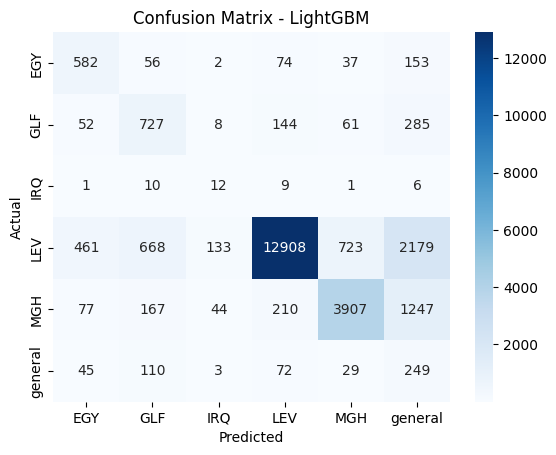

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 77.57%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7756561370422757
Classification Report:
               precision    recall  f1-score   support

           0       0.40      0.68      0.50       904
           1       0.40      0.61      0.48      1277
           2       0.03      0.41      0.06        39
           3       0.97      0.81      0.88     17072
           4       0.88      0.76      0.82      5652
           5       0.08      0.35      0.13       508

    accuracy                           0.78     25452
   macro avg       0.46      0.60      0.48     25452
weighted avg       0.88      0.78      0.82     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 24.49 seconds
Accuracy: 0.7756561370422757
Precision: 0.8812
Recall for : 0.7757
F1 Score:  0.8184
AUC Score: 0.9544
Balanced Accuracy: 0.6036
G-mean Score: 0.8590
pf Score: 0.0455
Bal Score :  0.8381349274973645


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

24.4932
0.7757
0.8812
0.7757
0.8184
0.9544
0.6036
0.8590
0.0455
0.8381


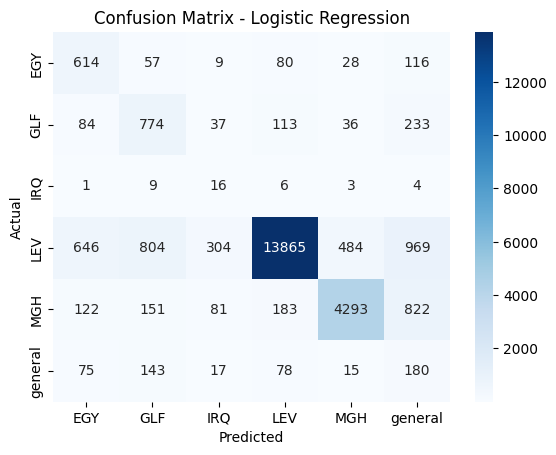

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 76.96%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7696448216250197
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.56      0.52       904
           1       0.41      0.53      0.46      1277
           2       0.05      0.31      0.09        39
           3       0.99      0.75      0.86     17072
           4       0.78      0.93      0.85      5652
           5       0.09      0.46      0.15       508

    accuracy                           0.77     25452
   macro avg       0.47      0.59      0.49     25452
weighted avg       0.88      0.77      0.81     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.13 seconds
Accuracy: 0.7696448216250197
Precision: 0.8766
Recall for : 0.7696
F1 Score:  0.8079
AUC Score: 0.9546
Balanced Accuracy: 0.5926
G-mean Score: 0.8628
pf Score: 0.0439
Bal Score :  0.8341869130555517


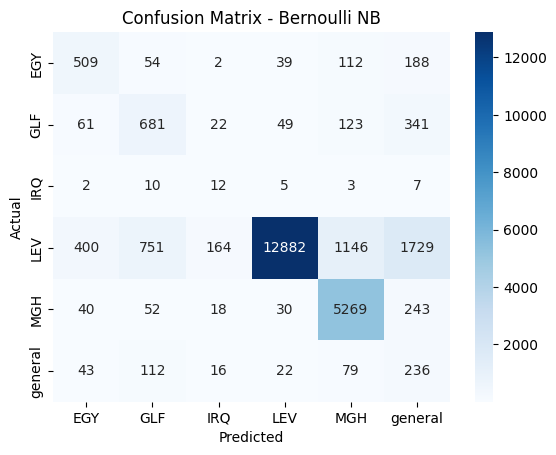

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

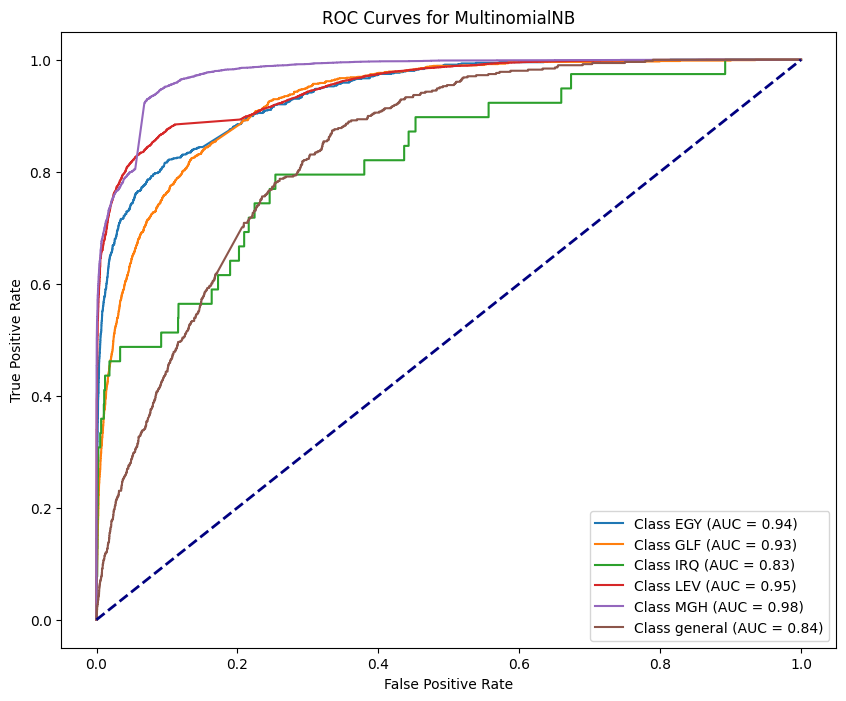

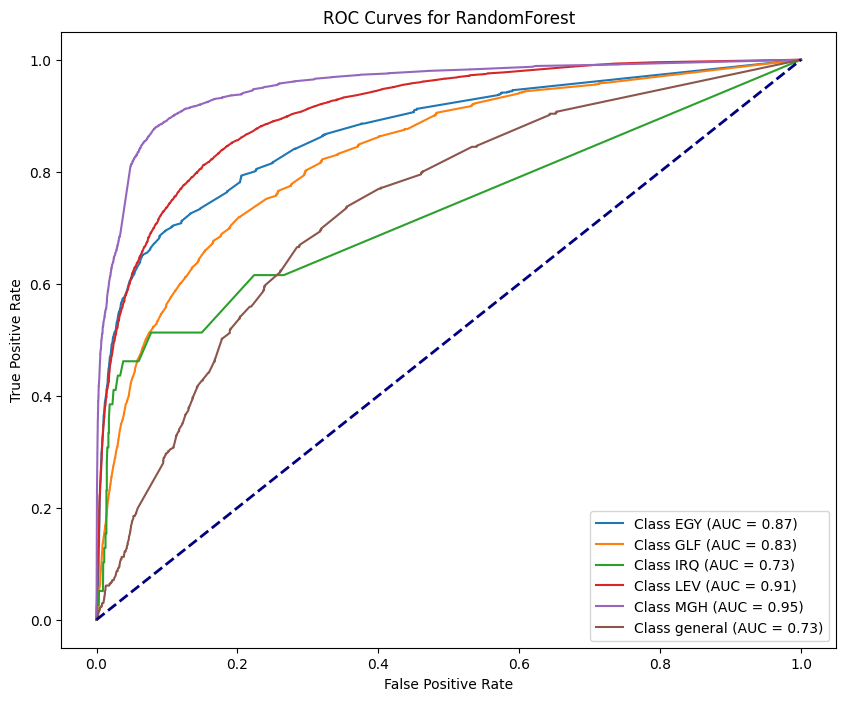

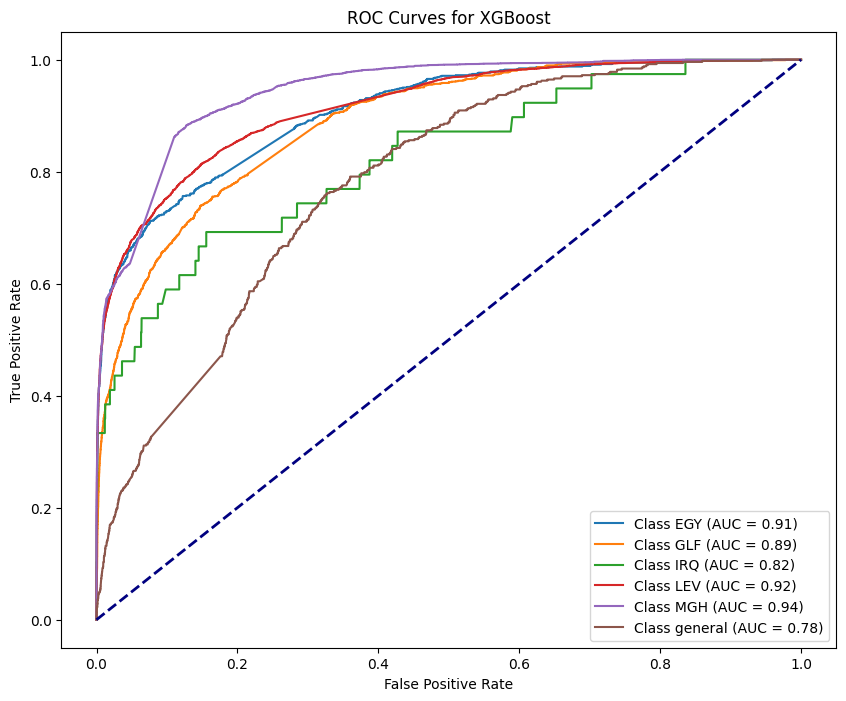

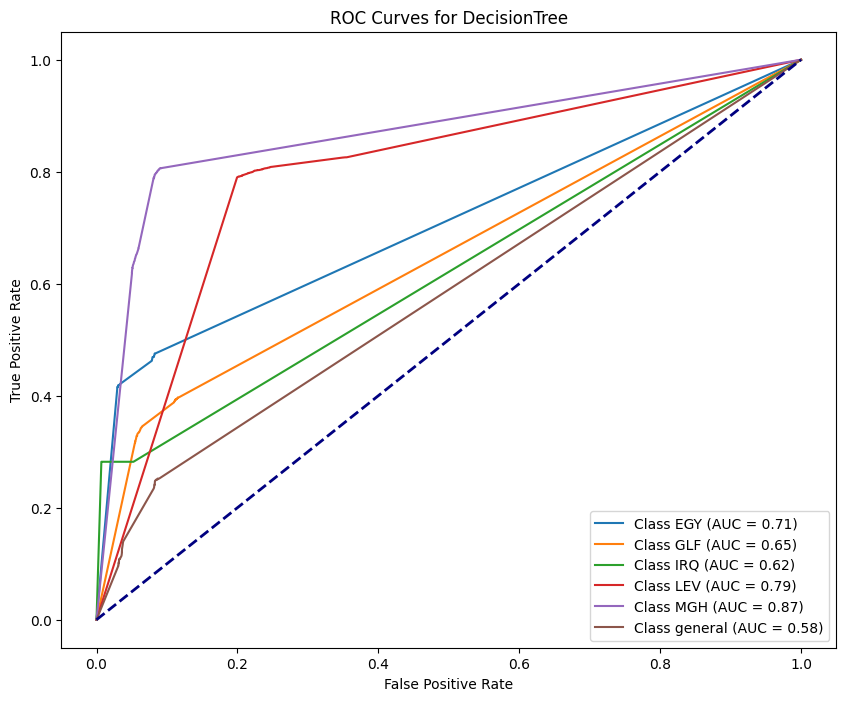

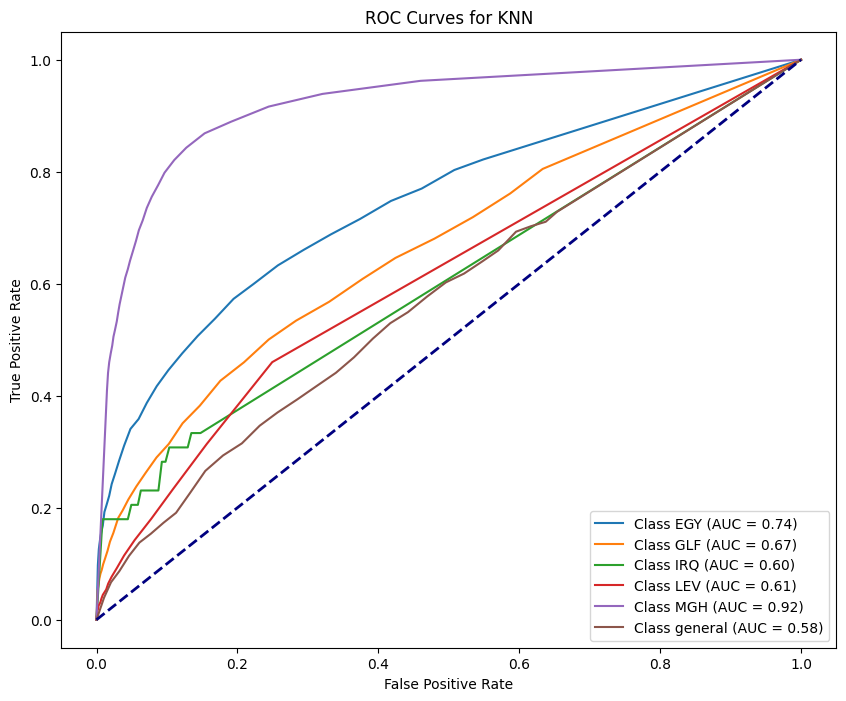

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


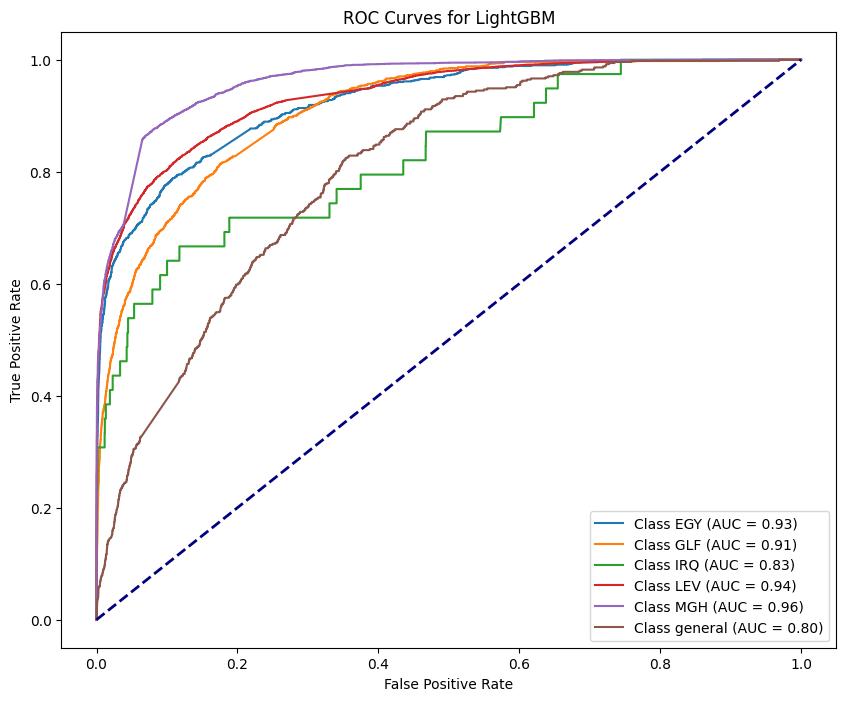

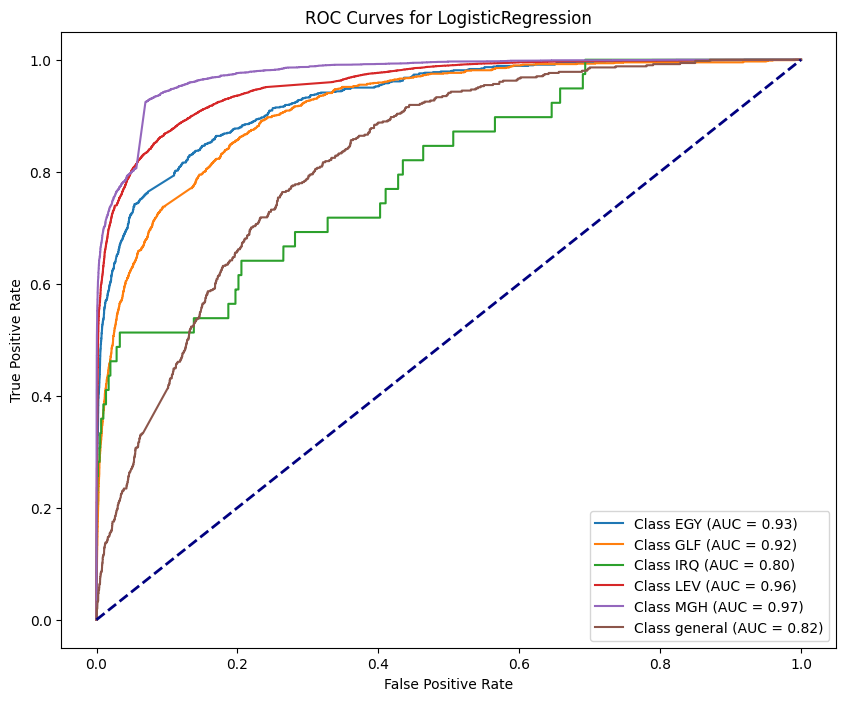

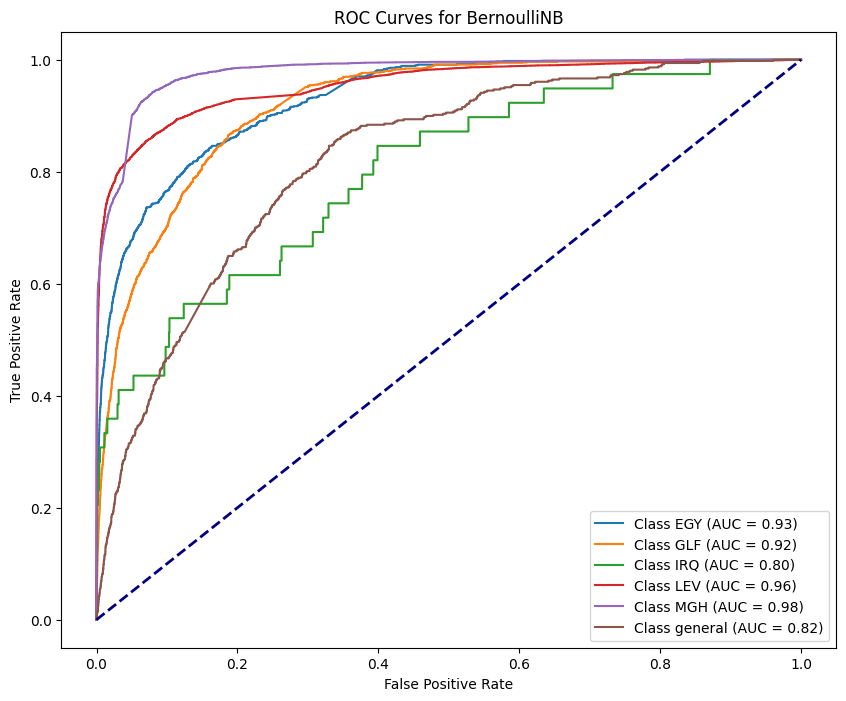

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


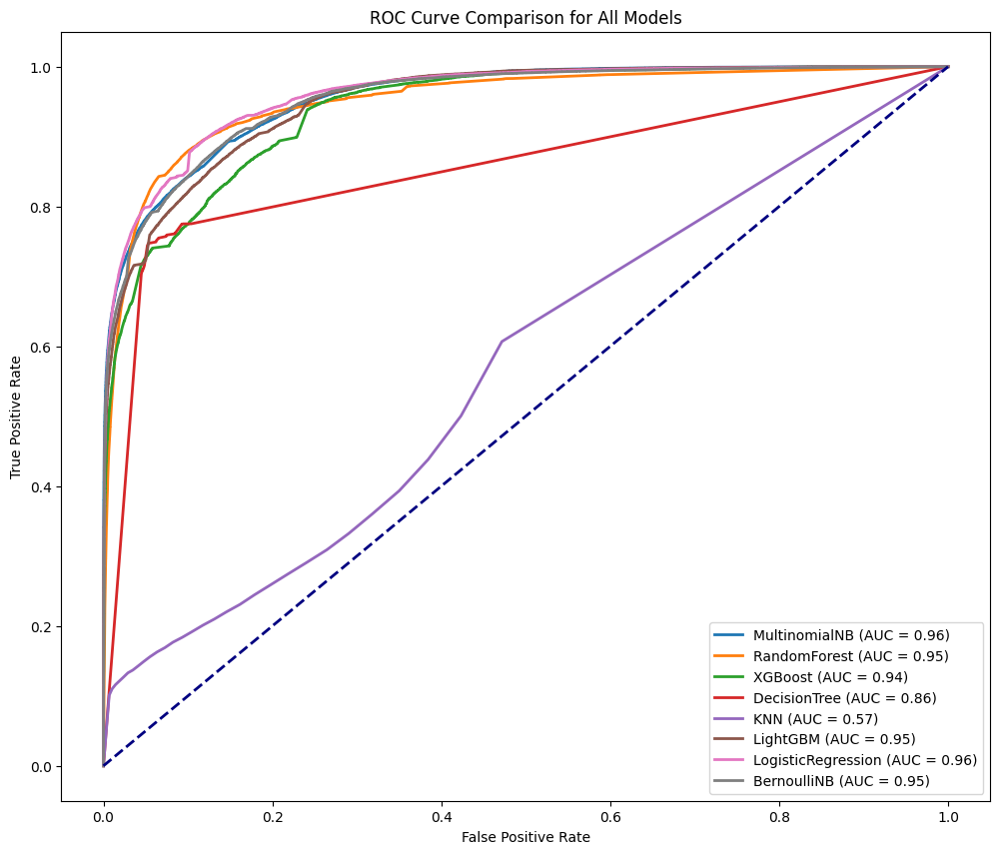

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ROS-RUS**

In [ ]:
import numpy as np
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter
label_counts = Counter(y)
unique_labels = np.unique(y)
minority_class_label = unique_labels[np.argmin([label_counts[label] for label in unique_labels])]

label_counts_values = np.array(list(label_counts.values()))
median = int(np.median(label_counts_values))
desired_over = {label: max(median, count) for label, count in label_counts.items()}
desired_under = {label: median for label in label_counts.keys()}
under = RandomUnderSampler(sampling_strategy=desired_under)
# Define 'over' using RandomOverSampler with desired_over strategy
over = RandomOverSampler(sampling_strategy=desired_over) #This line is added
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

In [ ]:
X_train, y_train = pipeline.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-27-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-27-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


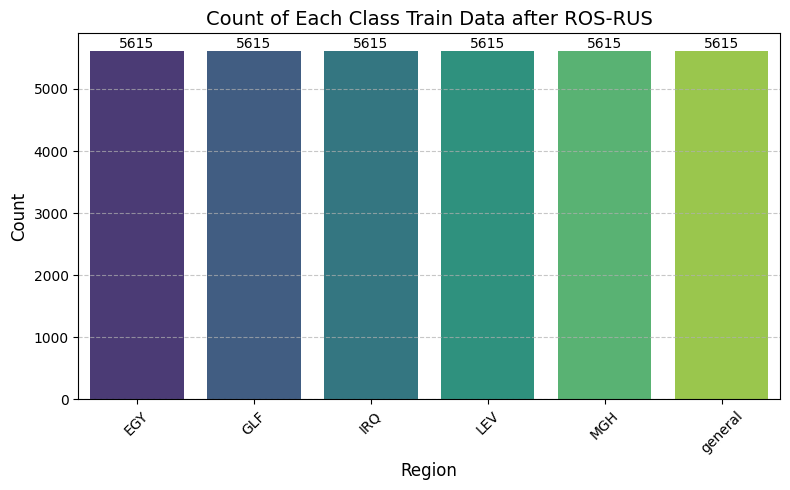

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ROS-RUS")

## Multinomial NB- 71.61%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.716093037875216
Classification Report:
               precision    recall  f1-score   support

           0       0.24      0.77      0.36       904
           1       0.34      0.62      0.44      1277
           2       0.02      0.51      0.04        39
           3       0.98      0.73      0.84     17072
           4       0.89      0.73      0.80      5652
           5       0.08      0.28      0.12       508

    accuracy                           0.72     25452
   macro avg       0.42      0.61      0.43     25452
weighted avg       0.88      0.72      0.78     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.716093037875216
Precision: 0.8805
Recall for : 0.7161
F1 Score:  0.7759
AUC Score: 0.9405
Balanced Accuracy: 0.6065
G-mean Score: 0.8309
pf Score: 0.0533
Bal Score :  0.7957406314576589


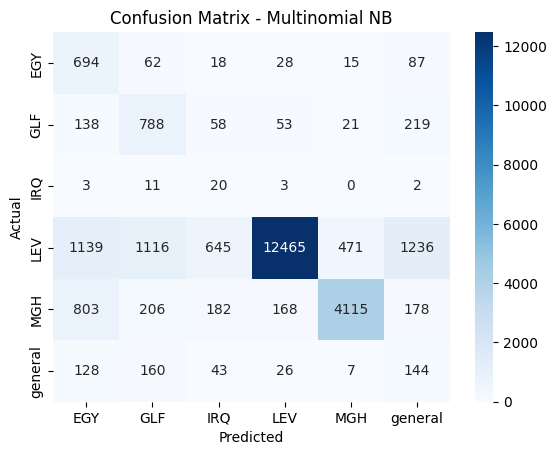

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -69.69%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6969196919691969
Classification Report:
               precision    recall  f1-score   support

           0       0.31      0.64      0.42       904
           1       0.22      0.61      0.33      1277
           2       0.12      0.23      0.15        39
           3       0.95      0.68      0.80     17072
           4       0.70      0.81      0.75      5652
           5       0.09      0.21      0.13       508

    accuracy                           0.70     25452
   macro avg       0.40      0.53      0.43     25452
weighted avg       0.82      0.70      0.73     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 122.85 seconds
Accuracy: 0.6969196919691969
Precision: 0.8172
Recall for : 0.6969
F1 Score:  0.7345
AUC Score: 0.9012
Balanced Accuracy: 0.5314
G-mean Score: 0.8012
pf Score: 0.0637
Bal Score :  0.7810125152574697


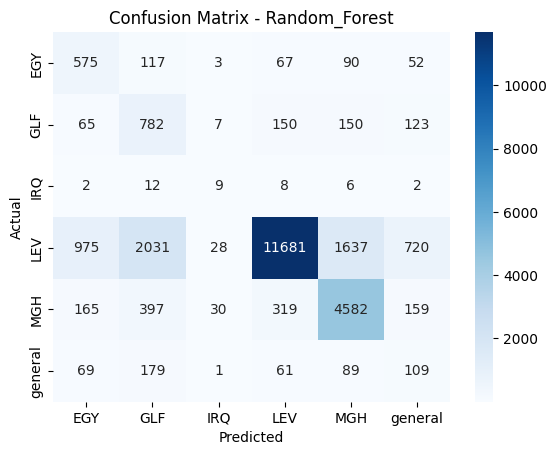

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 66.98%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6698491277699199
Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.62      0.48       904
           1       0.33      0.57      0.42      1277
           2       0.05      0.36      0.09        39
           3       0.98      0.63      0.77     17072
           4       0.62      0.85      0.71      5652
           5       0.07      0.35      0.11       508

    accuracy                           0.67     25452
   macro avg       0.40      0.56      0.43     25452
weighted avg       0.82      0.67      0.71     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 135.54 seconds
Accuracy: 0.6698491277699199
Precision: 0.8229
Recall for : 0.6698
F1 Score:  0.7128
AUC Score: 0.9074
Balanced Accuracy: 0.5635
G-mean Score: 0.7928
pf Score: 0.0653
Bal Score :  0.7620267323865146


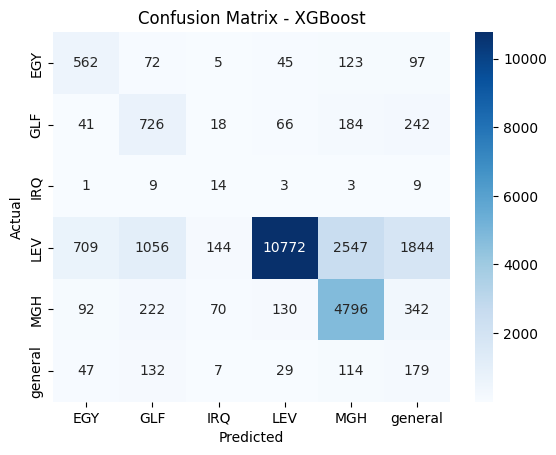

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 60.97%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6097359735973598
Classification Report:
               precision    recall  f1-score   support

           0       0.21      0.51      0.30       904
           1       0.16      0.46      0.23      1277
           2       0.05      0.31      0.08        39
           3       0.92      0.60      0.72     17072
           4       0.64      0.73      0.68      5652
           5       0.07      0.23      0.11       508

    accuracy                           0.61     25452
   macro avg       0.34      0.47      0.35     25452
weighted avg       0.77      0.61      0.66     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 10.90 seconds
Accuracy: 0.6097359735973598
Precision: 0.7741
Recall for : 0.6097
F1 Score:  0.6616
AUC Score: 0.7517
Balanced Accuracy: 0.4729
G-mean Score: 0.7369
pf Score: 0.0833
Bal Score :  0.7178288018657655


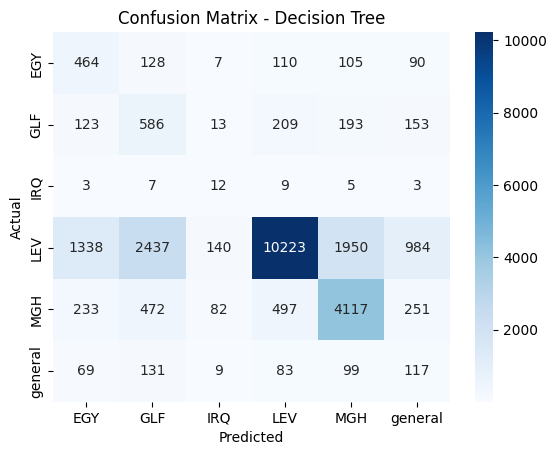

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 18.17%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.18171460003143172
Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.05      0.08       904
           1       0.20      0.07      0.10      1277
           2       0.02      0.26      0.05        39
           3       0.87      0.00      0.01     17072
           4       0.21      0.75      0.33      5652
           5       0.04      0.35      0.07       508

    accuracy                           0.18     25452
   macro avg       0.27      0.25      0.11     25452
weighted avg       0.65      0.18      0.09     25452



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.18171460003143172
Precision: 0.6535
Recall for : 0.1817
F1 Score:  0.0888
AUC Score: 0.5725
Balanced Accuracy: 0.2456
G-mean Score: 0.3862
pf Score: 0.1663
Bal Score :  0.40956040028942287


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

0.0049
0.1817
0.6535
0.1817
0.0888
0.5725
0.2456
0.3862
0.1663
0.4096


## LightGBM Model -70.42%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.373971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51273
[LightGBM] [Info] Number of data points in the train set: 33690, number of used features: 2216
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7041882759704542
Classification Report:
               precision    recall  f1-score   support

           0       0.37      0.66      0.48       904
           1       0.33      0.59      0.42      1277
           2       0.06      0.36      0.10        39
           3       0.97      0.68      0.80     17072
           4       0.68      0.85      0.76      5652
           5       0.08      0.37      0.13       508

    accuracy                           0.70     25452
   macro avg       0.42      0.58      0.45     25452
weighted avg       0.84      0.70      0.74     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 42.62 seconds
Accuracy: 0.7041882759704542
Precision: 0.8364
Recall for : 0.7042
F1 Score:  0.7450
AUC Score: 0.9219
Balanced Accuracy: 0.5844
G-mean Score: 0.8155
pf Score: 0.0586
Bal Score :  0.7867683834006256


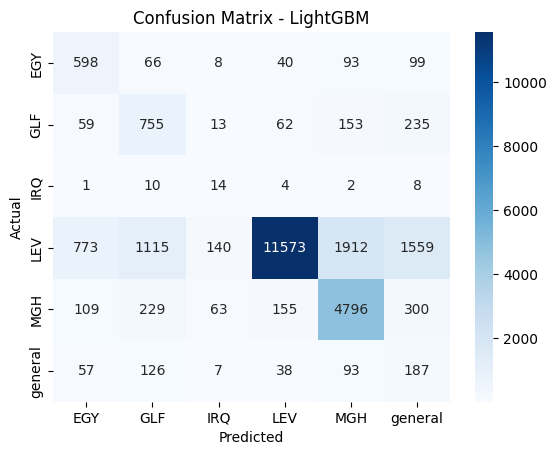

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 75.71%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7571114254282572
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.69      0.51       904
           1       0.36      0.60      0.45      1277
           2       0.05      0.49      0.08        39
           3       0.97      0.75      0.85     17072
           4       0.80      0.87      0.83      5652
           5       0.08      0.34      0.13       508

    accuracy                           0.76     25452
   macro avg       0.45      0.62      0.48     25452
weighted avg       0.87      0.76      0.80     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 5.98 seconds
Accuracy: 0.7571114254282572
Precision: 0.8653
Recall for : 0.7571
F1 Score:  0.7964
AUC Score: 0.9413
Balanced Accuracy: 0.6227
G-mean Score: 0.8493
pf Score: 0.0484
Bal Score :  0.8248813471962562


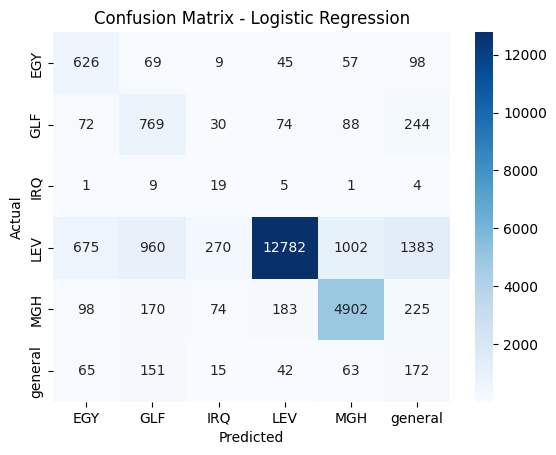

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 70.93%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7092959295929593
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.55      0.50       904
           1       0.41      0.50      0.45      1277
           2       0.02      0.51      0.04        39
           3       0.99      0.67      0.80     17072
           4       0.73      0.92      0.81      5652
           5       0.08      0.49      0.13       508

    accuracy                           0.71     25452
   macro avg       0.45      0.61      0.46     25452
weighted avg       0.87      0.71      0.76     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.7092959295929593
Precision: 0.8670
Recall for : 0.7093
F1 Score:  0.7612
AUC Score: 0.9464
Balanced Accuracy: 0.6069
G-mean Score: 0.8281
pf Score: 0.0540
Bal Score :  0.7909274063854026


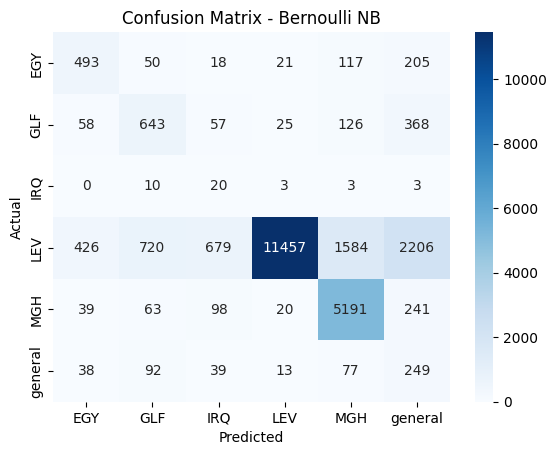

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

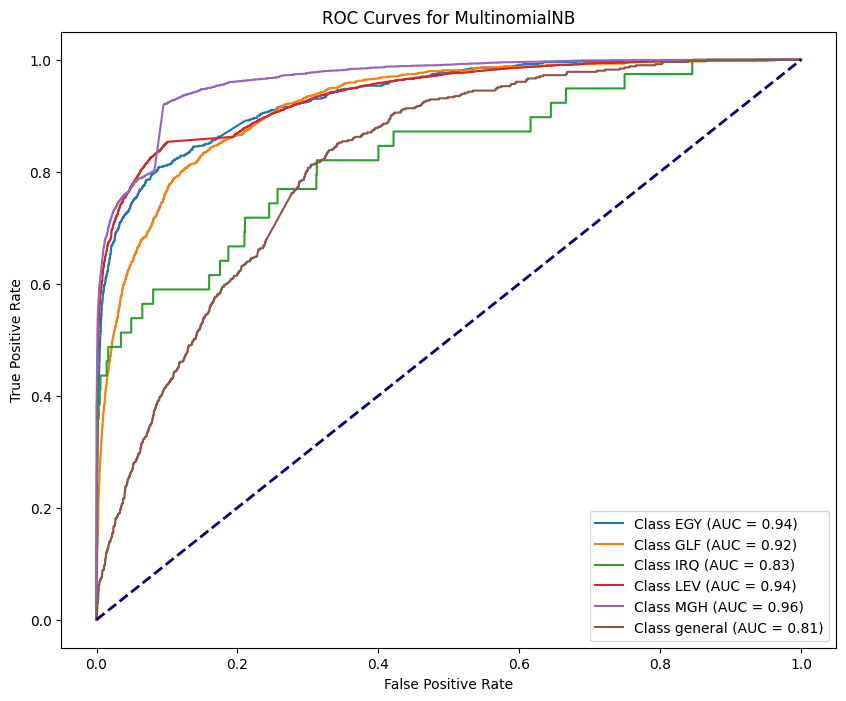

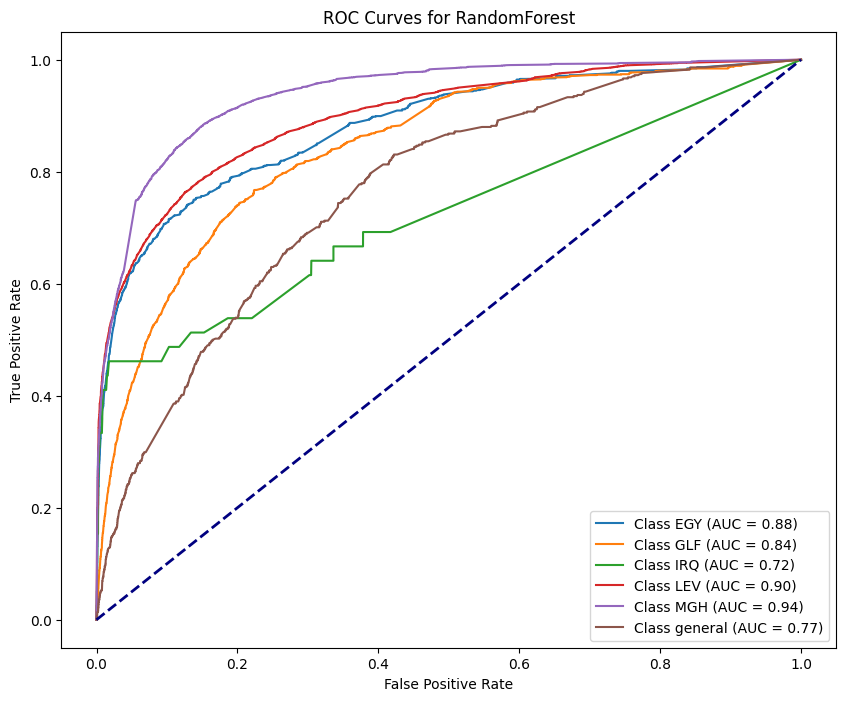

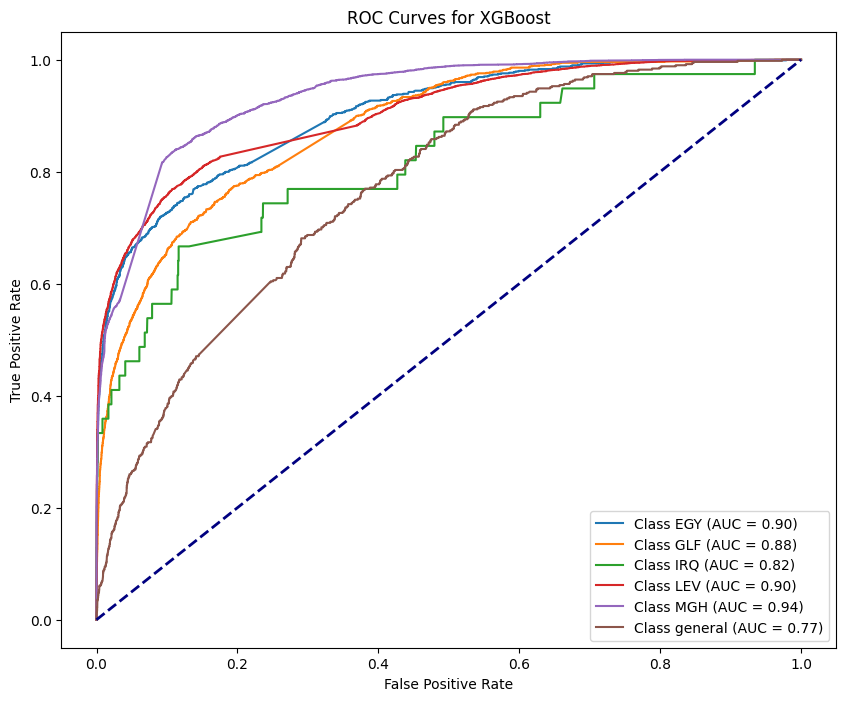

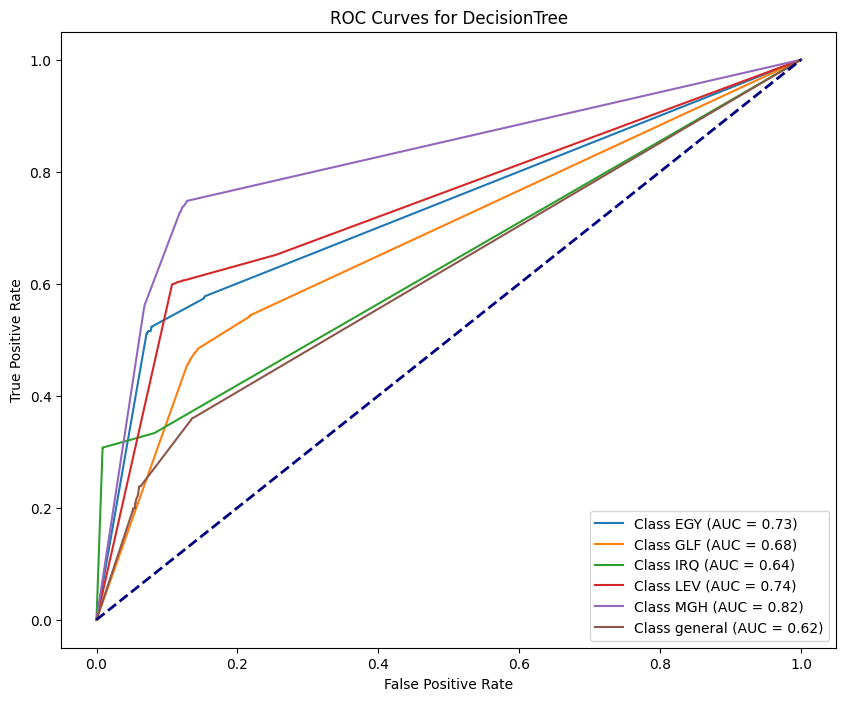

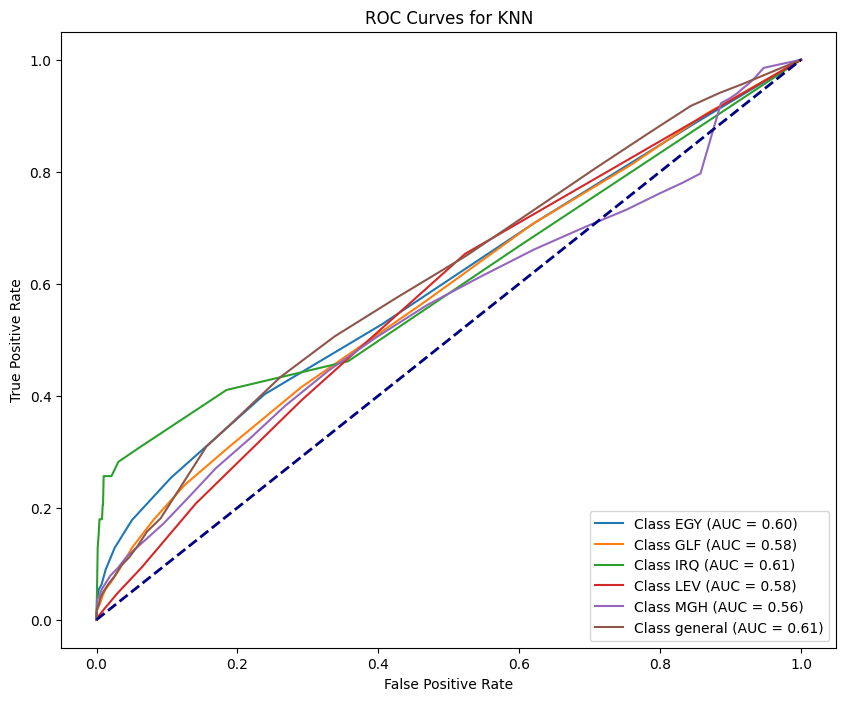

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


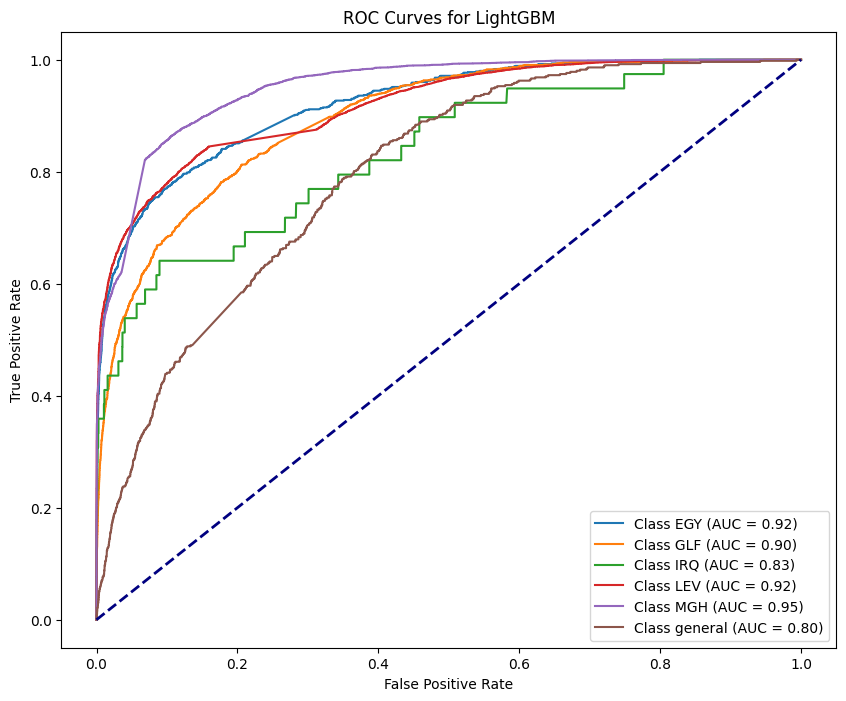

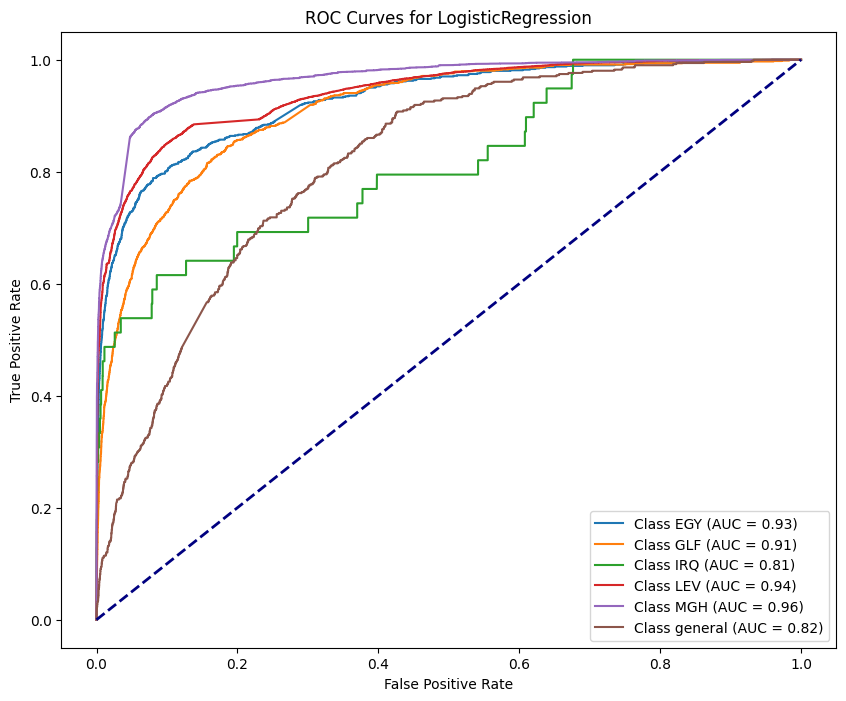

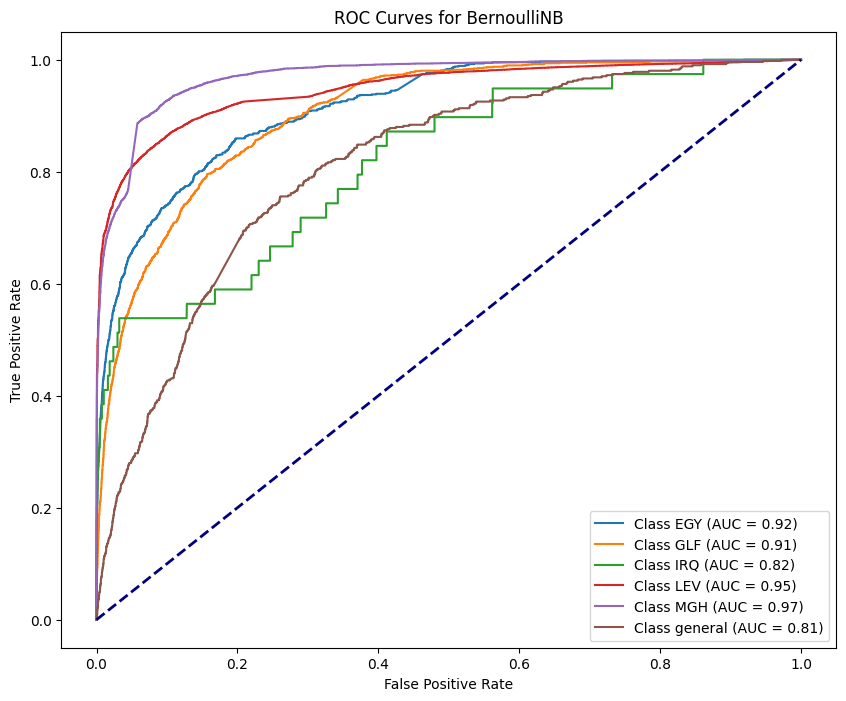

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


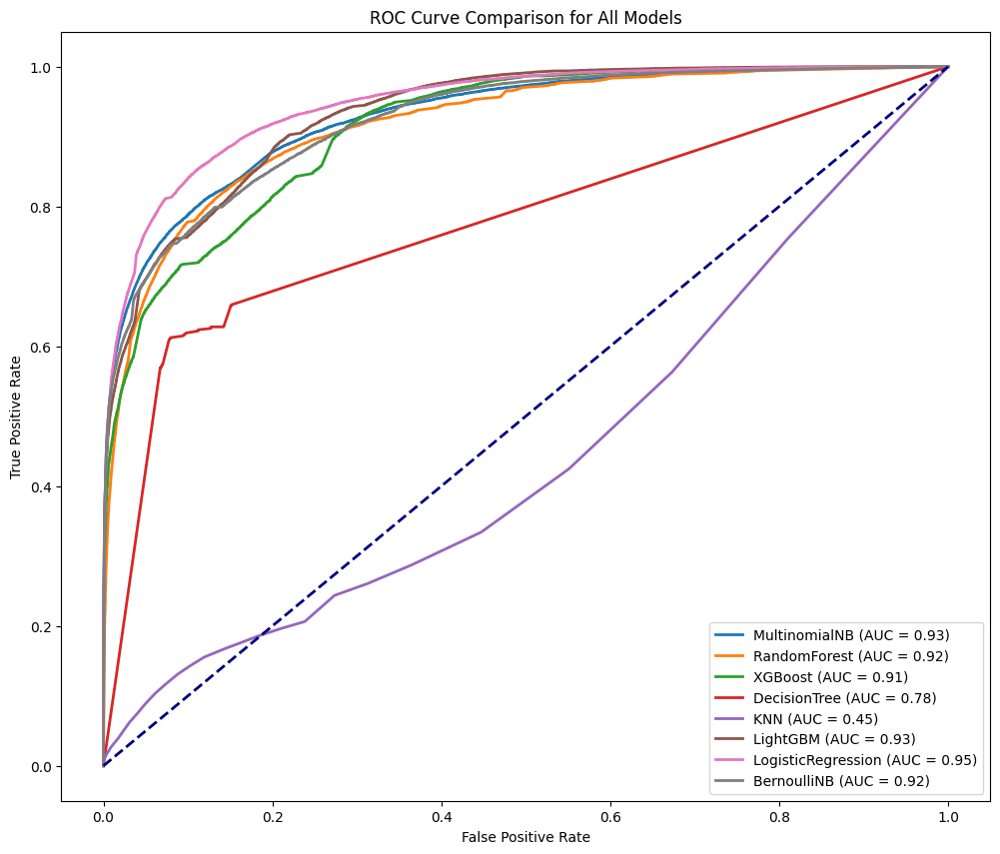

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **SMOTEENN**

In [ ]:
from imblearn.combine import SMOTEENN

In [ ]:
smote_enn = SMOTEENN(random_state=42)
X_train, y_train = smote_enn.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'EGY',
    1: 'GLF',
    2: 'IRQ',
    3: 'LEV',
    4: 'MGH',
    5: 'general'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 5))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-76-ad676554658d>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-76-ad676554658d>:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


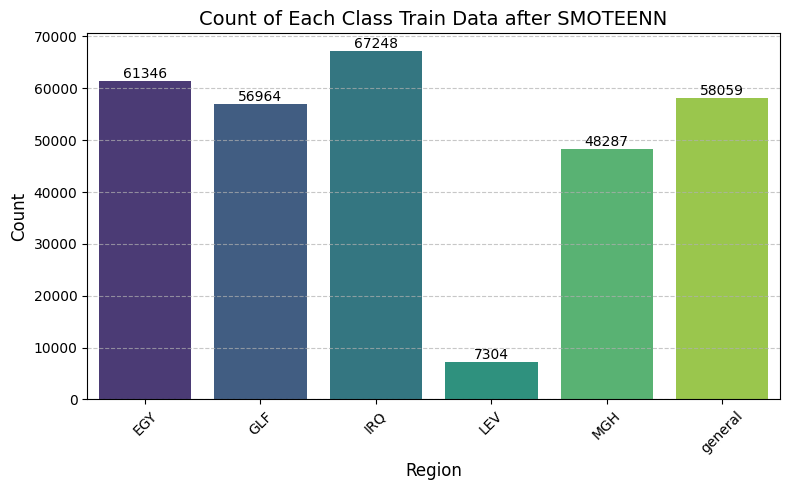

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTEENN")

## Multinomial NB- 51.70%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.5170124155272671
Classification Report:
               precision    recall  f1-score   support

           0       0.18      0.77      0.30       904
           1       0.19      0.64      0.29      1277
           2       0.01      0.44      0.02        39
           3       1.00      0.43      0.60     17072
           4       0.86      0.73      0.79      5652
           5       0.05      0.33      0.09       508

    accuracy                           0.52     25452
   macro avg       0.38      0.56      0.35     25452
weighted avg       0.88      0.52      0.61     25452



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.07 seconds
Accuracy: 0.5170124155272671
Precision: 0.8768
Recall for : 0.5170
F1 Score:  0.6051
AUC Score: 0.9245
Balanced Accuracy: 0.5553
G-mean Score: 0.7107
pf Score: 0.0843
Bal Score :  0.6533109115105613


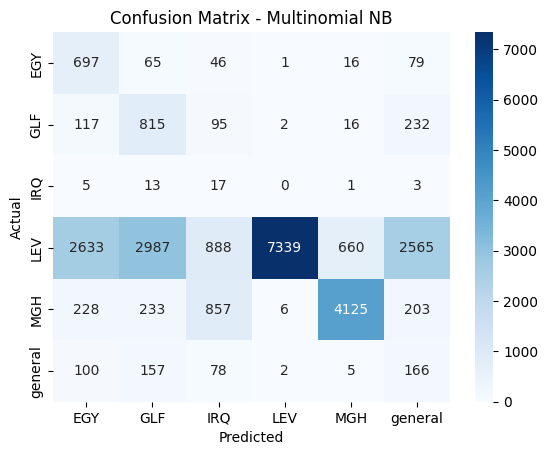

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -46.77%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4677432028917177
Classification Report:
               precision    recall  f1-score   support

           0       0.21      0.61      0.31       904
           1       0.13      0.63      0.21      1277
           2       0.01      0.15      0.02        39
           3       0.96      0.33      0.49     17072
           4       0.62      0.86      0.72      5652
           5       0.05      0.21      0.08       508

    accuracy                           0.47     25452
   macro avg       0.33      0.47      0.30     25452
weighted avg       0.80      0.47      0.51     25452



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 820.96 seconds
Accuracy: 0.4677432028917177
Precision: 0.7986
Recall for : 0.4677
F1 Score:  0.5091
AUC Score: 0.8686
Balanced Accuracy: 0.4657
G-mean Score: 0.6607
pf Score: 0.0998
Bal Score :  0.6170736233652367


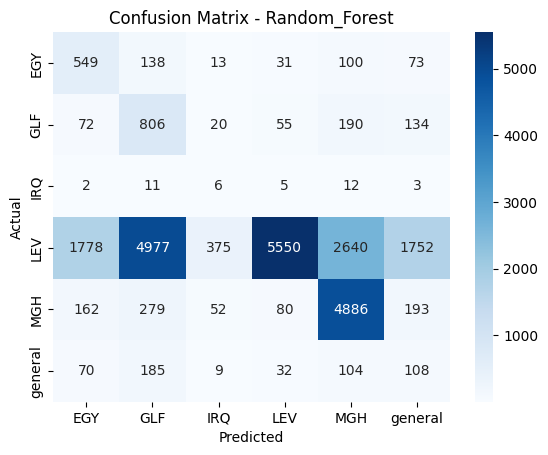

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 43.13%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4312824139556813
Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.63      0.36       904
           1       0.21      0.58      0.30      1277
           2       0.05      0.36      0.09        39
           3       0.99      0.34      0.50     17072
           4       0.69      0.64      0.66      5652
           5       0.04      0.59      0.07       508

    accuracy                           0.43     25452
   macro avg       0.37      0.52      0.33     25452
weighted avg       0.84      0.43      0.51     25452



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 338.00 seconds
Accuracy: 0.4312824139556813
Precision: 0.8376
Recall for : 0.4313
F1 Score:  0.5134
AUC Score: 0.8438
Balanced Accuracy: 0.5225
G-mean Score: 0.6444
pf Score: 0.1010
Bal Score :  0.5915650707272135


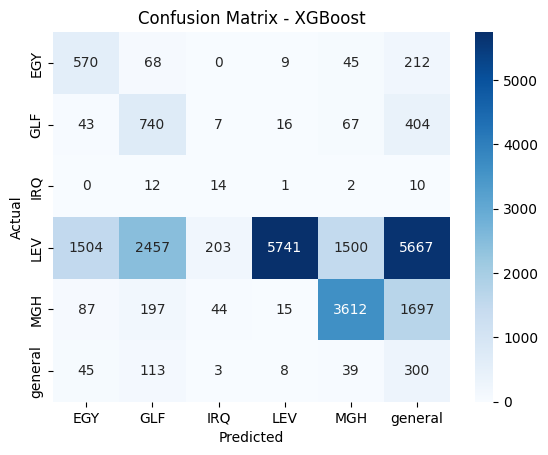

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 44.92%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.44915920163444917
Classification Report:
               precision    recall  f1-score   support

           0       0.18      0.55      0.28       904
           1       0.12      0.51      0.19      1277
           2       0.03      0.33      0.05        39
           3       0.95      0.32      0.48     17072
           4       0.58      0.83      0.69      5652
           5       0.04      0.20      0.06       508

    accuracy                           0.45     25452
   macro avg       0.32      0.46      0.29     25452
weighted avg       0.78      0.45      0.49     25452



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 85.25 seconds
Accuracy: 0.44915920163444917
Precision: 0.7798
Recall for : 0.4492
F1 Score:  0.4941
AUC Score: 0.6864
Balanced Accuracy: 0.4584
G-mean Score: 0.6441
pf Score: 0.1045
Bal Score :  0.6035437283336381


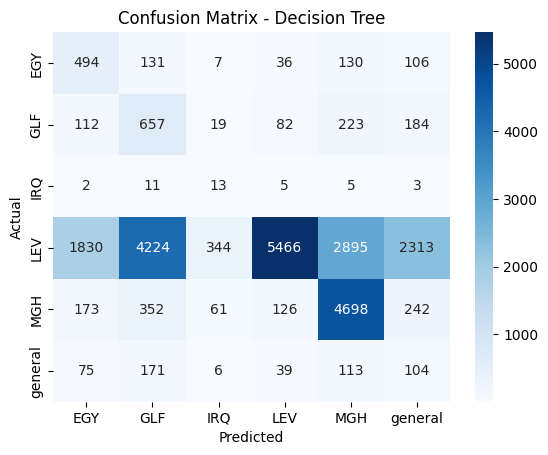

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 17.48%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.17476033317617476
Classification Report:
               precision    recall  f1-score   support

           0       0.09      0.50      0.15       904
           1       0.12      0.31      0.17      1277
           2       0.00      0.26      0.01        39
           3       0.98      0.02      0.04     17072
           4       0.82      0.52      0.64      5652
           5       0.03      0.51      0.05       508

    accuracy                           0.17     25452
   macro avg       0.34      0.35      0.18     25452
weighted avg       0.85      0.17      0.19     25452



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.03 seconds
Accuracy: 0.17476033317617476
Precision: 0.8478
Recall for : 0.1748
F1 Score:  0.1857
AUC Score: 0.6594
Balanced Accuracy: 0.3529
G-mean Score: 0.4119
pf Score: 0.1424
Bal Score :  0.4078438939377026


## LightGBM Model -46.64%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 16.619179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 307756
[LightGBM] [Info] Number of data points in the train set: 299208, number of used features: 4057
[LightGBM] [Info] Start training from score -1.584609
[LightGBM] [Info] Start training from score -1.658719
[LightGBM] [Info] Start training from score -1.492752
[LightGBM] [Info] Start training from score -3.712717
[LightGBM] [Info] Start training from score -1.823977
[LightGBM] [Info] Start training from score -1.639679


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.4663680653779664
Classification Report:
               precision    recall  f1-score   support

           0       0.22      0.66      0.33       904
           1       0.20      0.61      0.30      1277
           2       0.03      0.36      0.05        39
           3       0.99      0.37      0.54     17072
           4       0.77      0.69      0.73      5652
           5       0.04      0.56      0.08       508

    accuracy                           0.47     25452
   macro avg       0.37      0.54      0.34     25452
weighted avg       0.85      0.47      0.55     25452



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 185.53 seconds
Accuracy: 0.4663680653779664
Precision: 0.8530
Recall for : 0.4664
F1 Score:  0.5510
AUC Score: 0.8727
Balanced Accuracy: 0.5407
G-mean Score: 0.6714
pf Score: 0.0945
Bal Score :  0.6167914082266138


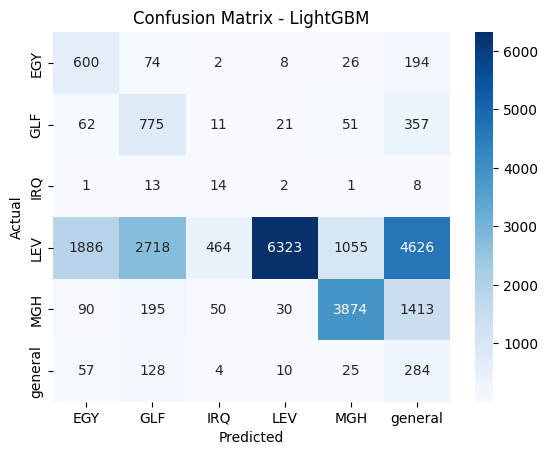

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 47.28%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.4728115668709728
Classification Report:
               precision    recall  f1-score   support

           0       0.18      0.73      0.29       904
           1       0.18      0.65      0.28      1277
           2       0.02      0.44      0.03        39
           3       0.99      0.36      0.53     17072
           4       0.81      0.74      0.77      5652
           5       0.05      0.43      0.08       508

    accuracy                           0.47     25452
   macro avg       0.37      0.56      0.33     25452
weighted avg       0.86      0.47      0.55     25452



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 22.96 seconds
Accuracy: 0.4728115668709728
Precision: 0.8610
Recall for : 0.4728
F1 Score:  0.5514
AUC Score: 0.9095
Balanced Accuracy: 0.5571
G-mean Score: 0.6769
pf Score: 0.0930
Bal Score :  0.6214661604789185


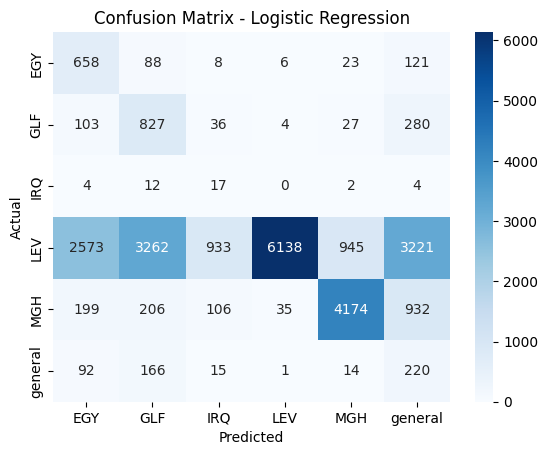

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 68.06%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.6805752003771806
Classification Report:
               precision    recall  f1-score   support

           0       0.31      0.57      0.40       904
           1       0.24      0.54      0.34      1277
           2       0.04      0.33      0.07        39
           3       0.99      0.62      0.77     17072
           4       0.79      0.92      0.85      5652
           5       0.08      0.49      0.13       508

    accuracy                           0.68     25452
   macro avg       0.41      0.58      0.43     25452
weighted avg       0.87      0.68      0.74     25452



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.10 seconds
Accuracy: 0.6805752003771806
Precision: 0.8667
Recall for : 0.6806
F1 Score:  0.7368
AUC Score: 0.9057
Balanced Accuracy: 0.5800
G-mean Score: 0.8124
pf Score: 0.0583
Bal Score :  0.7704056343229201


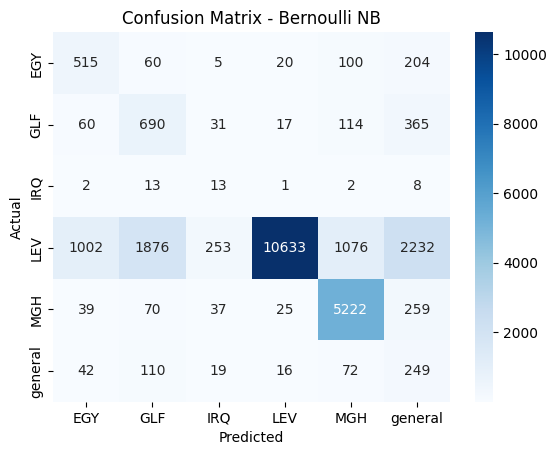

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

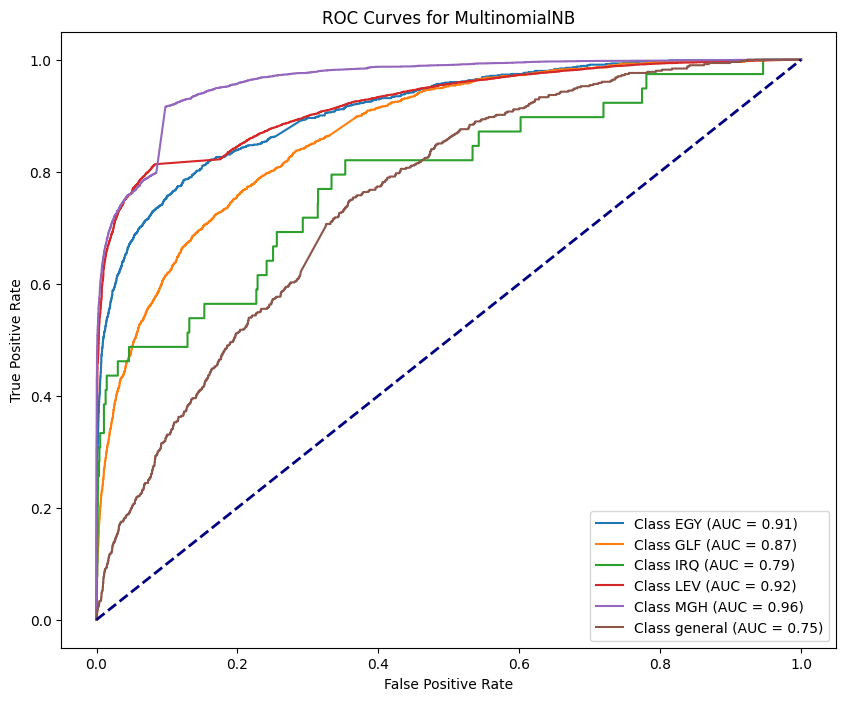

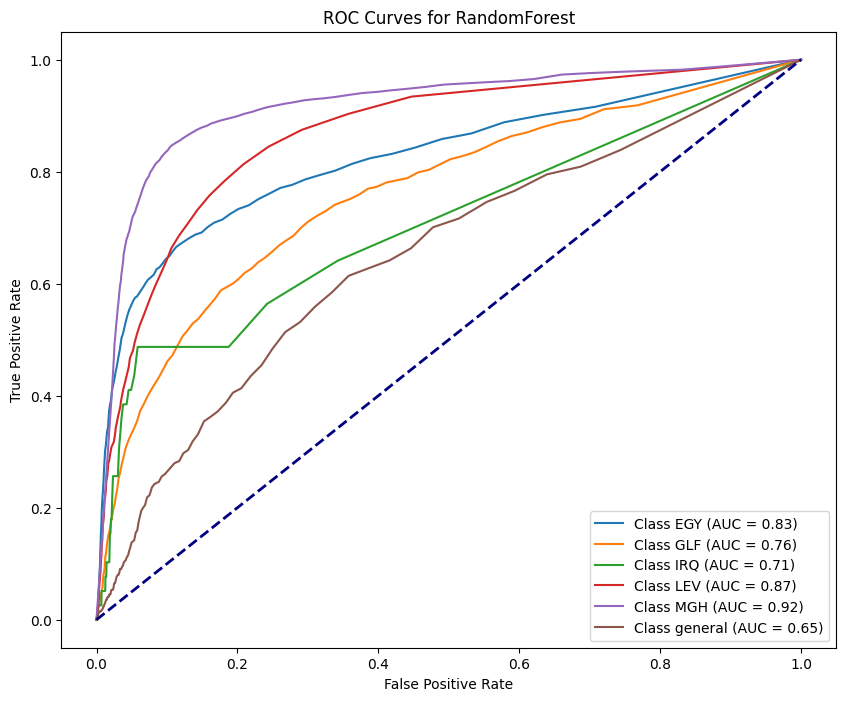

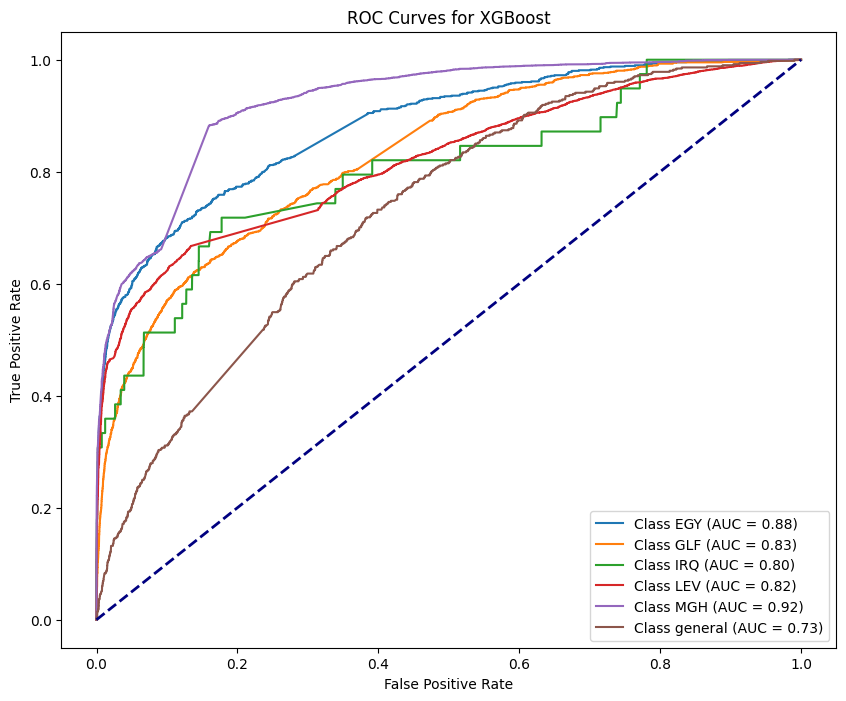

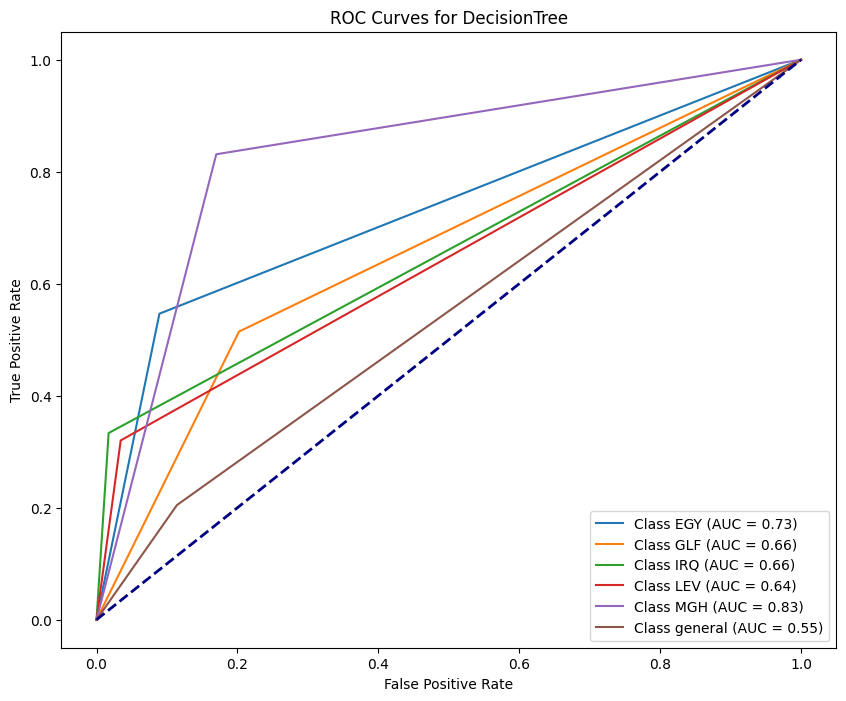

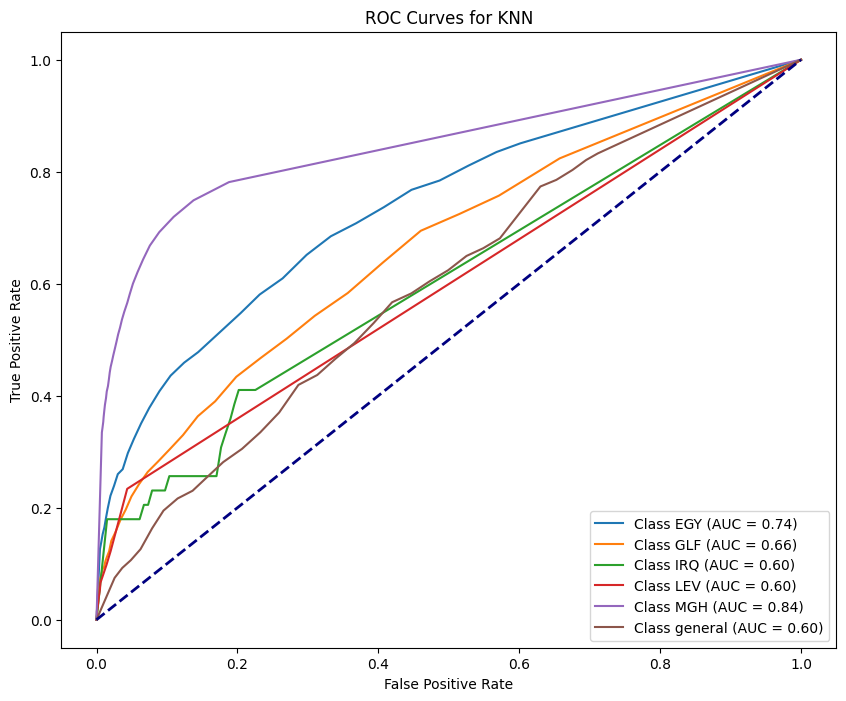

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


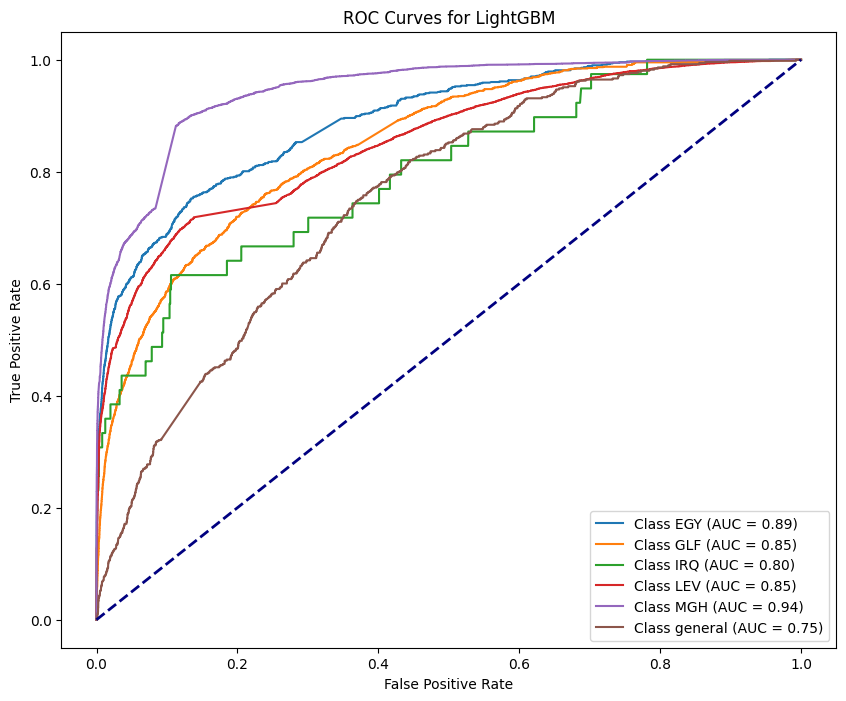

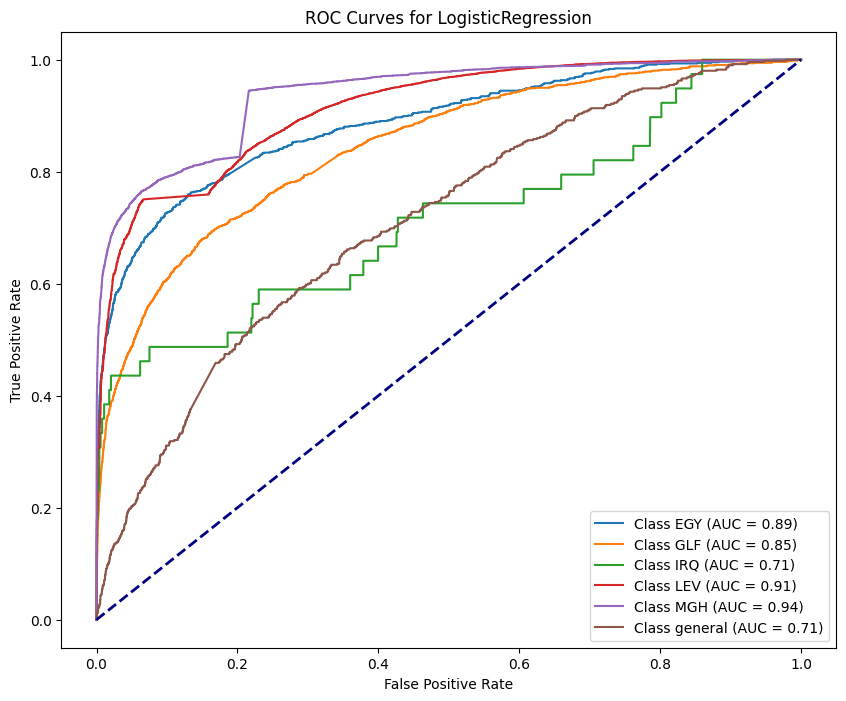

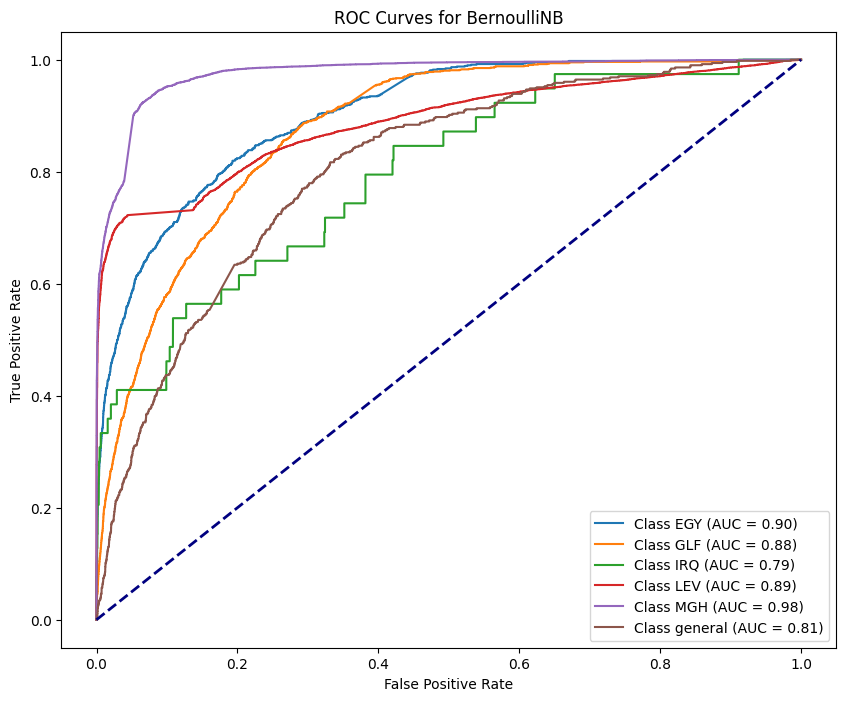

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


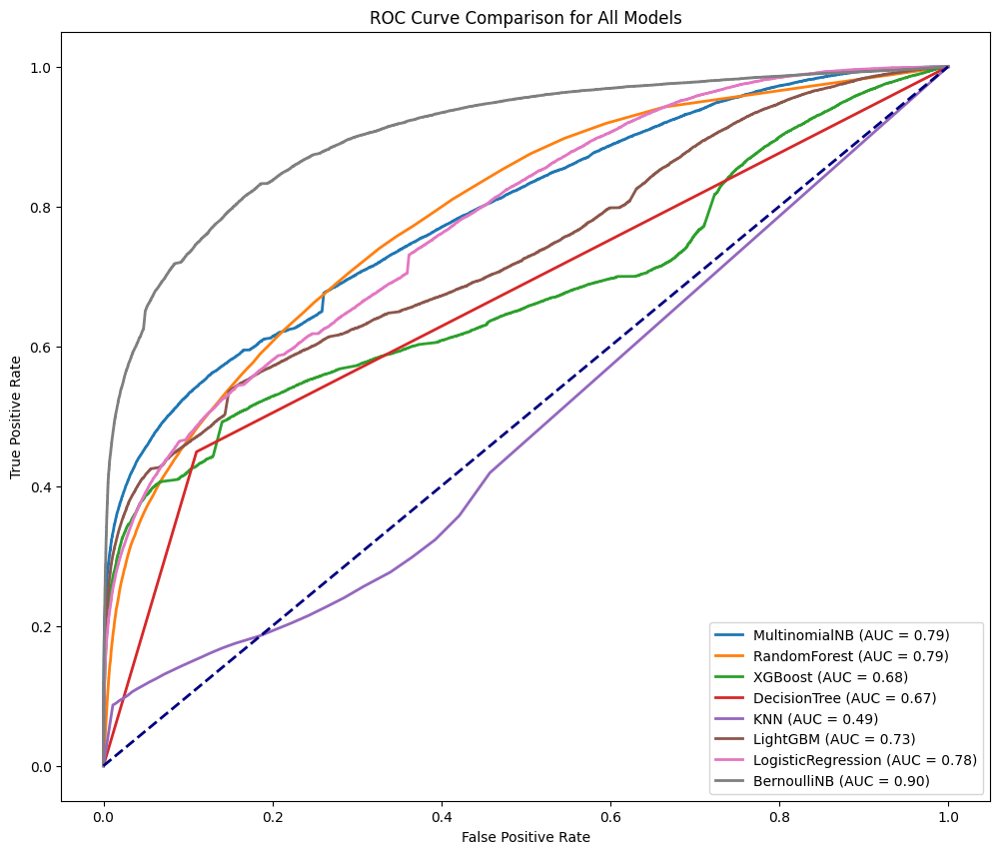

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()